In [1]:
import pickle
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statistics as stat
import time
%matplotlib inline

from sklearn.metrics import accuracy_score

from nilearn.connectome import ConnectivityMeasure

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.metrics import f1_score

import networkx as nx
import torch
import torch_geometric.utils
from torch_geometric.data import Data, DataLoader
from torch.nn import Linear
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.nn import global_mean_pool, global_max_pool, global_add_pool

from sklearn import svm

import pickle5 as pickle
import os

from typing import Optional, Tuple
from torch_geometric.typing import Adj, OptTensor, PairTensor

# from pytorch_lightning.callbacks.early_stopping import EarlyStopping
import torch
from torch import Tensor
from torch.nn import Parameter
from torch_scatter import scatter_add
from torch_sparse import SparseTensor, matmul, fill_diag, sum as sparsesum, mul
from torch_geometric.nn.conv import MessagePassing
from torch_geometric.utils import add_remaining_self_loops
from torch_geometric.utils.num_nodes import maybe_num_nodes
from torch import softmax

import cpnet
import pprint

In [2]:
def save_obj(dictionary, path):
    with open(path + '.pkl', 'wb') as f:
        pickle.dump(dictionary, f)
    f.close()

def load_obj(path):
    with open(path + '.pkl', 'rb') as f:
        return pickle.load(f)

In [3]:
AD_dict = load_obj('AAL_data/timeseries/AD')
CN_dict = load_obj('AAL_data/timeseries/CN')

AD_train = load_obj('AAL_data/AD_train_full')
AD_val = load_obj('AAL_data/AD_val_full')
AD_test = load_obj('AAL_data/AD_test_full')

CN_train = load_obj('AAL_data/CN_train_full')
CN_val = load_obj('AAL_data/CN_val_full')
CN_test = load_obj('AAL_data/CN_test_full')

partition = load_obj('AAL_data/core_peri_partition')

In [4]:
# p = [2,3,6,7,22,23,30,31,42,43,44,45,46,47,48,49,50,51,52,53,54,55,64,98]
# partition = {}

# for i in range(116):
#     if i in p:
#         partition[i] = 1
#     else:
#         partition[i] = 0
partition[2]==1

True

In [5]:
def get_correlation_matrix(timeseries,msr):
    correlation_measure = ConnectivityMeasure(kind=msr)
    correlation_matrix = correlation_measure.fit_transform([timeseries])[0]
    return correlation_matrix

def get_upper_triangular_matrix(matrix):
    upp_mat = []
    for i in range(len(matrix)):
        for j in range(i+1,len(matrix)):
            upp_mat.append(matrix[i][j])
    return upp_mat

    
# def get_adj_mat(correlation_matrix, threshold_value, weighted = True):
#     adj_mat = []
#     for i in correlation_matrix:
#         row = []
#         for j in i:
#             if abs(j)>threshold_value:
#                 if not weighted:
#                     row.append(1)
#                 else:
#                     row.append(abs(j))
#             else:
#                 row.append(0)
#         adj_mat.append(row)
#     return adj_mat


def get_adj_mat(correlation_matrix, th_cp, th_pp, partition):
    adj_mat = []

    for i in range(len(correlation_matrix)):
        row = []
                   
        for j in range(len(correlation_matrix[0])):
                       
            if partition[i]!=partition[j]:
                if abs(correlation_matrix[i][j])>th_cp:
                    row.append(abs(correlation_matrix[i][j]))
                else:
                    row.append(0)
            
            elif partition[i]==0:
                if abs(correlation_matrix[i][j])>th_pp:
                    row.append(abs(correlation_matrix[i][j]))
                else:
                    row.append(0)
            
            else:
                row.append(abs(correlation_matrix[i][j]))
                
        adj_mat.append(row)
    return adj_mat

# def get_adj_mat(correlation_matrix, th_value_p, th_value_n):
#     adj_mat = []
#     k=0
#     for i in correlation_matrix:
#         row = []
#         for j in i:
#             if j>0:
#                 if j > th_value_p:
#                     row.append(j)
#                 else:
#                     row.append(0)
#             else:
#                 if abs(j) > th_value_n:
#                     row.append(abs(j))
#                 else:
#                     row.append(0)
#         adj_mat.append(row)
# #     adj_mat = connect_isolated_nodes(adj_mat, correlation_matrix)
#     return adj_mat

def connect_isolated_nodes(adj_mat, correlation_matrix):
    correlation_matrix = list(np.array(correlation_matrix) - np.array(np.eye(len(correlation_matrix))))
    correlation_matrix = [list(a) for a in correlation_matrix]
                              
    for row_num in range(len(adj_mat)):
        if sum(adj_mat[row_num]) == 0:
            index_max_element_corr_row = correlation_matrix[row_num].index(max(correlation_matrix[row_num]))
            adj_mat[row_num][index_max_element_corr_row] = 1
    return adj_mat
    
# def get_threshold_value(ad_timeseires, cn_timeseries, measure, threshold_percent):
#     ad_corr_mats = [get_correlation_matrix(ts, measure) for ts in ad_timeseires]
#     cn_corr_mats = [get_correlation_matrix(ts, measure) for ts in cn_timeseries]

#     ad_upper = [get_upper_triangular_matrix(matrix) for matrix in ad_corr_mats]
#     cn_upper = [get_upper_triangular_matrix(matrix) for matrix in cn_corr_mats]

#     all_correlation_values = ad_upper + cn_upper
#     all_correlation_values = np.array(all_correlation_values).flatten()

#     all_correlation_values = np.array([abs(i) for i in all_correlation_values])
#     all_correlation_values = np.sort(all_correlation_values)[::-1]

#     th_val_index = (len(all_correlation_values)*threshold_percent)//100
#     return all_correlation_values[int(th_val_index)]


# def get_threshold_value(ad_timeseires, cn_timeseries, measure, threshold_percent):
#     ad_corr_mats = [get_correlation_matrix(ts, measure) for ts in ad_timeseires]
#     cn_corr_mats = [get_correlation_matrix(ts, measure) for ts in cn_timeseries]

#     ad_upper = [get_upper_triangular_matrix(matrix) for matrix in ad_corr_mats]
#     cn_upper = [get_upper_triangular_matrix(matrix) for matrix in cn_corr_mats]

#     all_correlation_values = ad_upper + cn_upper
#     all_correlation_values = np.array(all_correlation_values).flatten()
    
#     all_correlation_values_pos=[]
#     all_correlation_values_neg=[]
#     for i in all_correlation_values:
#         if i==1:
#             continue
#         elif i>0:
#             all_correlation_values_pos.append(i)
#         else:  
#             all_correlation_values_neg.append(abs(i))

#     all_correlation_values_pos = np.array(all_correlation_values_pos)
#     all_correlation_values_pos = np.sort(all_correlation_values_pos)[::-1]
    
#     all_correlation_values_neg = np.array(all_correlation_values_neg)
#     all_correlation_values_neg = np.sort(all_correlation_values_neg)[::-1]

#     th_val_index = (len(all_correlation_values)*threshold_percent)//100
    
#     return all_correlation_values_pos[int(th_val_index)], all_correlation_values_neg[int(th_val_index)]

def create_graph(timeseries, th_cp, th_pp, y, partition, measure='correlation'):
    correlation_matrix = get_correlation_matrix(timeseries, measure)
    adj_mat = get_adj_mat(correlation_matrix, th_cp, th_pp, partition)

    G = nx.from_numpy_matrix(np.array(adj_mat), create_using=nx.DiGraph)
    data=torch_geometric.utils.from_networkx(G)
    data['x'] = torch.tensor(correlation_matrix, dtype=torch.float)
    data['y'] = torch.tensor([y])

    if torch.cuda.is_available():
        device = torch.device('cuda:1')
        data = data.to(device)
        return data
  
    return data

In [6]:
# def get_avg_corr_mat(train_series):    
#     all_correlation_matrices = []
#     for timeseries in train_series:
#         all_correlation_matrices.append(get_correlation_matrix(timeseries,'correlation'))

#     avg_correlation_matrices = np.mean(np.array(all_correlation_matrices),axis=0)
#     return avg_correlation_matrices

# def find_coreness(avg_correlation_matrices, coreness_th = 0.7, th_p=0, th_n=0):
#     correlation_matrix = avg_correlation_matrices
#     adj_mat = get_adj_mat(avg_correlation_matrix, th_p, th_n)
#     G = nx.from_numpy_matrix(np.array(adj_mat), create_using=nx.DiGraph)
    
#     algorithm = cpnet.Rombach()

#     algorithm.detect(G)

#     x = algorithm.get_coreness()

#     s = list(x.values())
#     sort_index = np.argsort(s)[::-1]

#     A = nx.adjacency_matrix(G).todense()
#     A = np.array(A)
#     A1 = [[A[i][j] for j in sort_index] for i in sort_index]
# #     plt.imshow(A1,'gray',vmin=0,vmax=1)
# #     plt.imsave(fnamearr=A1,vmin=0,vmax=1,cmap='gray')
# #     print(x)
# #     print(list(x.values()))
    
#     return list(x.values()),A1
# #     print(sort_index)

In [7]:
# x = pd.DataFrame(columns=[1,2,3,4,5,6,7,8,9,10])

# for i in range(1,11):
#     print(i)
#     partition,A1 = find_coreness(avg_correlation_matrix)
#     x[i] = pd.Series(partition)
#     plt.imsave(fname = f"adj_{i}.png",arr=A1,vmin=0,vmax=1,cmap='gray')

In [8]:
# x.to_csv("coreness.csv")

In [9]:
from torch_geometric.nn import GCNConv
from torch_geometric.nn import GraphConv

num_classes = 2

class GNN(torch.nn.Module):
    def __init__(self, dim1, num_hidden_channels, hidden_channels_dims):
        super(GNN, self).__init__()
        torch.manual_seed(0)
        self.num_hidden_channels = num_hidden_channels
        self.hidden_channels_dims = hidden_channels_dims
        self.conv1 = GCNConv(dim1, hidden_channels_dims[0])
        self.conv2 = GCNConv(hidden_channels_dims[0], hidden_channels_dims[1])
        self.conv3 = GCNConv(hidden_channels_dims[1], hidden_channels_dims[2])
        self.lin1 = Linear(hidden_channels_dims[-1], 2)

    def forward(self, x1, edge_index1, edge_weight1, batch1):

        x1= self.conv1(x1, edge_index1, edge_weight1)
        x1 = x1.relu()
#         x1 = x1.tanh()
        x1 = F.dropout(x1, p=0.5, training=self.training)
        
        x1 = self.conv2(x1, edge_index1, edge_weight1)
        x1 = x1.relu()
#         x1 = x1.tanh()
        x1 = F.dropout(x1, p=0.5, training=self.training)
        
        x1 = self.conv3(x1, edge_index1, edge_weight1)
        x1 = x1.relu()
#         x1 = x1.tanh()
        x1 = F.dropout(x1, p=0.5, training=self.training)

        x1 = global_mean_pool(x1, batch1)
        x1 = self.lin1(x1)
#         x1 = torch.softmax(x1,dim=1)
        
        return x1

In [10]:
class EarlyStopping:
    """Early stops the training if validation acc doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation acc improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation acc improvement. 
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print            
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_acc_max = 0
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
        
    def __call__(self, val_acc, model):

        score = val_acc

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_acc, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_acc, model)
            self.counter = 0

    def save_checkpoint(self, val_acc, model):
        '''Saves model when validation acc increase.'''
        if self.verbose:
            self.trace_func(f'Validation acc increased ({self.val_acc_max:.6f} --> {val_acc:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_acc_max = val_acc

In [11]:
def train(model):
    model.train()

    for data in train_loader:  # Iterate in batches over the training dataset.
        out = model(data.x, data.edge_index, data.weight, data.batch)  # Perform a single forward pass.
        loss = criterion(out, data.y)  # Compute the loss.
        loss.backward()  # Derive gradients.
        optimizer.step()  # Update parameters based on gradients.
        optimizer.zero_grad()  # Clear gradients.

def test(test_loader):
    model.eval()

    correct = 0
    for data in test_loader:  # Iterate in batches over the training/test dataset.
        out = model(data.x, data.edge_index, data.weight, data.batch)  
        pred = out.argmax(dim=1)  # Use the class with highest probability.
        correct += int((pred == data.y).sum())  
    return correct / len(test_loader.dataset)

def f1(loader):
    model.eval()

    y_true = []
    y_pred = []

    for data in loader:
        out = model(data.x, data.edge_index, data.weight, data.batch)
        pred = out.argmax(dim=1)
        y_pred += pred.cpu().detach().tolist()
        y_true += data.y.cpu().detach().tolist()

    return f1_score(y_true,y_pred)

In [12]:
def avg_acc(model,checkpt_path,loader,seeds):
    if torch.cuda.is_available():
        device = torch.device('cuda:1')
        model.to(device)
    accs = []
    for i in range(1,seeds+1):
        checkpt_path = checkpt_path
        model.load_state_dict(torch.load(checkpt_path+f"/checkpoint_seed_{i}.pt"))
        x = test(loader)
        accs.append(x)
    return accs

In [13]:
model = GNN(dim1 = 116, num_hidden_channels = 3, hidden_channels_dims = [32, 16,8])
print(model)
print("Number of parameters: ", sum(p.numel() for p in model.parameters()))

GNN(
  (conv1): GCNConv(116, 32)
  (conv2): GCNConv(32, 16)
  (conv3): GCNConv(16, 8)
  (lin1): Linear(in_features=8, out_features=2, bias=True)
)
Number of parameters:  4426


Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.405405).  Saving model ...
Validation acc increased (0.405405 --> 0.618557).  Saving model ...
Validation acc increased (0.618557 --> 0.666667).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.666667 --> 0.737705).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.737705 --> 0.768000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

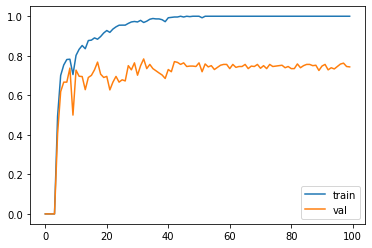

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.680412).  Saving model ...
Validation acc increased (0.680412 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.736842 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.752137 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.762712 --> 0.778761).  Saving model ...
EarlyStopping counter: 1 out

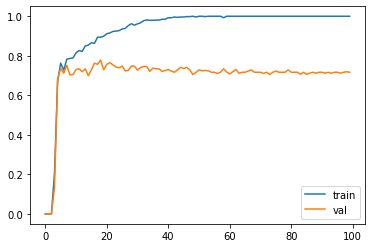

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.674419).  Saving model ...
Validation acc increased (0.674419 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.750000 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 ou

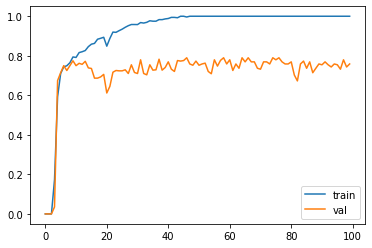

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.595238).  Saving model ...
Validation acc increased (0.595238 --> 0.653465).  Saving model ...
Validation acc increased (0.653465 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.715596 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.758621 --> 0.774194).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 

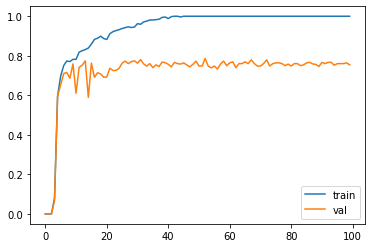

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.550000).  Saving model ...
Validation acc increased (0.550000 --> 0.705882).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.705882 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping count

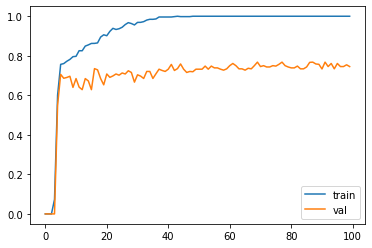

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.405405).  Saving model ...
Validation acc increased (0.405405 --> 0.580645).  Saving model ...
Validation acc increased (0.580645 --> 0.610526).  Saving model ...
Validation acc increased (0.610526 --> 0.634615).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.634615 --> 0.666667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.666667 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.689655).  Saving model ...


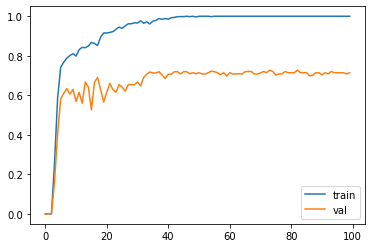

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.432432).  Saving model ...
Validation acc increased (0.432432 --> 0.536585).  Saving model ...
Validation acc increased (0.536585 --> 0.691589).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.691589 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.719298 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

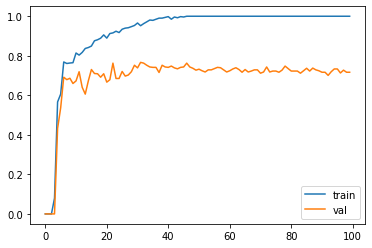

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.688172).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.688172 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733333 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.733333 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3

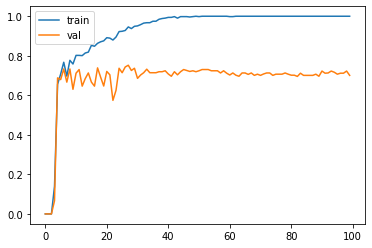

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.645833).  Saving model ...
Validation acc increased (0.645833 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.740741 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.743363 --> 0.746032).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.746032 --> 0.774194).  Saving model ...
EarlyStopping counter: 1 out

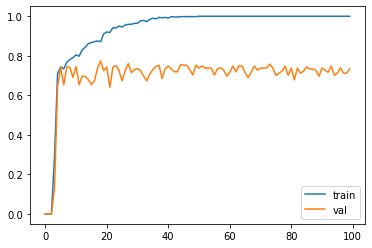

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.606061).  Saving model ...
Validation acc increased (0.606061 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.672897).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.672897 --> 0.700855).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.700855 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out

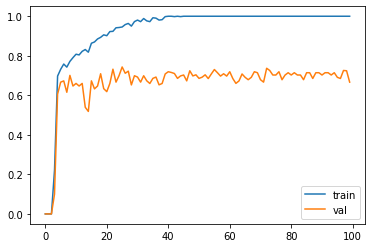

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.680851).  Saving model ...
Validation acc increased (0.680851 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.763636).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping c

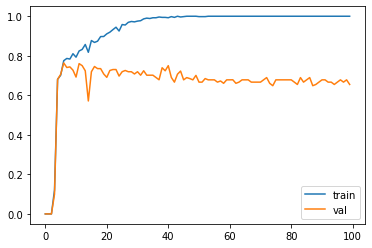

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.651163).  Saving model ...
Validation acc increased (0.651163 --> 0.723810).  Saving model ...
Validation acc increased (0.723810 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.728972 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.738739 --> 0.752137).  Saving model ...
Validation acc increased (0.752137 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.762712 --> 0.766667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200


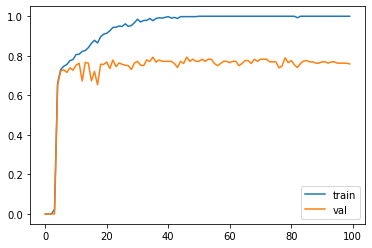

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.294118).  Saving model ...
Validation acc increased (0.294118 --> 0.638298).  Saving model ...
Validation acc increased (0.638298 --> 0.673267).  Saving model ...
Validation acc increased (0.673267 --> 0.709091).  Saving model ...
Validation acc increased (0.709091 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.710280 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.713043 --> 0.728814).  Saving model ...
Validation acc increased (0.7288

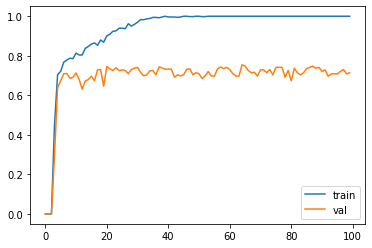

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.574713).  Saving model ...
Validation acc increased (0.574713 --> 0.623656).  Saving model ...
Validation acc increased (0.623656 --> 0.673267).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.673267 --> 0.679245).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.679245 --> 0.711864).  Saving model ...
Validation acc increased (0.711864 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

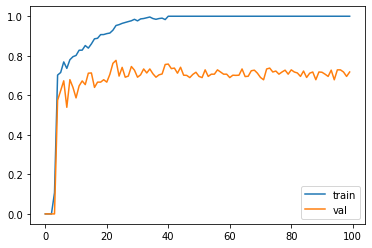

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.222222).  Saving model ...
Validation acc increased (0.222222 --> 0.585366).  Saving model ...
Validation acc increased (0.585366 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
Validation acc 

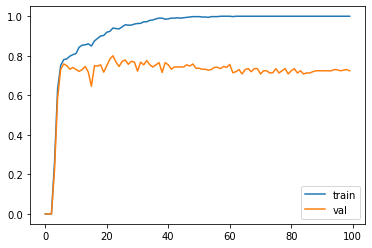

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.555556).  Saving model ...
Validation acc increased (0.555556 --> 0.634615).  Saving model ...
Validation acc increased (0.634615 --> 0.672897).  Saving model ...
Validation acc increased (0.672897 --> 0.678899).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.678899 --> 0.684211).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.684211 --> 0.694915).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.694915 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200


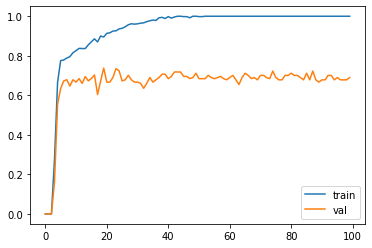

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.597701).  Saving model ...
Validation acc increased (0.597701 --> 0.640777).  Saving model ...
Validation acc increased (0.640777 --> 0.647059).  Saving model ...
Validation acc increased (0.647059 --> 0.696429).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.696429 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.697248 --> 0.702703).  Saving model ...
Validation acc increased (0.702703 --> 0.714286).  Saving model ...


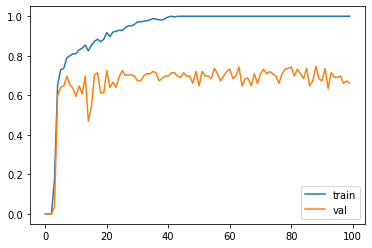

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.163934).  Saving model ...
Validation acc increased (0.163934 --> 0.645833).  Saving model ...
Validation acc increased (0.645833 --> 0.680412).  Saving model ...
Validation acc increased (0.680412 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.713043 --> 0.766667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 

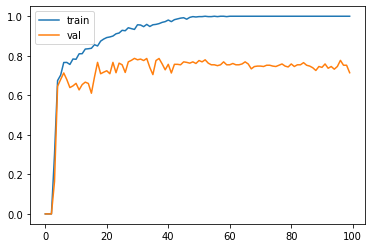

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.530120).  Saving model ...
Validation acc increased (0.530120 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.707965 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.762712 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

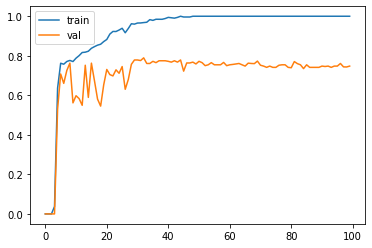

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.525000).  Saving model ...
Validation acc increased (0.525000 --> 0.597938).  Saving model ...
Validation acc increased (0.597938 --> 0.632653).  Saving model ...
Validation acc increased (0.632653 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.714286 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out

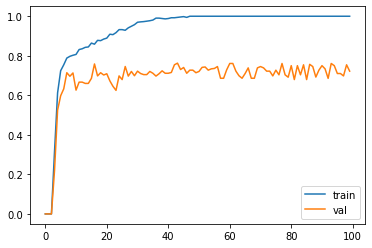

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.666667).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.666667 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.709091 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.722222 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.722222 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.725664 -

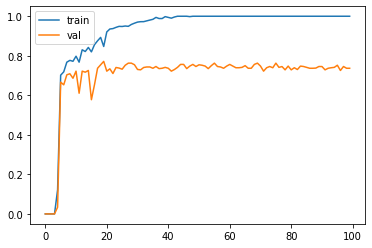

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.637363).  Saving model ...
Validation acc increased (0.637363 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.680000).  Saving model ...
Validation acc increased (0.680000 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.713043 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.713043 --> 0.739496).  Saving model ...
EarlyStopping counter: 1 out of 200
Earl

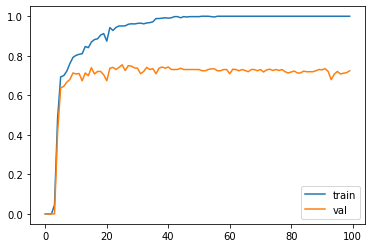

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.622222).  Saving model ...
Validation acc increased (0.622222 --> 0.700000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.700000 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.723810 --> 0.728814).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.728814 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

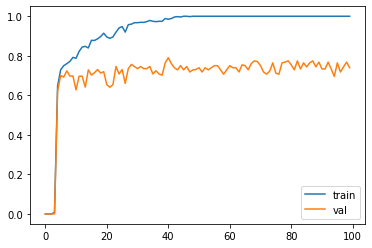

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.246154).  Saving model ...
Validation acc increased (0.246154 --> 0.564706).  Saving model ...
Validation acc increased (0.564706 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.724138 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping count

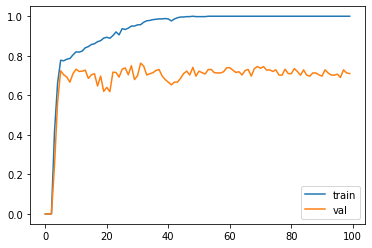

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.193548).  Saving model ...
Validation acc increased (0.193548 --> 0.659574).  Saving model ...
Validation acc increased (0.659574 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.756757 --> 0.763636).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased

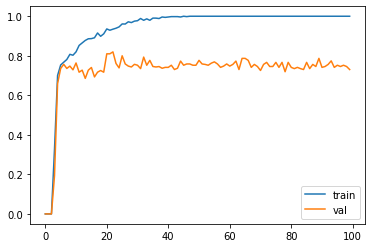

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.578313).  Saving model ...
Validation acc increased (0.578313 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
Validation acc increased (0.733945 --> 0.761905).  S

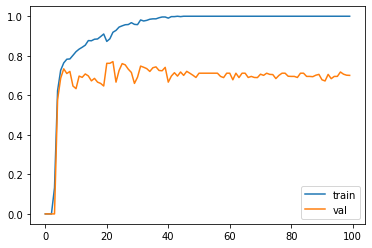

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.523810).  Saving model ...
Validation acc increased (0.523810 --> 0.593407).  Saving model ...
Validation acc increased (0.593407 --> 0.715447).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
Validation acc increased (0.715447 --> 0.716667).  S

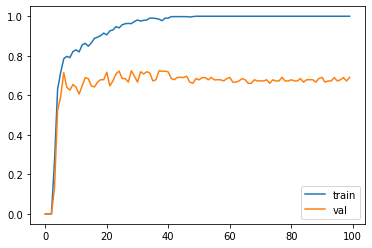

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.774775 --> 0.785714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.785714 --> 0.793103).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7

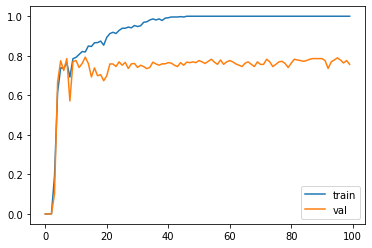

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.400000).  Saving model ...
Validation acc increased (0.400000 --> 0.680412).  Saving model ...
Validation acc increased (0.680412 --> 0.699029).  Saving model ...
Validation acc increased (0.699029 --> 0.718447).  Saving model ...
Validation acc increased (0.718447 --> 0.723810).  Saving model ...
Validation acc increased (0.723810 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.7521

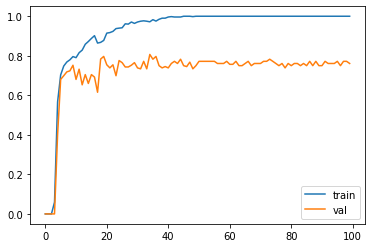

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.347826).  Saving model ...
Validation acc increased (0.347826 --> 0.560976).  Saving model ...
Validation acc increased (0.560976 --> 0.620000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.620000 --> 0.640777).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.640777 --> 0.653846).  Saving model ...
Validation acc increased (0.653846 --> 0.730435).  Saving model ...
Validation acc increased (0.730435 --> 0.770492).  Saving model 

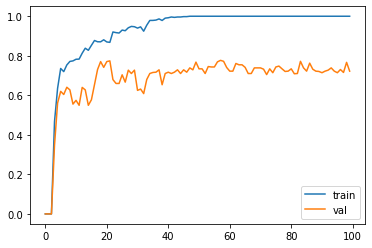

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.560976).  Saving model ...
Validation acc increased (0.560976 --> 0.622222).  Saving model ...
Validation acc increased (0.622222 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 o

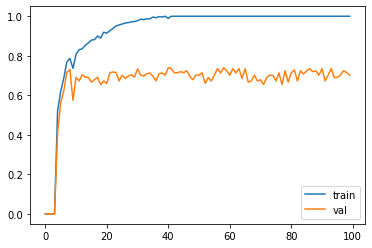

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.163934).  Saving model ...
Validation acc increased (0.163934 --> 0.604651).  Saving model ...
Validation acc increased (0.604651 --> 0.680000).  Saving model ...
Validation acc increased (0.680000 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745455 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.747664 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out

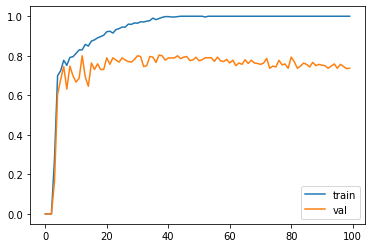

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.727273 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.727273 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

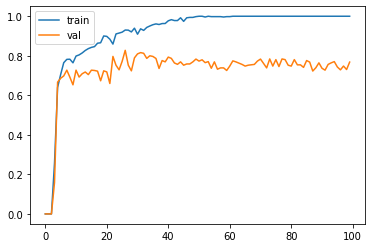

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.426667).  Saving model ...
Validation acc increased (0.426667 --> 0.630435).  Saving model ...
Validation acc increased (0.630435 --> 0.679245).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.679245 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.709091 --> 0.743802).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.743802 --> 0.758065).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 

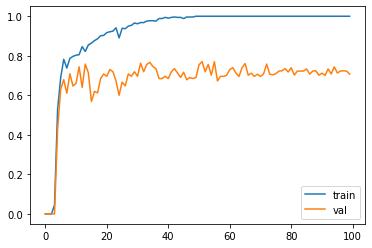

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.673267).  Saving model ...
Validation acc increased (0.673267 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.739496).  Saving model ...
Validation acc increased (0.739496 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.743363 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.750000 --> 0.773109).  Saving model ...
Validation acc increased (0.773109 -

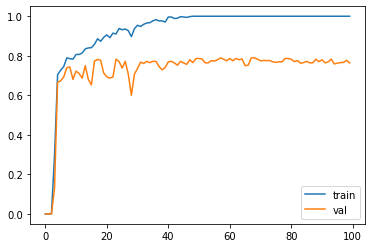

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.674157).  Saving model ...
Validation acc increased (0.674157 --> 0.695652).  Saving model ...
Validation acc increased (0.695652 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.722222 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.752137 --> 0.786325).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

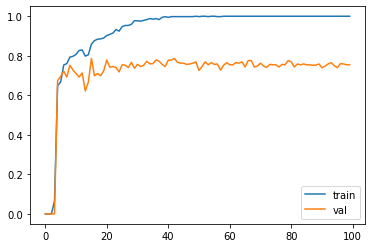

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.701031).  Saving model ...
Validation acc increased (0.701031 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.754386 --> 0.758065).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.758065 --> 0.760331).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.

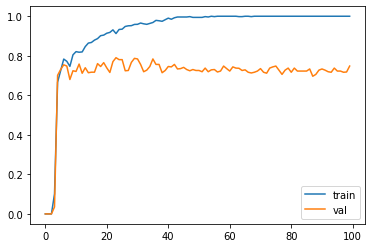

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.215385).  Saving model ...
Validation acc increased (0.215385 --> 0.712871).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.712871 --> 0.728814).  Saving model ...
Validation acc increased (0.728814 --> 0.739496).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter:

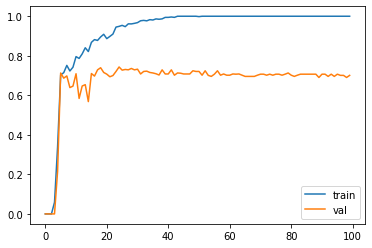

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.673267).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.673267 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping co

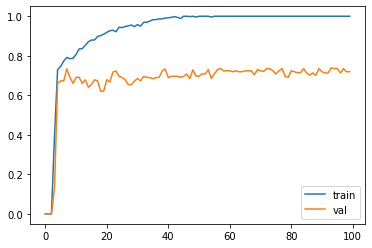

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.630435).  Saving model ...
Validation acc increased (0.630435 --> 0.699029).  Saving model ...
Validation acc increased (0.699029 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.702703 --> 0.739496).  Saving model ...
Validation acc increased (0.739496 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 

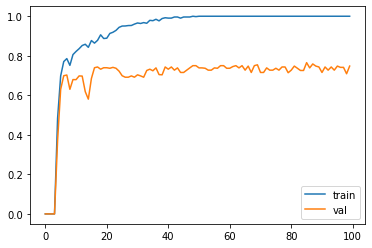

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.518519).  Saving model ...
Validation acc increased (0.518519 --> 0.699029).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.699029 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.732143 --> 0.739496).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 

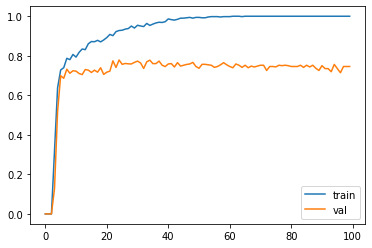

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.632653).  Saving model ...
Validation acc increased (0.632653 --> 0.685714).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.685714 --> 0.686869).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.686869 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.713043 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 

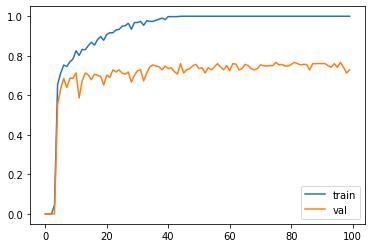

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.366197).  Saving model ...
Validation acc increased (0.366197 --> 0.606742).  Saving model ...
Validation acc increased (0.606742 --> 0.660194).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.660194 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.702703 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.722689).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.722689 --> 0.722689).  Saving model ...
EarlyStopping counter: 1 out of 

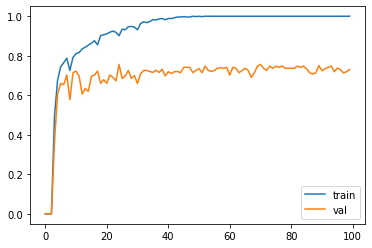

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.704762).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.704762 --> 0.752000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752000 --> 0.758621).  Saving model ...
Validation acc increased (0.758621 --> 0.771930).  Saving model ...
Validation acc increased (0.771930 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 

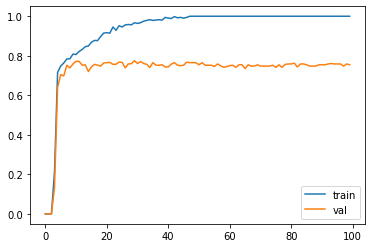

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.560976).  Saving model ...
Validation acc increased (0.560976 --> 0.653061).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.653061 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.724138 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.724138 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out

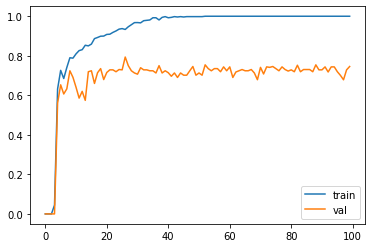

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.531646).  Saving model ...
Validation acc increased (0.531646 --> 0.680412).  Saving model ...
Validation acc increased (0.680412 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.752137 --> 0.760331).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.760331 --> 0.790323).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 

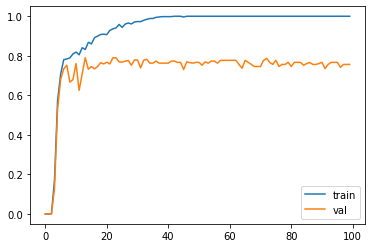

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.487179).  Saving model ...
Validation acc increased (0.487179 --> 0.610526).  Saving model ...
Validation acc increased (0.610526 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.722222 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730435 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.741379 --> 0.743363).  Saving model ...
Validation acc increased (0.743363 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.765217 --> 0.800000).  Saving model ...


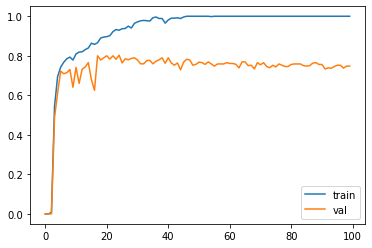

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.602410).  Saving model ...
Validation acc increased (0.602410 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.720721).  Saving model ...
Validation acc increased (0.720721 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.769231 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 

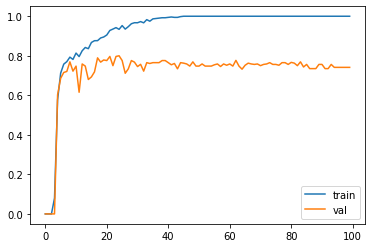

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.637363).  Saving model ...
Validation acc increased (0.637363 --> 0.704762).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.704762 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.725664 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

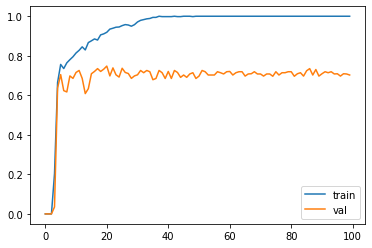

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.342857).  Saving model ...
Validation acc increased (0.342857 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.646465).  Saving model ...
Validation acc increased (0.646465 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.715596 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.765217 --> 0.780488).  Saving model ...
EarlyStopping counter: 1 out

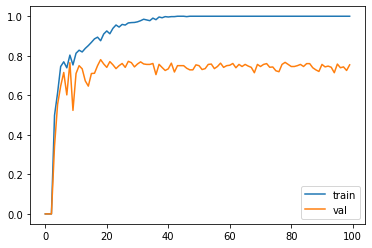

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.620690).  Saving model ...
Validation acc increased (0.620690 --> 0.645161).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.645161 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.701754 --> 0.735043).  Saving model ...
Validation acc increased (0.735043 --> 0.745763).  Saving m

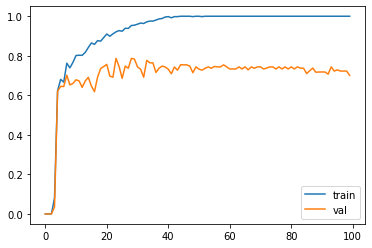

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.571429).  Saving model ...
Validation acc increased (0.571429 --> 0.653061).  Saving model ...
Validation acc increased (0.653061 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.679612).  Saving model ...
Validation acc increased (0.679612 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.703704 --> 0.739496).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.739496 --> 0.740741).  Saving model ...
Validation acc increased (0.7407

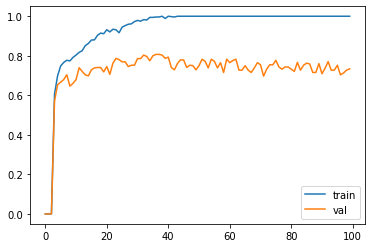

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.595238).  Saving model ...
Validation acc increased (0.595238 --> 0.633663).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.633663 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.741379 --> 0.752137).  Saving model ...
Validation acc increas

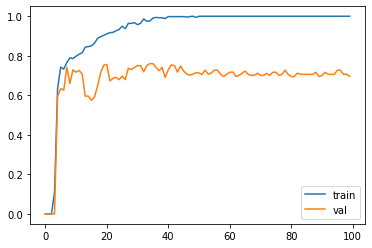

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.432432).  Saving model ...
Validation acc increased (0.432432 --> 0.712871).  Saving model ...
Validation acc increased (0.712871 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.740741 --> 0.758065).  Saving model ...
Validation acc increased (0.758065 --> 0.758621).  Saving model ...
Validation acc increased (0.758621 --> 0.783333).  Saving model 

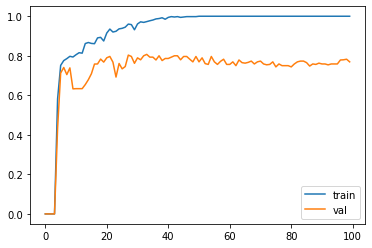

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.688889).  Saving model ...
Validation acc increased (0.688889 --> 0.723810).  Saving model ...
Validation acc increased (0.723810 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
Validation acc increased (0.761062 --> 0.770492).  S

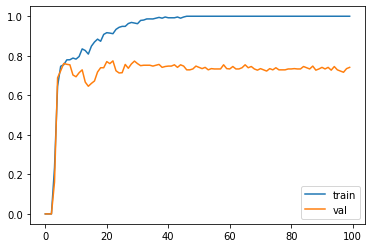

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.567901).  Saving model ...
Validation acc increased (0.567901 --> 0.699029).  Saving model ...
Validation acc increased (0.699029 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.745455 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7

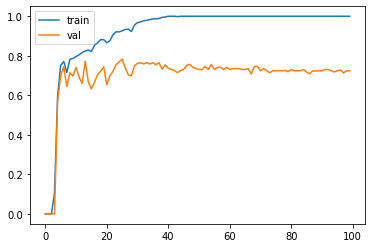

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.405405).  Saving model ...
Validation acc increased (0.405405 --> 0.686869).  Saving model ...
Validation acc increased (0.686869 --> 0.704762).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.704762 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increas

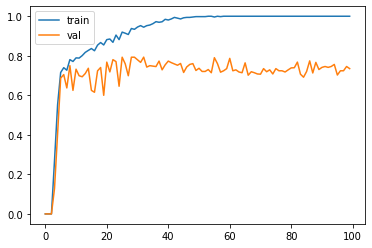

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.523810).  Saving model ...
Validation acc increased (0.523810 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.699029).  Saving model ...
Validation acc increased (0.699029 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.703704 --> 0.709091).  Saving model ...
Validation acc increased (0.709091 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200


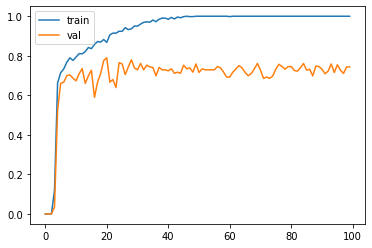

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.480000).  Saving model ...
Validation acc increased (0.480000 --> 0.680000).  Saving model ...
Validation acc increased (0.680000 --> 0.680412).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.680412 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter:

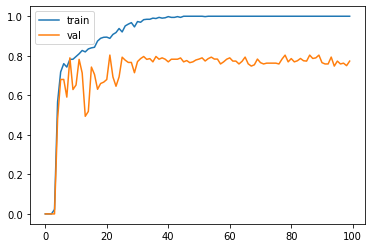

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.163934).  Saving model ...
Validation acc increased (0.163934 --> 0.493506).  Saving model ...
Validation acc increased (0.493506 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping counter: 15 out of 200
EarlyStopping counter: 16 out of 200
EarlyStop

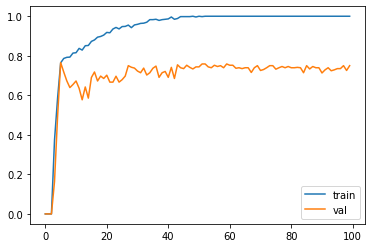

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.242424).  Saving model ...
Validation acc increased (0.242424 --> 0.617021).  Saving model ...
Validation acc increased (0.617021 --> 0.719298).  Saving model ...
Validation acc increased (0.719298 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.725664 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.769231 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out

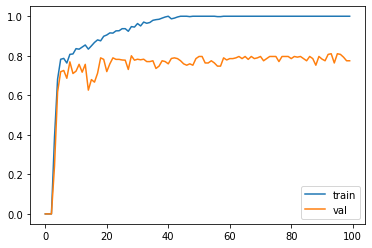

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.432432).  Saving model ...
Validation acc increased (0.432432 --> 0.646465).  Saving model ...
Validation acc increased (0.646465 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.732143).  Saving model ...
Validation acc increased (0.732143 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.738739 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 

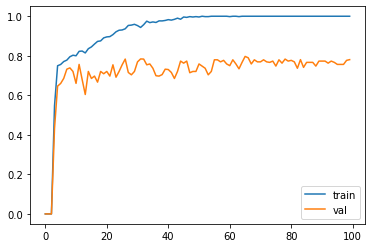

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.568182).  Saving model ...
Validation acc increased (0.568182 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter

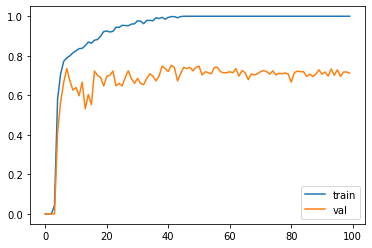

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.608696).  Saving model ...
Validation acc increased (0.608696 --> 0.717949).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.717949 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7

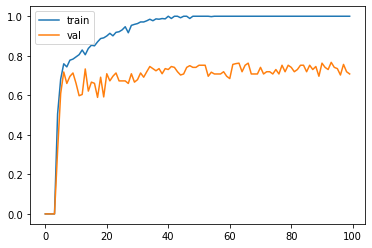

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.518519).  Saving model ...
Validation acc increased (0.518519 --> 0.652174).  Saving model ...
Validation acc increased (0.652174 --> 0.700855).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.700855 --> 0.716667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter:

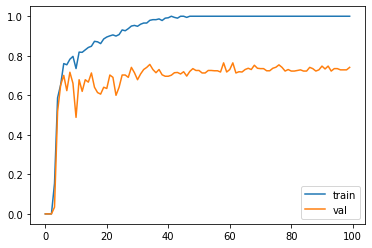

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.613636).  Saving model ...
Validation acc increased (0.613636 --> 0.629213).  Saving model ...
Validation acc increased (0.629213 --> 0.691589).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.691589 --> 0.706897).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.706897 --> 0.728814).  Saving model ...
EarlyStopping counter: 1 out

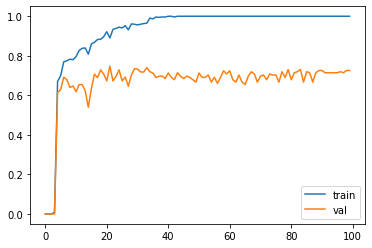

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.577778).  Saving model ...
Validation acc increased (0.577778 --> 0.583333).  Saving model ...
Validation acc increased (0.583333 --> 0.593407).  Saving model ...
Validation acc increased (0.593407 --> 0.679612).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.679612 --> 0.700855).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.7008

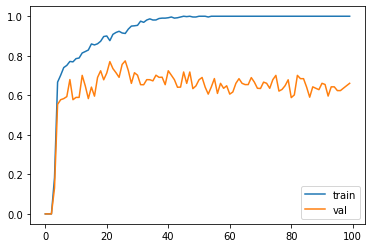

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.376812).  Saving model ...
Validation acc increased (0.376812 --> 0.652632).  Saving model ...
Validation acc increased (0.652632 --> 0.659574).  Saving model ...
Validation acc increased (0.659574 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 ou

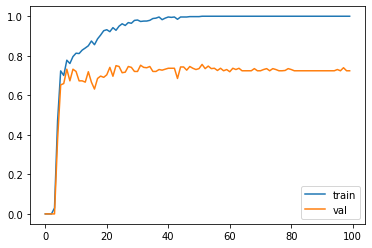

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.660377).  Saving model ...
Validation acc increased (0.660377 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.713043 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.724138 --> 0.735043).  Saving model ...
Validation acc increased (0.735043 --> 0.739496).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.739496 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


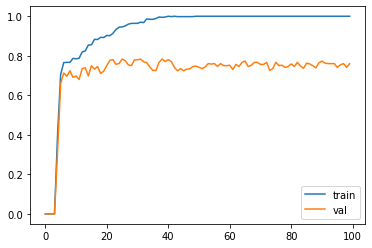

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.512821).  Saving model ...
Validation acc increased (0.512821 --> 0.673267).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.673267 --> 0.685714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.685714 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.7387

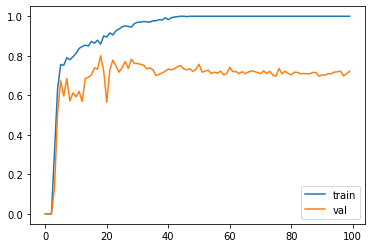

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.622222).  Saving model ...
Validation acc increased (0.622222 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.701754 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4

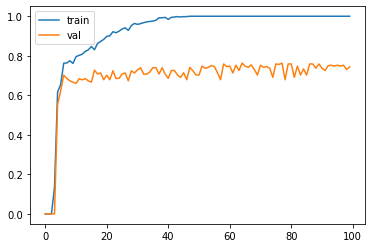

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.625000).  Saving model ...
Validation acc increased (0.625000 --> 0.625000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.625000 --> 0.704762).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.704762 --> 0.711538).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 

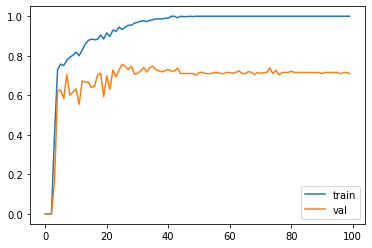

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.298507).  Saving model ...
Validation acc increased (0.298507 --> 0.602410).  Saving model ...
Validation acc increased (0.602410 --> 0.666667).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.666667 --> 0.673267).  Saving model ...
Validation acc increased (0.673267 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.743363 --> 0.743802).  Saving model ...
EarlyStopping counter: 1 out of 

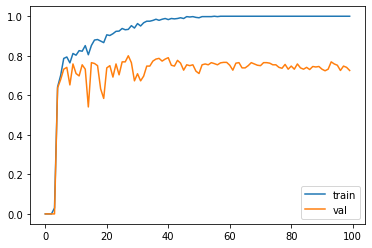

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.538462).  Saving model ...
Validation acc increased (0.538462 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.733945 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.738739 --> 0.793103).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

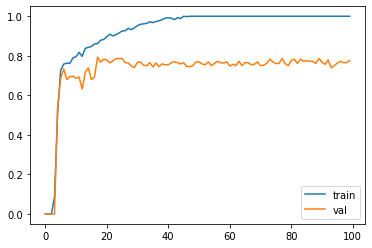

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.447368).  Saving model ...
Validation acc increased (0.447368 --> 0.530120).  Saving model ...
Validation acc increased (0.530120 --> 0.706897).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.706897 --> 0.706897).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.706897 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out

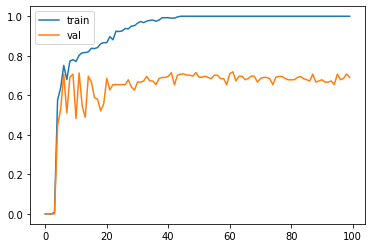

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.720000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.720000 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.770642 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.777778 --> 0.793103).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3

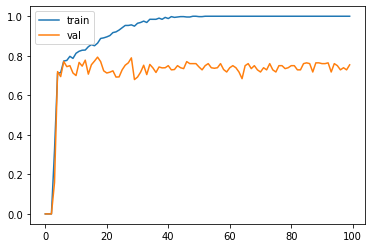

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.707071).  Saving model ...
Validation acc increased (0.707071 --> 0.761905).  Saving model ...
Validation acc increased (0.761905 --> 0.761905).  Saving model ...
Validation acc increased (0.761905 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.788991 --> 0.789474).  Saving model ...
Validation acc increased (0.789474 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 

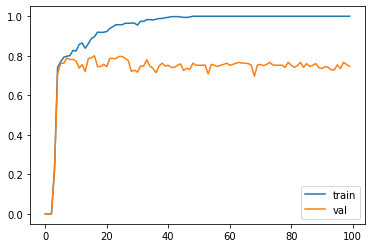

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.493827).  Saving model ...
Validation acc increased (0.493827 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.703704 --> 0.722689).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
Validation acc i

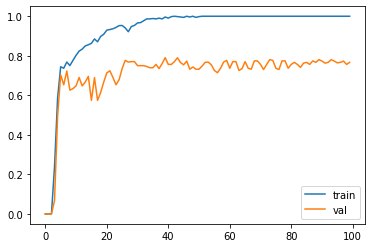

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.627907).  Saving model ...
Validation acc increased (0.627907 --> 0.730769).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730769 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.758621 --> 0.764228).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out

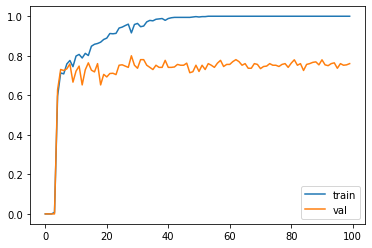

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.190476).  Saving model ...
Validation acc increased (0.190476 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.673469).  Saving model ...
Validation acc increased (0.673469 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.690909 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.745763).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.745763 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 

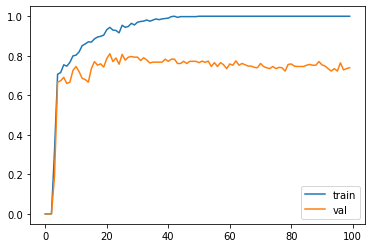

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.590909).  Saving model ...
Validation acc increased (0.590909 --> 0.720721).  Saving model ...
Validation acc increased (0.720721 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.727273 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 

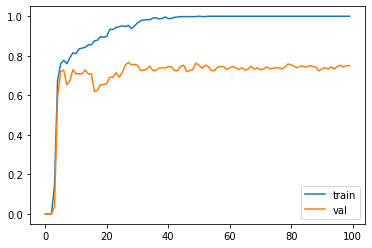

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.719298 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.

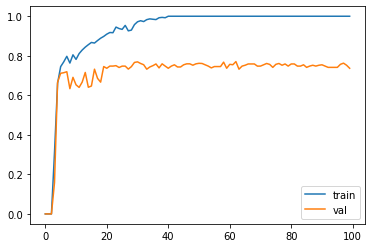

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.486486).  Saving model ...
Validation acc increased (0.486486 --> 0.636364).  Saving model ...
Validation acc increased (0.636364 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping c

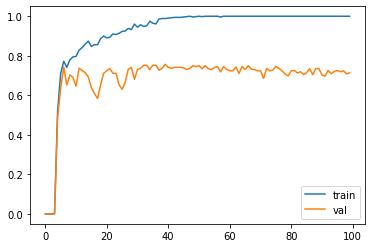

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.623656).  Saving model ...
Validation acc increased (0.623656 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
Validation acc increased (0.702703 --> 0.707965).  S

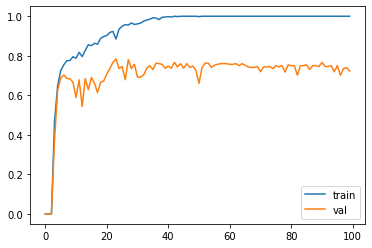

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.268657).  Saving model ...
Validation acc increased (0.268657 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.693878).  Saving model ...
Validation acc increased (0.693878 --> 0.693878).  Saving model ...
Validation acc increased (0.693878 --> 0.699029).  Saving model ...
Validation acc increased (0.699029 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 o

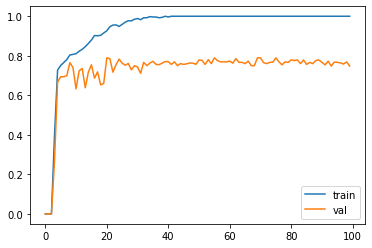

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.272727).  Saving model ...
Validation acc increased (0.272727 --> 0.613636).  Saving model ...
Validation acc increased (0.613636 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.759259).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.759259 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8

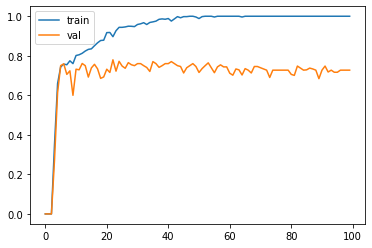

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.714286 --> 0.775862).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.775862 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.777778 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.800000 --> 0.807018).  Saving model ...
EarlyStopping counter: 1 out

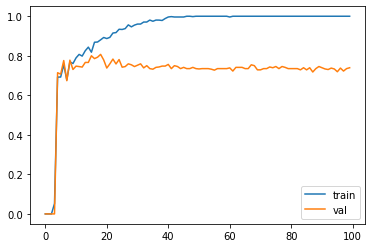

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.606742).  Saving model ...
Validation acc increased (0.606742 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.735849 --> 0.776860).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7

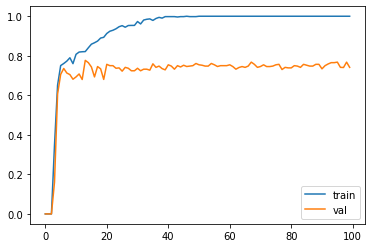

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.659341).  Saving model ...
Validation acc increased (0.659341 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.774775 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 ou

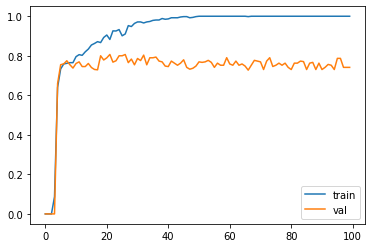

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.752688).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.752688 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.773109 --> 0.773585).  

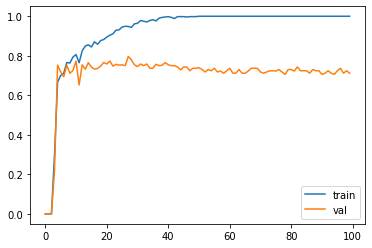

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.473684).  Saving model ...
Validation acc increased (0.473684 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.646465).  Saving model ...
Validation acc increased (0.646465 --> 0.704762).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.704762 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.750000 --> 0.760331).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

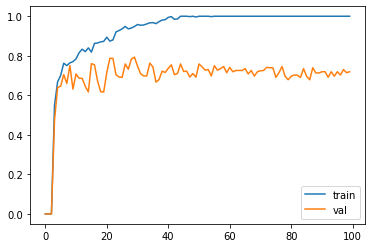

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.660194).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.660194 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.736842 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.758621 --> 0.766667).  Saving model ...
EarlyStopping counter: 1 out

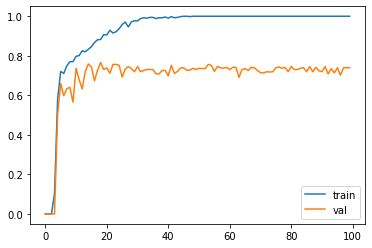

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.638298).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.638298 --> 0.660194).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.660194 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.730435 --> 0.730435).  Saving model ...
EarlyStopping counter: 

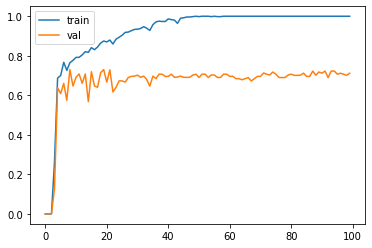

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.699029).  Saving model ...
Validation acc increased (0.699029 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.747826 --> 0.764228).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out

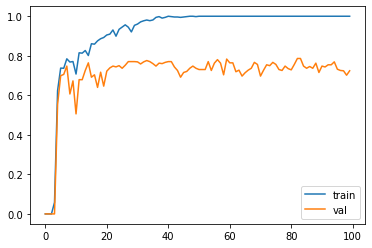

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.595238).  Saving model ...
Validation acc increased (0.595238 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.710280 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.741379 --> 0.760331).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.760331 --> 0.776860).  Saving model 

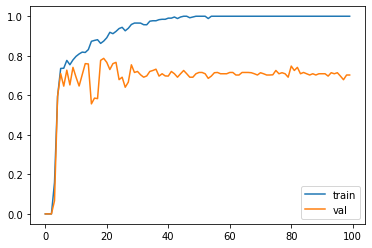

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.487179).  Saving model ...
Validation acc increased (0.487179 --> 0.586957).  Saving model ...
Validation acc increased (0.586957 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.714286 --> 0.752000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.752000 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.758621 --> 0.762712).  Saving model ...
Validation acc increased (0.

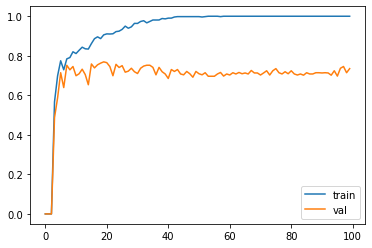

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.659574).  Saving model ...
Validation acc increased (0.659574 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc increased (0.727273 --> 0.727273).  Saving model ...
Validation acc increa

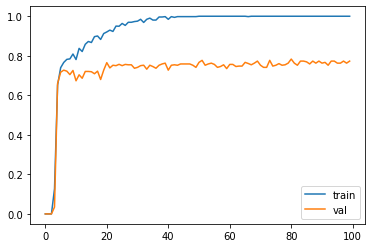

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.190476).  Saving model ...
Validation acc increased (0.190476 --> 0.613636).  Saving model ...
Validation acc increased (0.613636 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.727273 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.741379 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747826 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.761062 --> 0.763636).  Saving model 

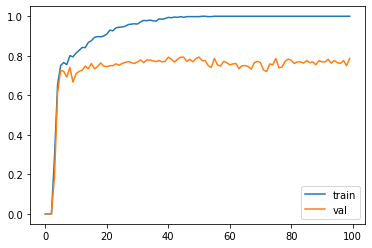

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.298507).  Saving model ...
Validation acc increased (0.298507 --> 0.588235).  Saving model ...
Validation acc increased (0.588235 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping c

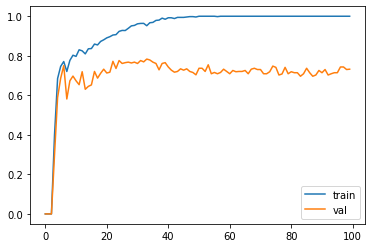

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.475000).  Saving model ...
Validation acc increased (0.475000 --> 0.672897).  Saving model ...
Validation acc increased (0.672897 --> 0.672897).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.672897 --> 0.730159).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.730159 --> 0.752000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

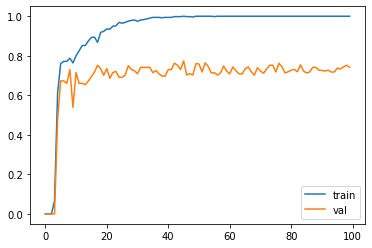

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.678899).  Saving model ...
Validation acc increased (0.678899 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.724138 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.735043 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.735043 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out

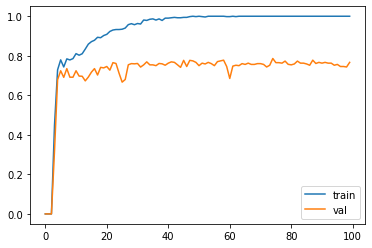

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.163934).  Saving model ...
Validation acc increased (0.163934 --> 0.651163).  Saving model ...
Validation acc increased (0.651163 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.759259).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.759259 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7

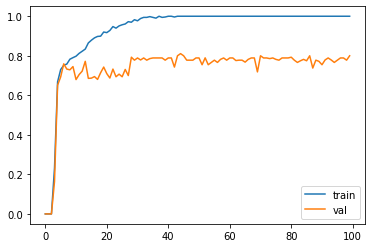

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.597701).  Saving model ...
Validation acc increased (0.597701 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.725664 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730435 --> 0.752137).  Saving model ...
Validation acc increased (0.752137 --> 0.758621).  Saving model ...
Validation acc increased (0.758621 --> 0.770492).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Earl

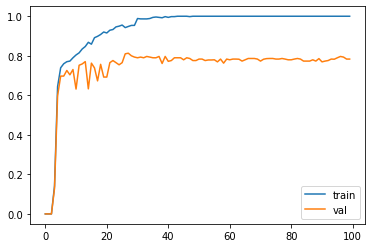

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.652174).  Saving model ...
Validation acc increased (0.652174 --> 0.672897).  Saving model ...
Validation acc increased (0.672897 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.702703).  Saving model ...
Validation acc increased (0.702703 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.725664 --> 0.730435).  Saving model ...
Validation acc increased (0.730435 --> 0.736842).  Saving model ...


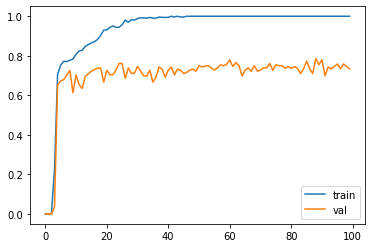

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.559140).  Saving model ...
Validation acc increased (0.559140 --> 0.647059).  Saving model ...
Validation acc increased (0.647059 --> 0.647059).  Saving model ...
Validation acc increased (0.647059 --> 0.648148).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.648148 --> 0.678261).  Saving model ...
Validation acc increased (0.678261 --> 0.684685).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.684685 --> 0.696429).  Saving model ...
Validation acc increased (0.696429 -

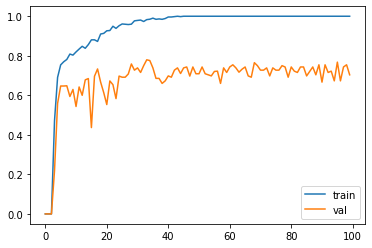

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.459459).  Saving model ...
Validation acc increased (0.459459 --> 0.615385).  Saving model ...
Validation acc increased (0.615385 --> 0.647619).  Saving model ...
Validation acc increased (0.647619 --> 0.666667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.666667 --> 0.717949).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.717949 --> 0.745763).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745763 --> 0.758621).  Saving model ...


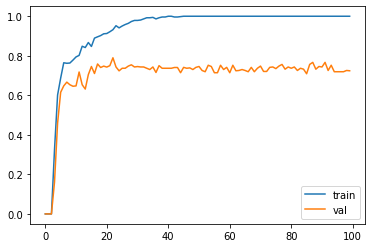

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.098361).  Saving model ...
Validation acc increased (0.098361 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.672897).  Saving model ...
Validation acc increased (0.672897 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733333 --> 0.745763).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter:

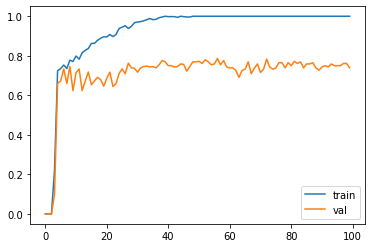

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.394366).  Saving model ...
Validation acc increased (0.394366 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.724138 --> 0.724138).  Saving model ...
Validation acc increased (0.724138 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730435 --> 0.755906).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.755906 --> 0.758621).  Saving model ...
Validation acc increased (0.7586

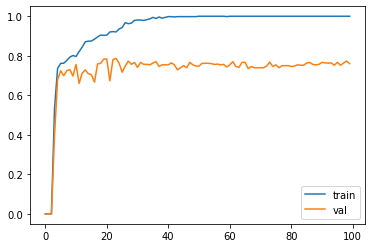

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.709091 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStoppin

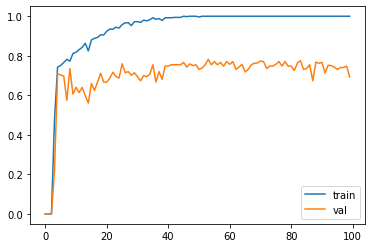

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.190476).  Saving model ...
Validation acc increased (0.190476 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747826 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.750000 --> 0.770492).  Saving model ...
Validation acc increased (0.770492 --> 0.776860).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.776860 --> 0.783333).  Saving model ...
EarlyStopping counter: 1 out of 200


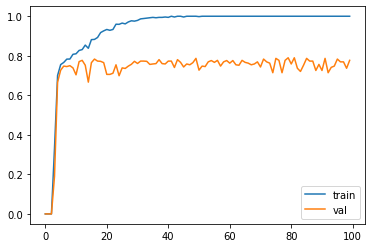

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.720721 --> 0.720721).  Saving model ...
Validation acc increased (0.720721 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.756303 --> 0.780488).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.780488 --> 0.796610).  Saving model ...
Earl

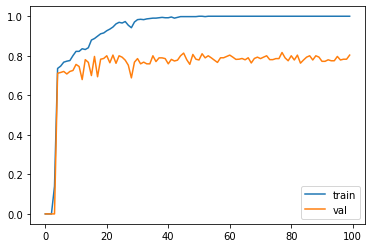

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.525000).  Saving model ...
Validation acc increased (0.525000 --> 0.584270).  Saving model ...
Validation acc increased (0.584270 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.710280 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out

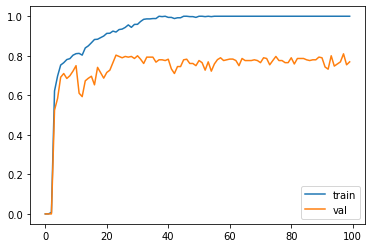

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.190476).  Saving model ...
Validation acc increased (0.190476 --> 0.512195).  Saving model ...
Validation acc increased (0.512195 --> 0.633663).  Saving model ...
Validation acc increased (0.633663 --> 0.666667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.666667 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.735043).  Saving model ...
Validation acc increased (0.735043 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


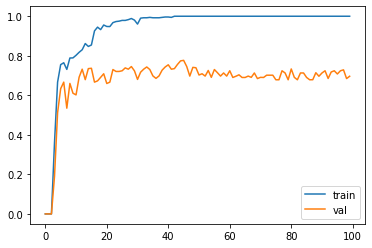

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.303030).  Saving model ...
Validation acc increased (0.303030 --> 0.636364).  Saving model ...
Validation acc increased (0.636364 --> 0.745455).  Saving model ...
Validation acc increased (0.745455 --> 0.758621).  Saving model ...
Validation acc increased (0.758621 --> 0.761062).  Saving model ...
Validation acc increased (0.761062 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.765217 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 

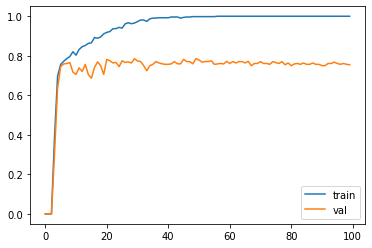

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.298507).  Saving model ...
Validation acc increased (0.298507 --> 0.577320).  Saving model ...
Validation acc increased (0.577320 --> 0.642202).  Saving model ...
Validation acc increased (0.642202 --> 0.648649).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.648649 --> 0.672566).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.672566 --> 0.743802).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

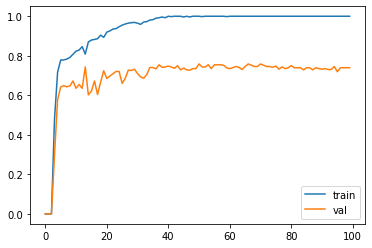

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.480000).  Saving model ...
Validation acc increased (0.480000 --> 0.610526).  Saving model ...
Validation acc increased (0.610526 --> 0.684685).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.684685 --> 0.684685).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.684685 --> 0.696429).  Saving model ...
Validation acc increased (0.696429 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

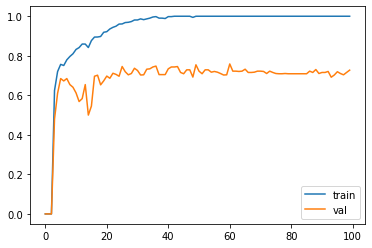

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.342857).  Saving model ...
Validation acc increased (0.342857 --> 0.692308).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.692308 --> 0.695652).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.695652 --> 0.783333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping count

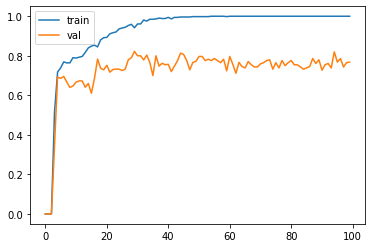

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.352941).  Saving model ...
Validation acc increased (0.352941 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.713043 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.725664 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730435 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

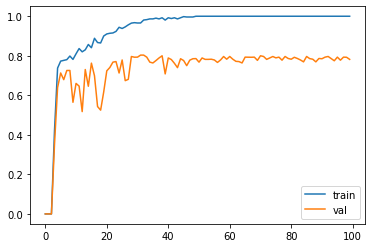

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.394366).  Saving model ...
Validation acc increased (0.394366 --> 0.571429).  Saving model ...
Validation acc increased (0.571429 --> 0.626263).  Saving model ...
Validation acc increased (0.626263 --> 0.673077).  Saving model ...
Validation acc increased (0.673077 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 

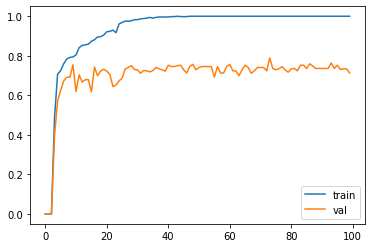

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.215385).  Saving model ...
Validation acc increased (0.215385 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.686869).  Saving model ...
Validation acc increased (0.686869 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.727273 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.741379 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 

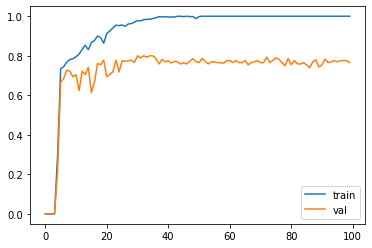

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.602410).  Saving model ...
Validation acc increased (0.602410 --> 0.686275).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.686275 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.752137 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5

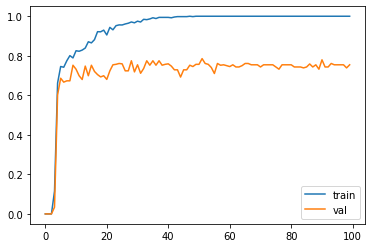

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.666667).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.666667 --> 0.679612).  Saving model ...
Validation acc increased (0.679612 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.703704 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.707965 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.724138 --> 0.736842).  Saving model ...


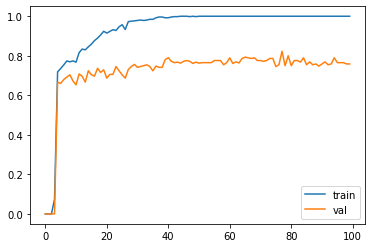

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.394366).  Saving model ...
Validation acc increased (0.394366 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.719298 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping count

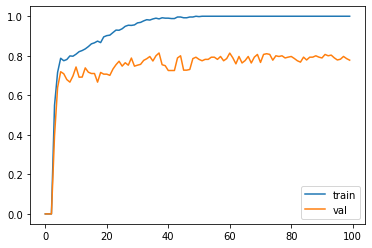

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.376812).  Saving model ...
Validation acc increased (0.376812 --> 0.700000).  Saving model ...
Validation acc increased (0.700000 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.743363 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.747826 --> 0.766355).  Saving model ...
Validation acc increased (0.766355 --> 0.780952).  Saving model ...
Validation acc increased (0.

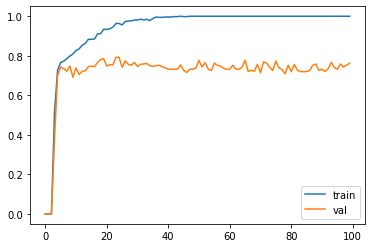

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.328358).  Saving model ...
Validation acc increased (0.328358 --> 0.606742).  Saving model ...
Validation acc increased (0.606742 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
Validation acc increased (0.724138 --> 0.750000).  S

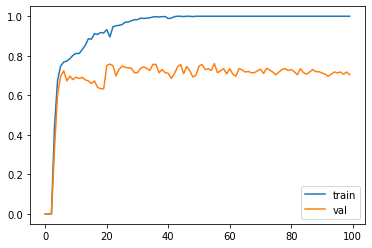

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.604167).  Saving model ...
Validation acc increased (0.604167 --> 0.660194).  Saving model ...
Validation acc increased (0.660194 --> 0.722689).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
Validation acc increased (0.722689 --> 0.733333).  S

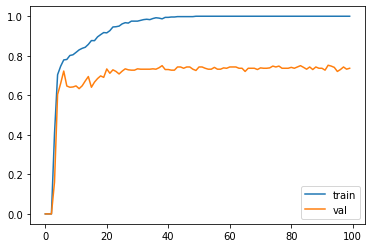

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.376812).  Saving model ...
Validation acc increased (0.376812 --> 0.752294).  Saving model ...
Validation acc increased (0.752294 --> 0.771930).  Saving model ...
Validation acc increased (0.771930 --> 0.793103).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.793103 --> 0.825397).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 

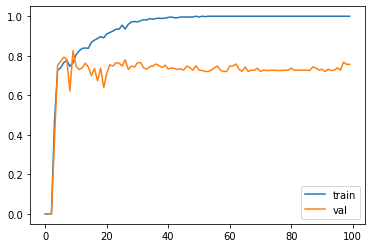

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.604651).  Saving model ...
Validation acc increased (0.604651 --> 0.680000).  Saving model ...
Validation acc increased (0.680000 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.747664 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.754386 --> 0.796610).  Saving model ...
Validation acc increased (0.

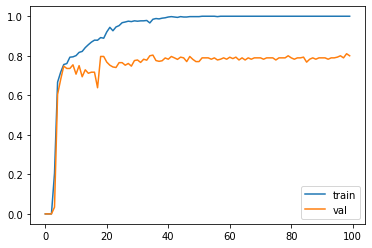

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.518519).  Saving model ...
Validation acc increased (0.518519 --> 0.561798).  Saving model ...
Validation acc increased (0.561798 --> 0.696429).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.696429 --> 0.728814).  Saving model ...
Validation acc increased (0.728814 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increas

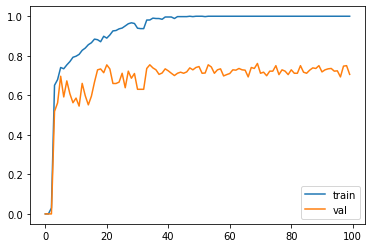

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.653061).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.653061 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.685185).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.685185 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.690909 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.704762).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 

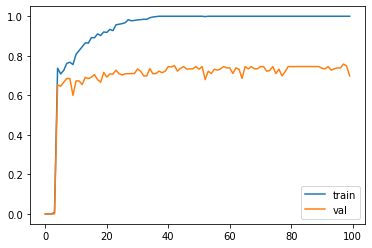

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.459459).  Saving model ...
Validation acc increased (0.459459 --> 0.623656).  Saving model ...
Validation acc increased (0.623656 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.738739 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 

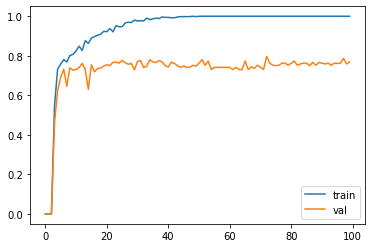

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.652632).  Saving model ...
Validation acc increased (0.652632 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.725664 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.743363 --> 0.743363).  Saving model ...
Validation acc increased (0.743363 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 

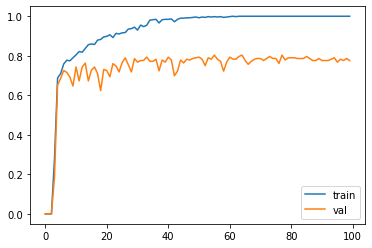

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.558140).  Saving model ...
Validation acc increased (0.558140 --> 0.627451).  Saving model ...
Validation acc increased (0.627451 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.701754 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.701754 --> 0.747967).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

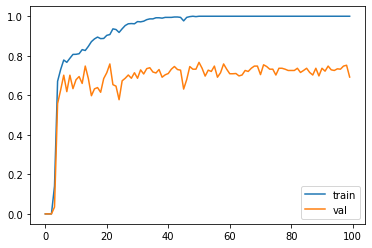

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.652632).  Saving model ...
Validation acc increased (0.652632 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.760331).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.760331 --> 0.796748).  Saving model ...
EarlyStopping counter: 1 ou

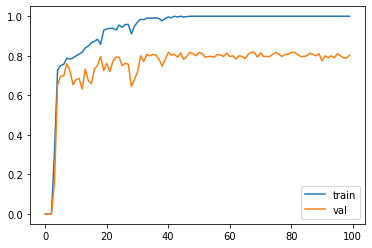

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.222222).  Saving model ...
Validation acc increased (0.222222 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.723810 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.740741 --> 0.785714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.785714 --> 0.789474).  Saving model ...
EarlyStopping counter: 

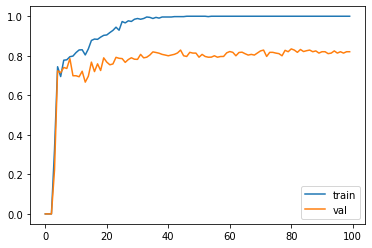

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.745763).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.745763 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.756303 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out

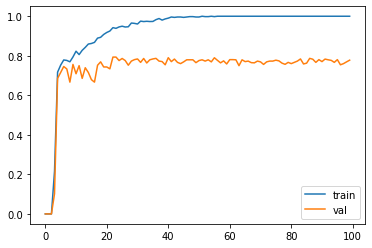

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.453333).  Saving model ...
Validation acc increased (0.453333 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.722222 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counte

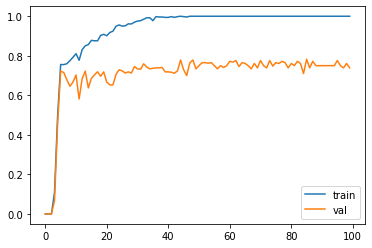

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.190476).  Saving model ...
Validation acc increased (0.190476 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.704762).  Saving model ...
Validation acc increased (0.704762 --> 0.705882).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc increa

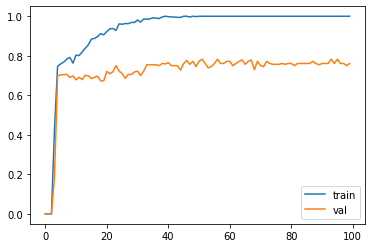

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.506329).  Saving model ...
Validation acc increased (0.506329 --> 0.673267).  Saving model ...
Validation acc increased (0.673267 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.707965 --> 0.711538).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.711538 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200


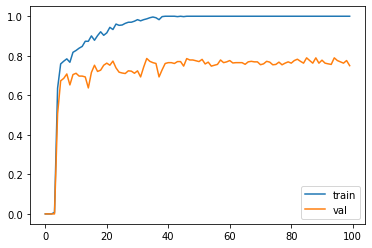

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.699029).  Saving model ...
Validation acc increased (0.699029 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.736842 --> 0.779661).  Saving model 

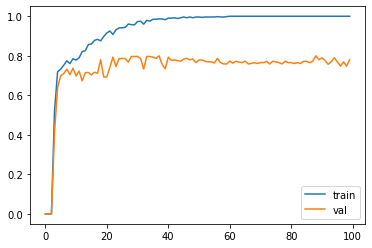

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.673077).  Saving model ...
Validation acc increased (0.673077 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.703704 --> 0.707071).  Saving model ...
Validation acc increased (0.707071 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.707965 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 

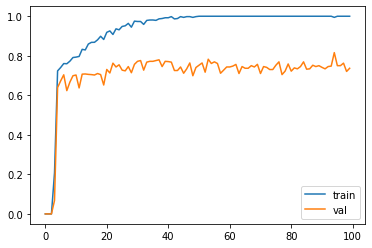

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.388889).  Saving model ...
Validation acc increased (0.388889 --> 0.627451).  Saving model ...
Validation acc increased (0.627451 --> 0.678899).  Saving model ...
Validation acc increased (0.678899 --> 0.684685).  Saving model ...
Validation acc increased (0.684685 --> 0.696429).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.696429 --> 0.707965).  Saving model ...
Validation acc increased (0.707965 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.719298 --> 0.733333).  Saving model ...


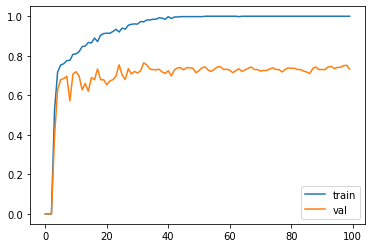

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.672727).  Saving model ...
Validation acc increased (0.672727 --> 0.672727).  Saving model ...
Validation acc increased (0.672727 --> 0.707965).  Saving model ...
Validation acc increased (0.707965 --> 0.741935).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.741935 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.747826 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 

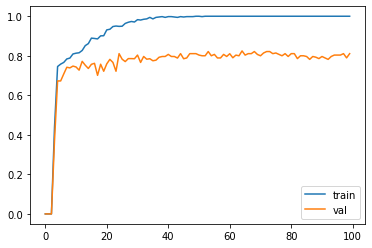

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.612245).  Saving model ...
Validation acc increased (0.612245 --> 0.633663).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.633663 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.701754 --> 0.724138).  Saving model ...
Validation acc increased (0.724138 --> 0.745763).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

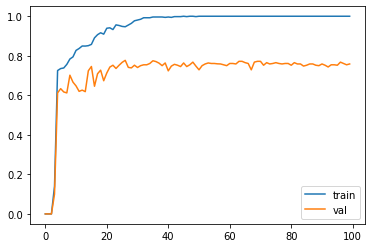

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.242424).  Saving model ...
Validation acc increased (0.242424 --> 0.604651).  Saving model ...
Validation acc increased (0.604651 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.715596 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.735043 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.756303 --> 0.760331).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.760331 --> 0.786885).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

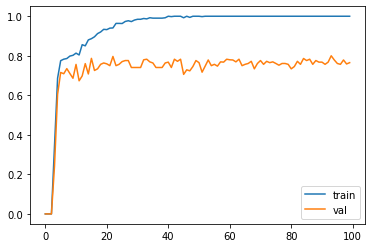

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.536585).  Saving model ...
Validation acc increased (0.536585 --> 0.673267).  Saving model ...
Validation acc increased (0.673267 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.690909 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.747826 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

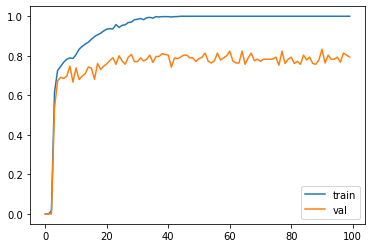

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.680412).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.680412 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.752137 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.756757 --> 0.756757).  Saving mo

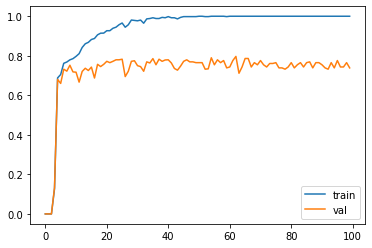

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.376812).  Saving model ...
Validation acc increased (0.376812 --> 0.645833).  Saving model ...
Validation acc increased (0.645833 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.720721 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.733945 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.756757).  Saving model ...


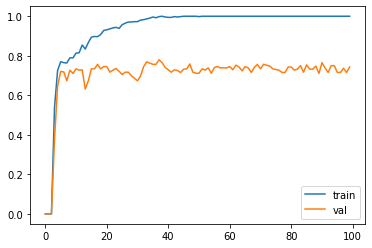

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.487179).  Saving model ...
Validation acc increased (0.487179 --> 0.600000).  Saving model ...
Validation acc increased (0.600000 --> 0.653846).  Saving model ...
Validation acc increased (0.653846 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.725664 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.743363 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.745455 --> 0.754717).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.754717 --> 0.792793).  Saving model ...


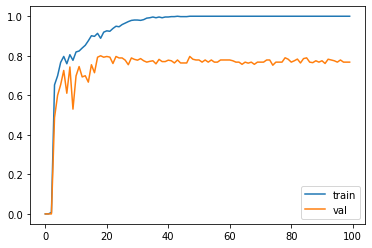

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.272727).  Saving model ...
Validation acc increased (0.272727 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.653846).  Saving model ...
Validation acc increased (0.653846 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.678261).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.678261 --> 0.690265).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.690265 --> 0.747826).  Saving model 

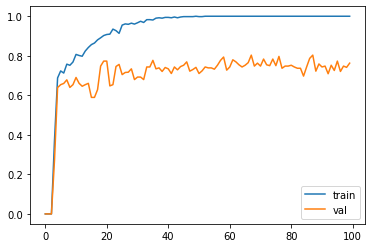

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.581395).  Saving model ...
Validation acc increased (0.581395 --> 0.660194).  Saving model ...
Validation acc increased (0.660194 --> 0.672897).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.672897 --> 0.672897).  Saving model ...
Validation acc increased (0.672897 --> 0.728814).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9

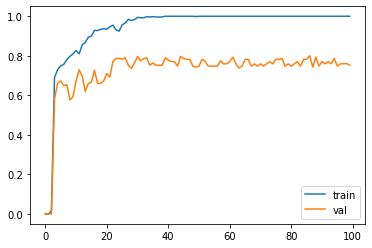

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.659574).  Saving model ...
Validation acc increased (0.659574 --> 0.673077).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.673077 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc increased (0.736842 --> 0.736842).  Sa

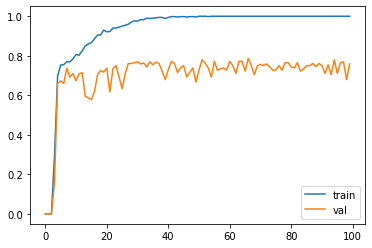

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.558140).  Saving model ...
Validation acc increased (0.558140 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.725664 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.737705).  Saving m

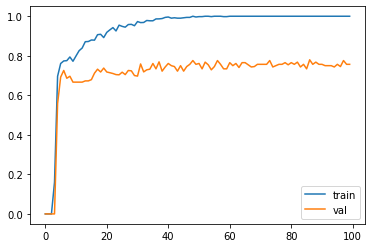

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.606742).  Saving model ...
Validation acc increased (0.606742 --> 0.673469).  Saving model ...
Validation acc increased (0.673469 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.714286 --> 0.728814).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.728814 --> 0.750000).  Saving model ...
Validation acc increase

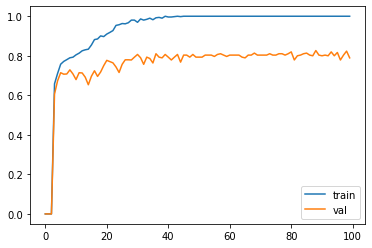

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.068966).  Saving model ...
Validation acc increased (0.068966 --> 0.622222).  Saving model ...
Validation acc increased (0.622222 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.715596 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.724138 --> 0.760331).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.760331 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

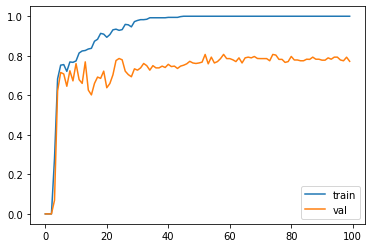

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.453333).  Saving model ...
Validation acc increased (0.453333 --> 0.595238).  Saving model ...
Validation acc increased (0.595238 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.720721 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.762712 --> 0.796117).  Saving model ...
Validation acc increased (0.796117 --> 0.803738).  Saving model 

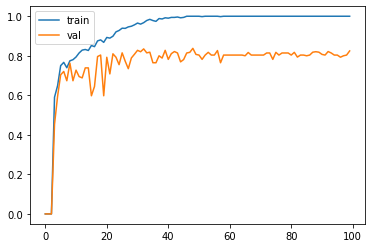

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.673077).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.673077 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.727273 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.

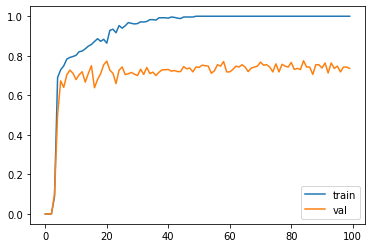

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.068966).  Saving model ...
Validation acc increased (0.068966 --> 0.560976).  Saving model ...
Validation acc increased (0.560976 --> 0.680000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.680000 --> 0.782609).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping cou

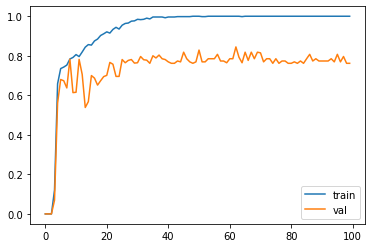

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.550000).  Saving model ...
Validation acc increased (0.550000 --> 0.625000).  Saving model ...
Validation acc increased (0.625000 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.741379 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping coun

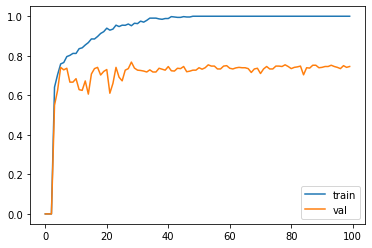

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.506329).  Saving model ...
Validation acc increased (0.506329 --> 0.626263).  Saving model ...
Validation acc increased (0.626263 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.701754 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.735043 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.756757 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.778761).  Saving model 

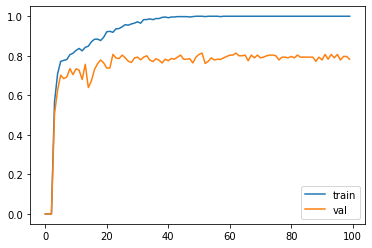

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.558140).  Saving model ...
Validation acc increased (0.558140 --> 0.641509).  Saving model ...
Validation acc increased (0.641509 --> 0.678899).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.678899 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.720721 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.735849 --> 0.738739).  Saving model 

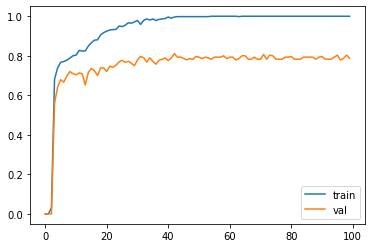

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.597938).  Saving model ...
Validation acc increased (0.597938 --> 0.618557).  Saving model ...
Validation acc increased (0.618557 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.697248 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.743802).  Saving model ...
EarlyStopping counter: 1 out of 

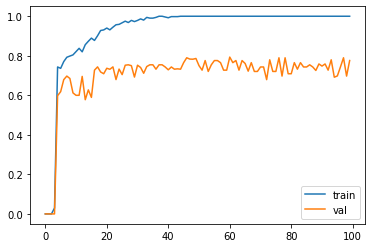

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.680000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.680000 --> 0.715447).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.715447 --> 0.722689).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counte

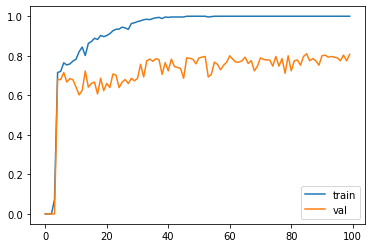

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.637363).  Saving model ...
Validation acc increased (0.637363 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.702703).  Saving model ...
Validation acc increased (0.702703 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.703704 --> 0.706897).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

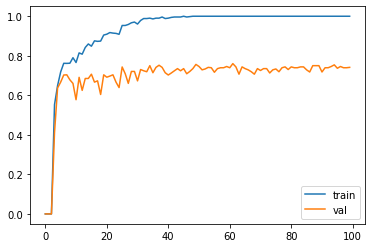

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.679612).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.679612 --> 0.685185).  Saving model ...
Validation acc increased (0.685185 --> 0.698113).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.698113 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4

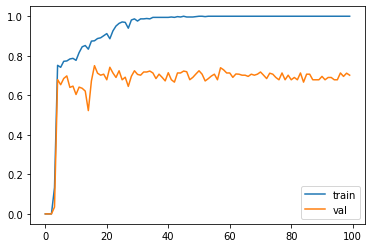

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.604167).  Saving model ...
Validation acc increased (0.604167 --> 0.622642).  Saving model ...
Validation acc increased (0.622642 --> 0.672897).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.672897 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.697248 --> 0.707965).  Saving model ...
Validation acc increased (0.707965 --> 0.707965).  Saving model 

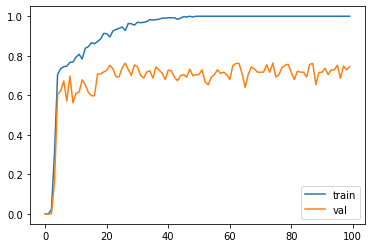

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.486486).  Saving model ...
Validation acc increased (0.486486 --> 0.712871).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.712871 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.756757).  Saving model ...
Validation acc increased (0.756757 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out

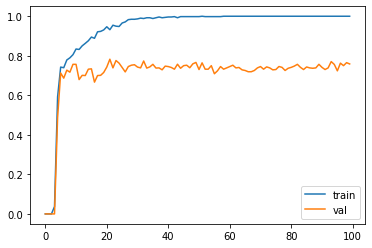

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.690909).  Saving model ...
Validation acc increased (0.690909 --> 0.721311).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.721311 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.735043 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.

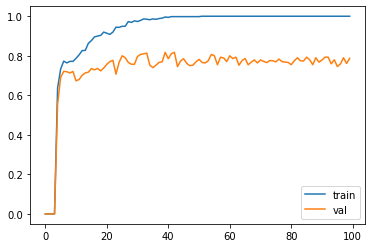

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.571429).  Saving model ...
Validation acc increased (0.571429 --> 0.666667).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.666667 --> 0.672897).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.672897 --> 0.679245).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.679245 --> 0.720721).  Saving model ...
Validation acc increased (0.720721 --> 0.720721).  Saving model ...
Validation acc increased (0.7207

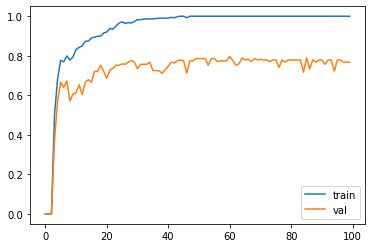

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.640777).  Saving model ...
Validation acc increased (0.640777 --> 0.660194).  Saving model ...
Validation acc increased (0.660194 --> 0.678261).  Saving model ...
Validation acc increased (0.678261 --> 0.679245).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.679245 --> 0.683761).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.683761 --> 0.690265).  Saving model ...
Validation acc increased (0.690265 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200


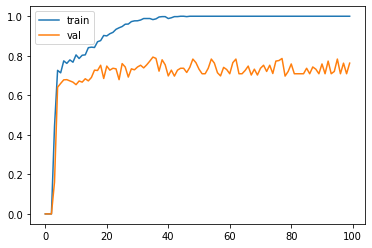

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.480000).  Saving model ...
Validation acc increased (0.480000 --> 0.612245).  Saving model ...
Validation acc increased (0.612245 --> 0.691589).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.691589 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping co

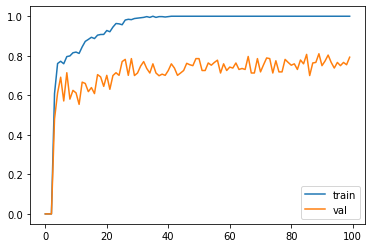

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.615385).  Saving model ...
Validation acc increased (0.615385 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.723810 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.732143 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

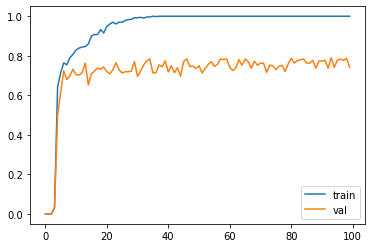

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.638298).  Saving model ...
Validation acc increased (0.638298 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.735043 --> 0.766667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.766667 --> 0.782609).  Saving model ...
Validation acc increased (0.782609 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 

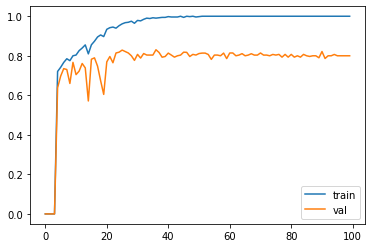

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.590909).  Saving model ...
Validation acc increased (0.590909 --> 0.653846).  Saving model ...
Validation acc increased (0.653846 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.713043 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.743363 --> 0.803571).  Saving model ...


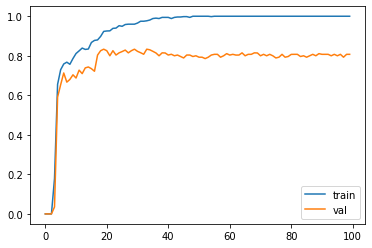

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.589474).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.589474 --> 0.647619).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.647619 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.690909 --> 0.694915).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9

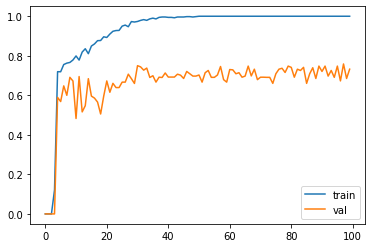

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.741379 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.771930 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out

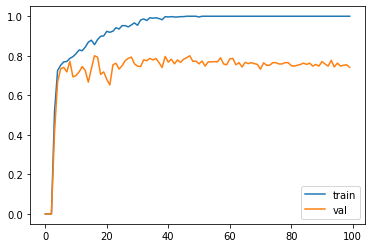

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.272727).  Saving model ...
Validation acc increased (0.272727 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.761905).  Saving model ...
Validation acc increased (0.761905 --> 0.810811).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter

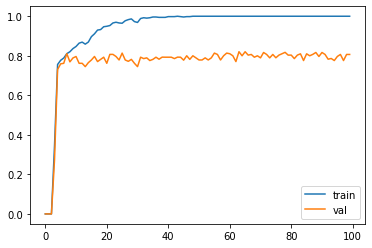

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.342857).  Saving model ...
Validation acc increased (0.342857 --> 0.610526).  Saving model ...
Validation acc increased (0.610526 --> 0.678571).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.678571 --> 0.737705).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.737705 --> 0.747826).  Saving model ...
EarlyStopping counter:

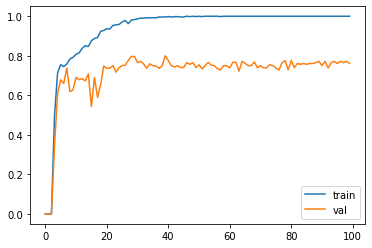

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.643678).  Saving model ...
Validation acc increased (0.643678 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.742857 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.761062 --> 0.785714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out

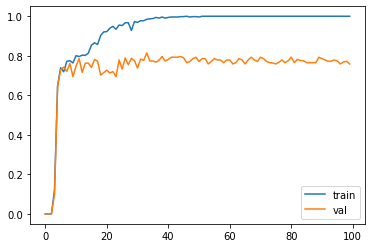

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.453333).  Saving model ...
Validation acc increased (0.453333 --> 0.632653).  Saving model ...
Validation acc increased (0.632653 --> 0.685714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.685714 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.736842 --> 0.737864).  Saving model ...
Validation acc increased (0.

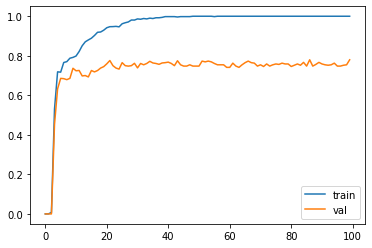

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.640777).  Saving model ...
Validation acc increased (0.640777 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.690909 --> 0.706897).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.706897 --> 0.712871).  Savi

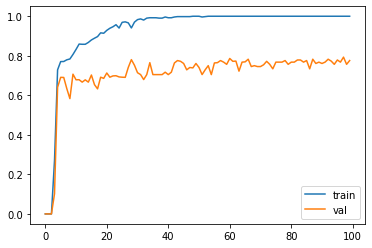

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.487179).  Saving model ...
Validation acc increased (0.487179 --> 0.718447).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.718447 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.738739 --> 0.738739).  S

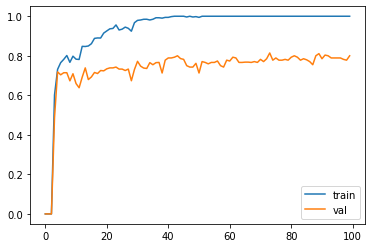

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.602410).  Saving model ...
Validation acc increased (0.602410 --> 0.638298).  Saving model ...
Validation acc increased (0.638298 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.730435 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased

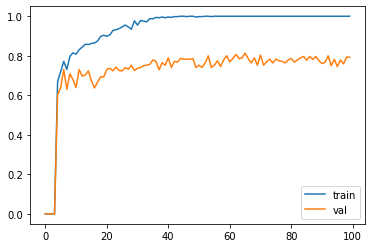

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.600000).  Saving model ...
Validation acc increased (0.600000 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.697248 --> 0.716667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.716667 --> 0.720721).  Saving model ...
EarlyStopping counter: 

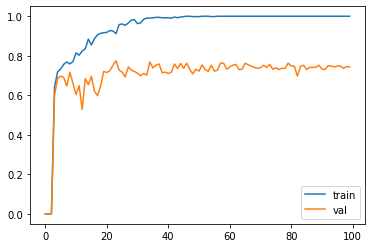

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.432432).  Saving model ...
Validation acc increased (0.432432 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.715596 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStoppin

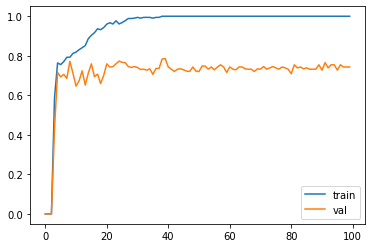

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.707071).  Saving model ...
Validation acc increased (0.707071 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.763636).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping c

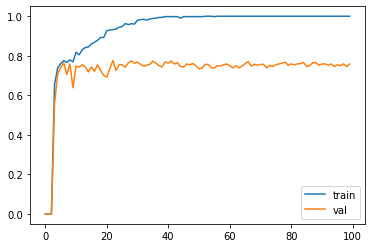

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.193548).  Saving model ...
Validation acc increased (0.193548 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.740741 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.779661 --> 0.790323).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.790323 --> 0.793388).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.793388 --> 0.800000).  Saving mo

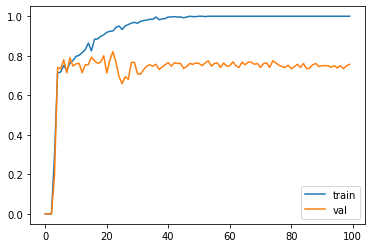

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.473684).  Saving model ...
Validation acc increased (0.473684 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.733945 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733945 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747826 --> 0.759259).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

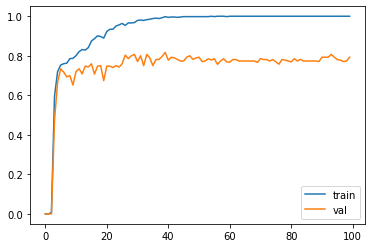

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.659341).  Saving model ...
Validation acc increased (0.659341 --> 0.732143).  Saving model ...
Validation acc increased (0.732143 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.747826).  Saving model ...
Validation acc increased (0.747826 --> 0.759259).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.759259 --> 0.762712).  Saving model ...
Validation acc increased (0.762712 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200


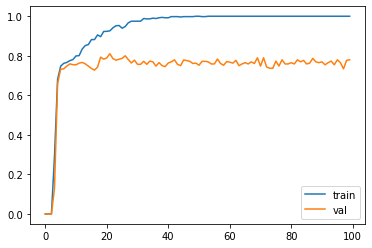

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.538462).  Saving model ...
Validation acc increased (0.538462 --> 0.701031).  Saving model ...
Validation acc increased (0.701031 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.738739 --> 0.758621).  Saving model ...
Validation acc increased (0.758621 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.758621 --> 0.767857).  Saving model ...
Validation acc increased (0.767857 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.767857 --> 0.773585).  Saving model ...


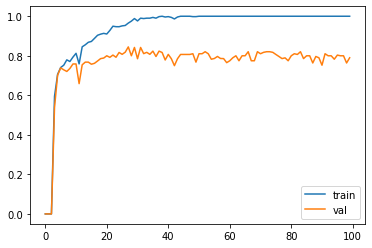

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.571429).  Saving model ...
Validation acc increased (0.571429 --> 0.632653).  Saving model ...
Validation acc increased (0.632653 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.684685).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.684685 --> 0.743802).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.743802 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

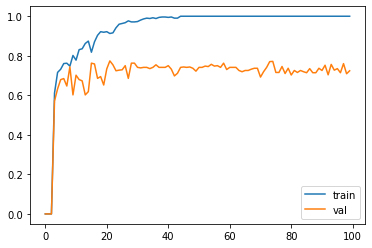

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.298507).  Saving model ...
Validation acc increased (0.298507 --> 0.558140).  Saving model ...
Validation acc increased (0.558140 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.707965 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.724138 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.741379 --> 0.754717).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

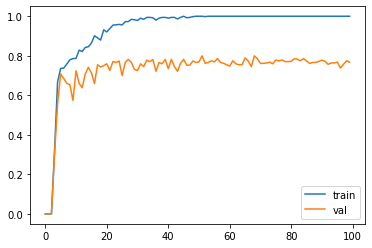

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.653846).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.653846 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.703704 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.719298 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5

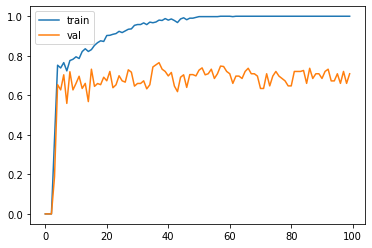

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.745455 --> 0.786885).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out

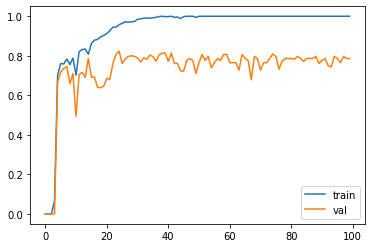

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.366197).  Saving model ...
Validation acc increased (0.366197 --> 0.631579).  Saving model ...
Validation acc increased (0.631579 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.762712 --> 0.784000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counte

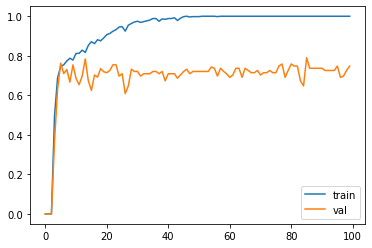

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.517647).  Saving model ...
Validation acc increased (0.517647 --> 0.612245).  Saving model ...
Validation acc increased (0.612245 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.724138 --> 0.747967).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.747967 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 

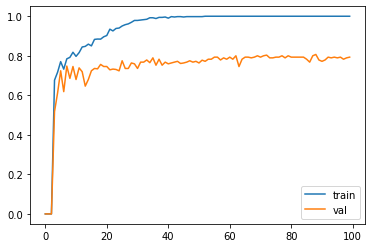

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.646465).  Saving model ...
Validation acc increased (0.646465 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.702703 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.703704 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.715596 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.727273 --> 0.732143).  Saving model ...
Validation acc increased (0.732143 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


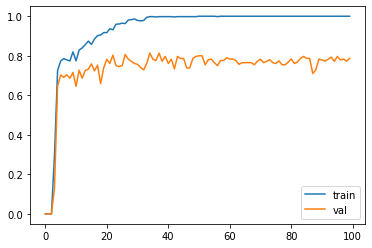

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.550000).  Saving model ...
Validation acc increased (0.550000 --> 0.617021).  Saving model ...
Validation acc increased (0.617021 --> 0.702703).  Saving model ...
Validation acc increased (0.702703 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.702703 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.713043 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.722222 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.743363 --> 0.759259).  Saving model ...


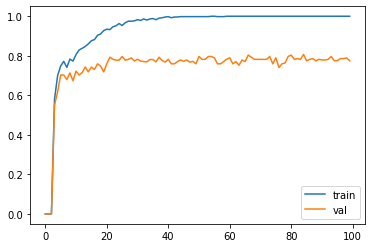

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.323529).  Saving model ...
Validation acc increased (0.323529 --> 0.536585).  Saving model ...
Validation acc increased (0.536585 --> 0.660194).  Saving model ...
Validation acc increased (0.660194 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc increased (0.709091 --> 0.736842).  Saving model ...
EarlyStopping counter

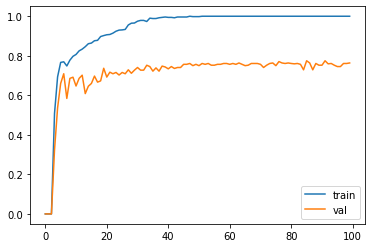

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.704762).  Saving model ...
Validation acc increased (0.704762 --> 0.709091).  Saving model ...
Validation acc increased (0.709091 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.722689).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.722689 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.7321

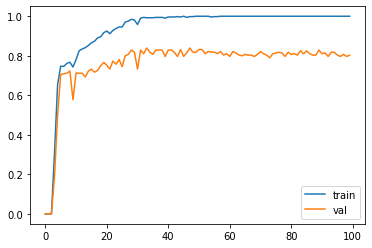

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.564103).  Saving model ...
Validation acc increased (0.564103 --> 0.766355).  Saving model ...
Validation acc increased (0.766355 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping counter: 15 out of 200
EarlyStopping counter: 16 out of 200
EarlyStop

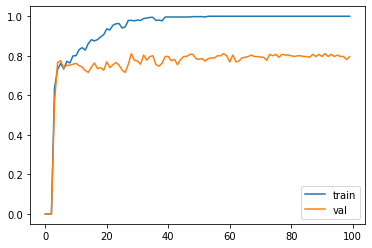

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.376812).  Saving model ...
Validation acc increased (0.376812 --> 0.680851).  Saving model ...
Validation acc increased (0.680851 --> 0.725490).  Saving model ...
Validation acc increased (0.725490 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.747664 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.750000 --> 0.769231).  Saving model ...
Validation acc increased (0.769231 --> 0.780952).  Saving model ...
Validation acc increased (0.780952 --> 0.788462).  Saving model ...
Validation acc increased (0.788462 --> 0.803922).  Saving model ...
EarlyStopping counter: 1 out of 200
Earl

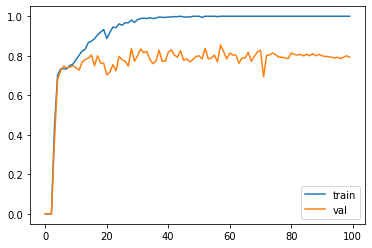

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.644444).  Saving model ...
Validation acc increased (0.644444 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.771930 --> 0.778761).  Saving model ...
Validation acc increased (0.778761 --> 0.800000).  Saving model ...
Validation acc increased (0.800000 --> 0.817391).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.817391 --> 0.825688).  Saving model ...
Validation acc increased (0.8256

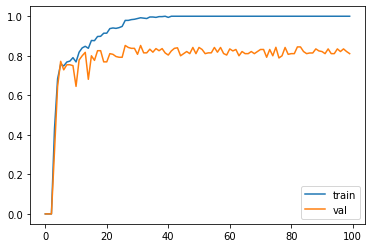

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.659574).  Saving model ...
Validation acc increased (0.659574 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.679245).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.679245 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.697248 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.703704 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.766355 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


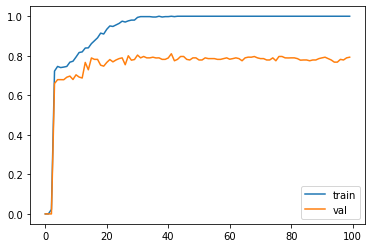

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.511628).  Saving model ...
Validation acc increased (0.511628 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.697248 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.719298 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.727273 --> 0.741379).  Saving model ...


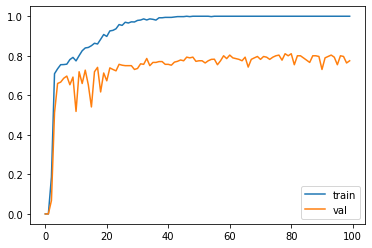

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.705882).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.705882 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.727273 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.728972 --> 0.772277).  Saving model ...
Validation acc increased (0.772277 --> 0.781818).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.781818 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 

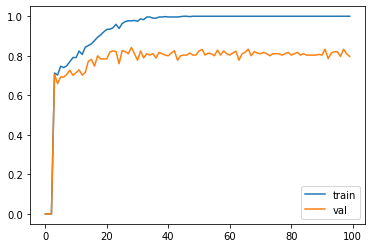

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.098361).  Saving model ...
Validation acc increased (0.098361 --> 0.721649).  Saving model ...
Validation acc increased (0.721649 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.735849 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.773585 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.788991 --> 0.814815).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 

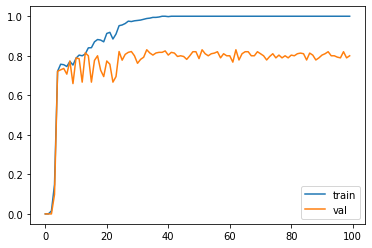

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.758621 --> 0.783333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.783333 --> 0.825688).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3

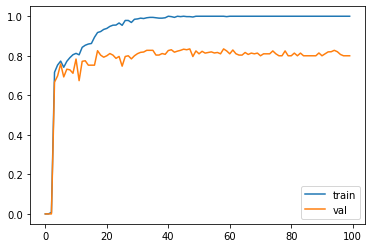

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.366197).  Saving model ...
Validation acc increased (0.366197 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.715596 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.767857 --> 0.780000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.780000 --> 0.787879).  Saving model ...
EarlyStopping counter: 1 out

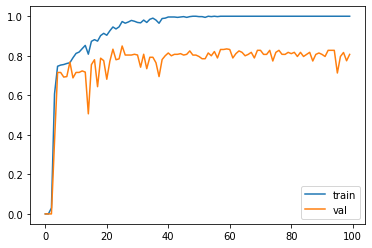

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.578313).  Saving model ...
Validation acc increased (0.578313 --> 0.680412).  Saving model ...
Validation acc increased (0.680412 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.769231 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.771930 --> 0.775862).  Saving model ...
Validation acc increased (0.775862 --> 0.803571).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.803571 --> 0.836364).  Saving model ...
Validation acc increased (0.836364 --> 0.836364).  Saving model ...
EarlyStopping counter: 1 out of 200


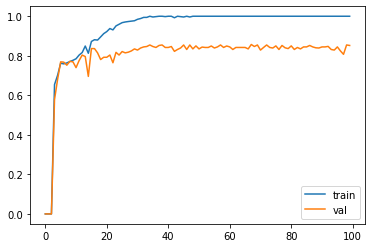

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.761062 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.766355 --> 0.778761).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.778761 --> 0.778761).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.778761 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.789474 --> 0.796460).  Saving model 

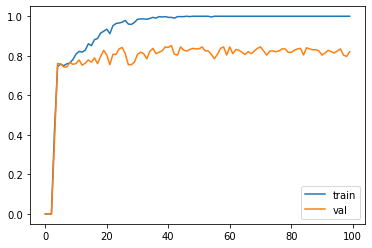

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.630435).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.630435 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.722222 --> 0.737864).  Saving model ...
Validation acc increased (0.737864 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.742857 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.766355 --> 0.781818).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

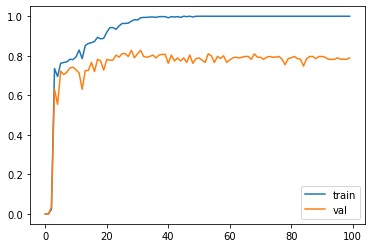

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.735849 --> 0.745098).  Saving model ...
Validation acc increased (0.745098 --> 0.769231).  Saving model ...
Validation acc increased (0.769231 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counte

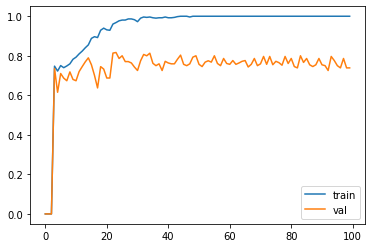

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.519481).  Saving model ...
Validation acc increased (0.519481 --> 0.673684).  Saving model ...
Validation acc increased (0.673684 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.761062 --> 0.792793).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7

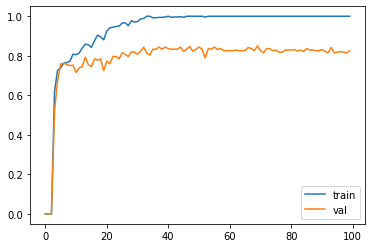

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.545455).  Saving model ...
Validation acc increased (0.545455 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.707965 --> 0.711538).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.711538 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.728972 --> 0.745455).  Saving model ...
Validation acc increased (0.

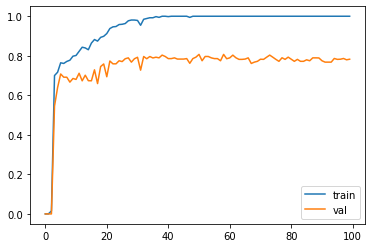

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.720721 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.725664 --> 0.742268).  Saving model ...
Validation acc increased (0.742268 --> 0.785047).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counte

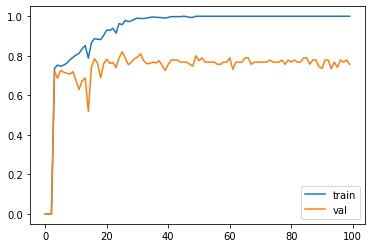

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.718447).  Saving model ...
Validation acc increased (0.718447 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.722222 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.732673).  Saving model ...
Validation acc increased (0.732673 --> 0.740000).  Saving model ...
Validation acc increased (0.740000 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.772277).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.772277 --> 0.780000).  Saving model ...
Validati

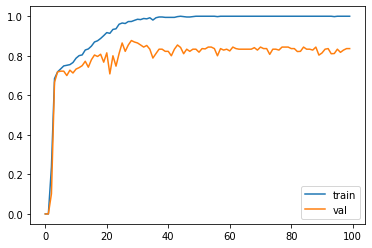

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.604651).  Saving model ...
Validation acc increased (0.604651 --> 0.747664).  Saving model ...
Validation acc increased (0.747664 --> 0.759259).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.759259 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.769231 --> 0.796296).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased

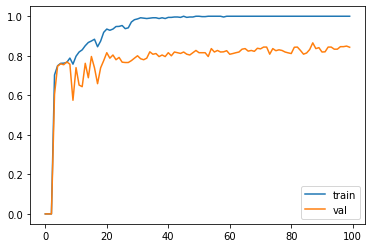

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.627907).  Saving model ...
Validation acc increased (0.627907 --> 0.730769).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730769 --> 0.730769).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730769 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747664 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.773585 --> 0.818182).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 

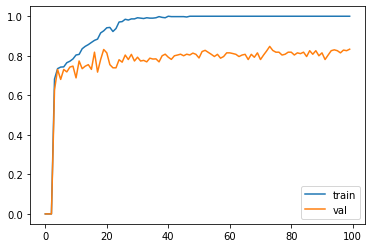

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.268657).  Saving model ...
Validation acc increased (0.268657 --> 0.487179).  Saving model ...
Validation acc increased (0.487179 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733945 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.752294 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.766355 --> 0.778761).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.778761 --> 0.800000).  Saving model ...
Validation acc increased (0.800000 -

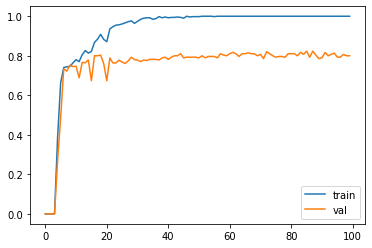

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.405405).  Saving model ...
Validation acc increased (0.405405 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.747664 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.789474 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.800000 --> 0.807692).  Saving model ...
Validation acc increased (0.807692 --> 0.830189).  Saving mo

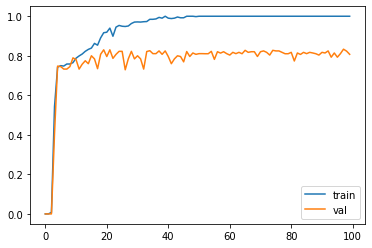

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.525000).  Saving model ...
Validation acc increased (0.525000 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.714286 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.714286 --> 0.718447).  Saving model ...
Validation acc increased (0.718447 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.732143).  Saving model ...
Validation acc increased (0.732143 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.745455).  Saving model ...
Validation acc increased (0.745455 -

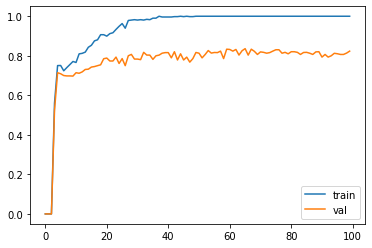

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.728972 --> 0.740000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.740000 --> 0.742268).  Saving model ...
Validation acc incr

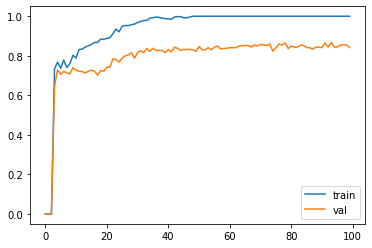

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.759259).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.759259 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
Validation acc increased (0.774775 --> 0.796296).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStoppin

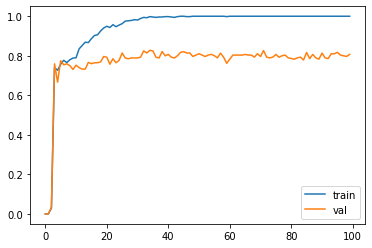

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.700000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.700000 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.736842 --> 0.740000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.740000 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased

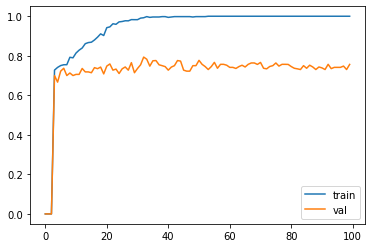

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.584270).  Saving model ...
Validation acc increased (0.584270 --> 0.718447).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.718447 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.720721 --> 0.761905).  Saving model ...
Validation acc increased (0.761905 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.777778 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

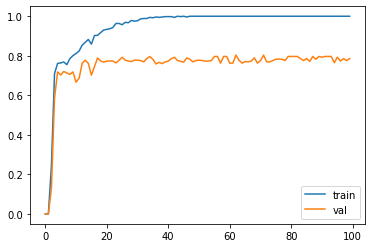

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.438356).  Saving model ...
Validation acc increased (0.438356 --> 0.807018).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.807018 --> 0.831858).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.831858 --> 0.841121).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping count

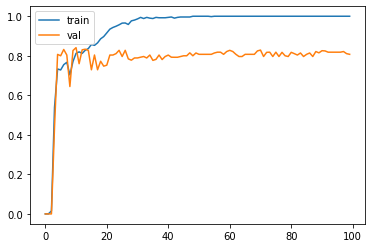

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.571429).  Saving model ...
Validation acc increased (0.571429 --> 0.807018).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.807018 --> 0.818182).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.818182 --> 0.818182).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.818182 --> 0.830189).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.830189 --> 0.830189).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.

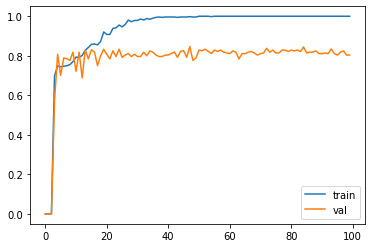

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.347826).  Saving model ...
Validation acc increased (0.347826 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.709091 --> 0.711538).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.711538 --> 0.737864).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.737864 --> 0.752475).  Saving model ...
Validation acc increased (0.752475 --> 0.760000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.760000 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out

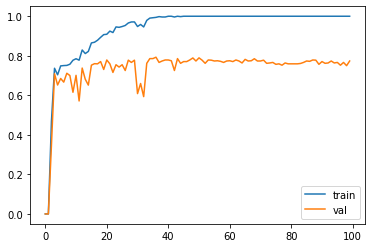

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.707965).  Saving model ...
Validation acc increased (0.707965 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.714286 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.754717).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.754717 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.757282).  Saving model 

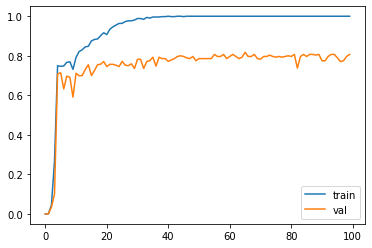

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.687500).  Saving model ...
Validation acc increased (0.687500 --> 0.700000).  Saving model ...
Validation acc increased (0.700000 --> 0.788991).  Saving model ...
Validation acc increased (0.788991 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.788991 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.788991 --> 0.792079).  Saving model ...
Validation acc increased (0.792079 --> 0.811321).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

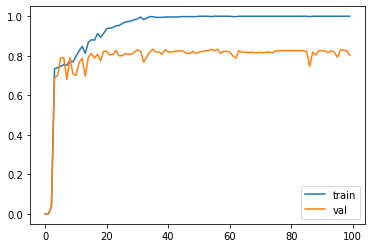

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.212121).  Saving model ...
Validation acc increased (0.212121 --> 0.680412).  Saving model ...
Validation acc increased (0.680412 --> 0.680412).  Saving model ...
Validation acc increased (0.680412 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.733945 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747664 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.777778 --> 0.780952).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

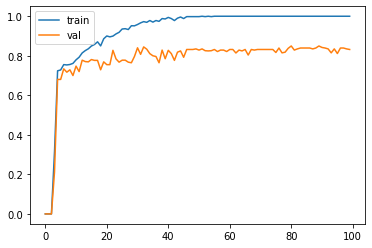

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.294118).  Saving model ...
Validation acc increased (0.294118 --> 0.707071).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.707071 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.742857 --> 0.761905).  Saving model ...
Validation acc increased (0.761905 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.766355 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200


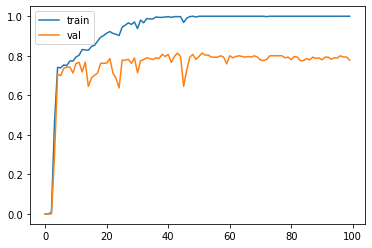

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.447368).  Saving model ...
Validation acc increased (0.447368 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.767857 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.777778 --> 0.806723).  Saving model ...
Validation acc increased (0.806723 --> 0.811321).  Saving model ...
Validation acc increased (0.8113

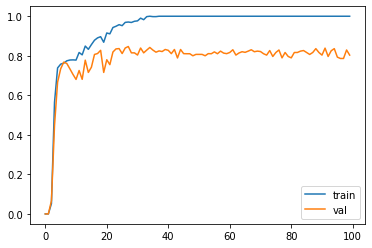

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.757282).  Saving model ...
Validation acc increased (0.757282 --> 0.819672).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc increased (0.819672 --> 0.838095).  Saving model ...
Validation acc increased (0.838095 --> 0.838095).  Saving model ...
Validation acc increased (0.838095 --> 0.864865).  Saving model ...
EarlyStopping counter

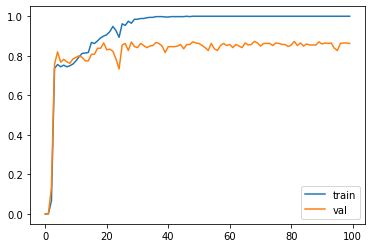

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.571429).  Saving model ...
Validation acc increased (0.571429 --> 0.725490).  Saving model ...
Validation acc increased (0.725490 --> 0.747826).  Saving model ...
Validation acc increased (0.747826 --> 0.752137).  Saving model ...
Validation acc increased (0.752137 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.758621 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.774775 --> 0.785714).  Saving model ...
EarlyStopping counter: 1 out of 

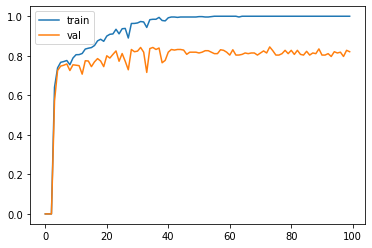

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.447368).  Saving model ...
Validation acc increased (0.447368 --> 0.588235).  Saving model ...
Validation acc increased (0.588235 --> 0.673913).  Saving model ...
Validation acc increased (0.673913 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.758621 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.770642 --> 0.770642).  Saving model ...
Validation acc increased (0.770642 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.800000 --> 0.814159).  Saving model ...


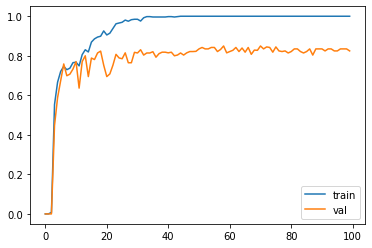

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.531646).  Saving model ...
Validation acc increased (0.531646 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.720721 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.738739 --> 0.745098).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 

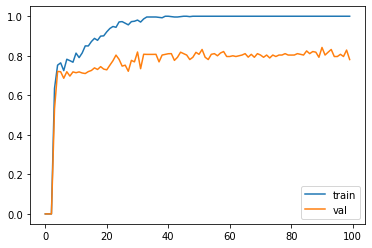

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.394366).  Saving model ...
Validation acc increased (0.394366 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.697248 --> 0.732673).  Saving model ...
Validation acc increased (0.732673 --> 0.740000).  Saving model ...
Validation acc increased (0.740000 --> 0.757282).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.757282 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.770642 -

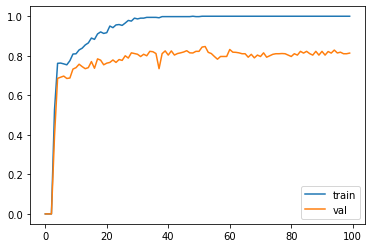

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.680412).  Saving model ...
Validation acc increased (0.680412 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.727273 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.732143 --> 0.732143).  Saving model ...
Validation acc increased (0.732143 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 -

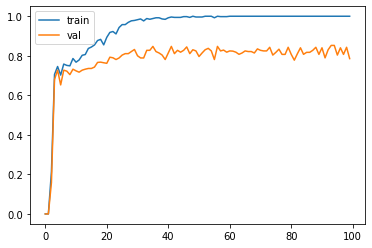

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.512195).  Saving model ...
Validation acc increased (0.512195 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.727273 --> 0.745098).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.745098 --> 0.745098).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745098 --> 0.764706).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

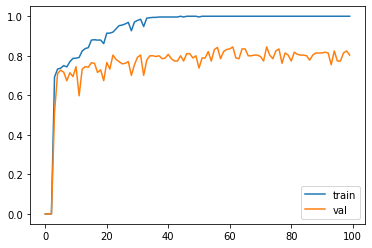

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.421053).  Saving model ...
Validation acc increased (0.421053 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.709091 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.719298 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping count

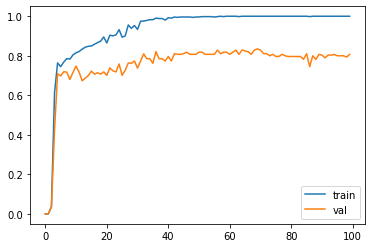

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747826 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.754386 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.766355 --> 0.773585).  Saving model ...
Validation acc increased (0.773585 --> 0.776699).  Saving model ...
Validation acc increased (0.776699 --> 0.788462).  Saving model ...
Validation acc increased (0.788462 --> 0.788462).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.788462 --> 0.788462).  Saving model ...
Validation acc increased (0.788462 --> 0

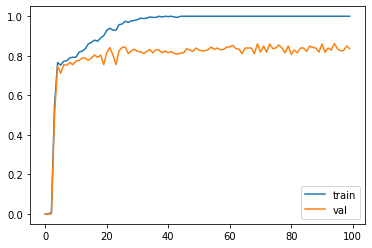

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.342857).  Saving model ...
Validation acc increased (0.342857 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.714286 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733945 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out

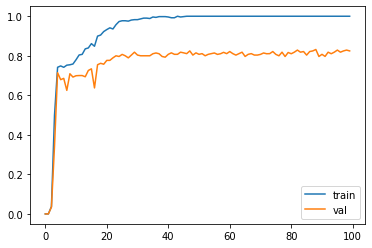

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.361111).  Saving model ...
Validation acc increased (0.361111 --> 0.659341).  Saving model ...
Validation acc increased (0.659341 --> 0.700000).  Saving model ...
Validation acc increased (0.700000 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.740741 --> 0.752475).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752475 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.761062 --> 0.772277).  Saving model ...
Validation acc increased (0.772277 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.777778 -

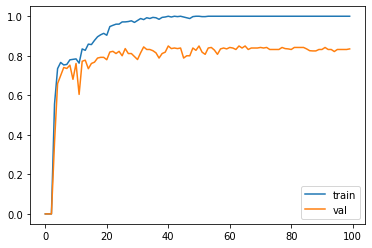

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.680851).  Saving model ...
Validation acc increased (0.680851 --> 0.700000).  Saving model ...
Validation acc increased (0.700000 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747664 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.766355 --> 0.788462).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.788462 -

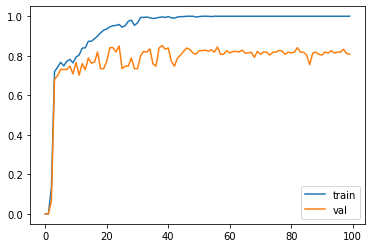

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.276923).  Saving model ...
Validation acc increased (0.276923 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.754717).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.754717 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.767857 --> 0.780952).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.780952 --> 0.807339).  Saving model ...
Validation acc increased (0.

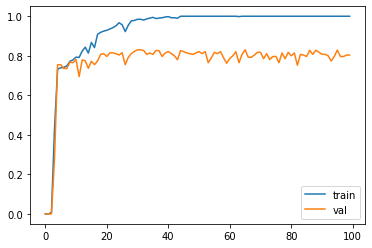

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.688172).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.688172 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.774775 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.788991 --> 0.796117).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counte

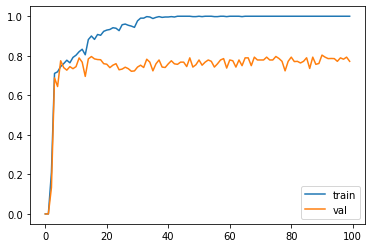

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.597701).  Saving model ...
Validation acc increased (0.597701 --> 0.694737).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.694737 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.735849 --> 0.752475).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752475 --> 0.788462).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.788462 --> 0.792079).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.792079 --> 0.826923).  Saving model 

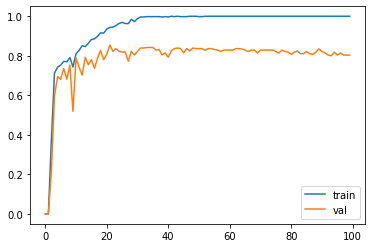

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.673267).  Saving model ...
Validation acc increased (0.673267 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.697248 --> 0.698113).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.698113 --> 0.712871).  Saving model ...
Validation acc increased (0.712871 --> 0.725490).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.725490 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.729167).  Saving model ...
Validation acc increased (0.729167 --> 0.755102).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Earl

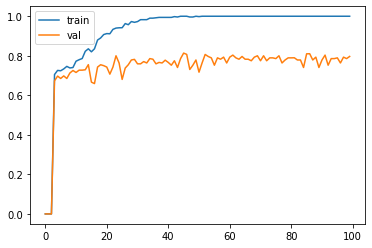

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.718447).  Saving model ...
Validation acc increased (0.718447 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 --> 0.730769).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.730769 --> 0.732673).  Saving model ...
Validation acc increased (0.732673 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9

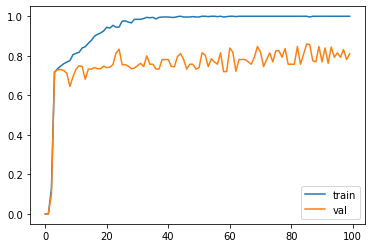

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.383562).  Saving model ...
Validation acc increased (0.383562 --> 0.721649).  Saving model ...
Validation acc increased (0.721649 --> 0.737864).  Saving model ...
Validation acc increased (0.737864 --> 0.763636).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.763636 --> 0.788462).  Saving model ...
Validation acc increased (0.788462 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 ou

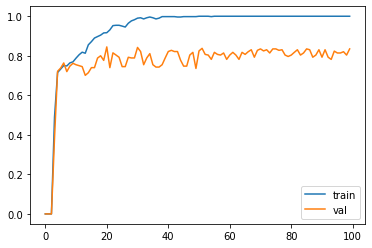

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.435897).  Saving model ...
Validation acc increased (0.435897 --> 0.700000).  Saving model ...
Validation acc increased (0.700000 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.723810 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.728972 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.742268).  Saving model ...
Validation acc increased (0.742268 --> 0.767677).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

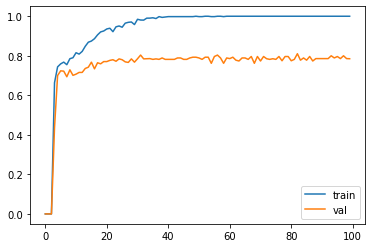

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.730769).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730769 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.747826 --> 0.754717).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.754717 --> 0.759259).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.759259 --> 0.775862).  Saving model ...
Validation acc increased (0.775862 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 

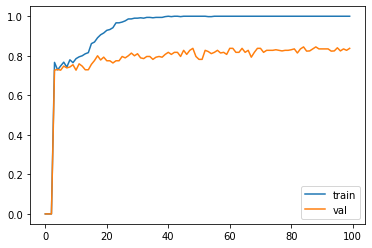

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.298507).  Saving model ...
Validation acc increased (0.298507 --> 0.673913).  Saving model ...
Validation acc increased (0.673913 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.761062 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.761062 --> 0.772277).  Saving model ...
Validation acc increased (0.772277 --> 0.796296).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

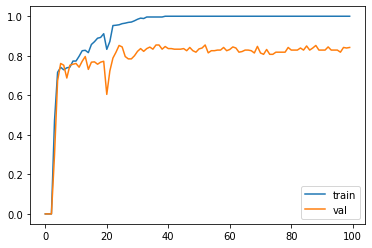

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733945 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.740741 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.740741 --> 0.754717).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.754717 --> 0.780952).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.780952 --> 0.807692).  Saving model ...
EarlyStopping counter: 1 out of 

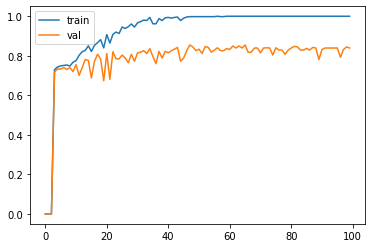

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.586957).  Saving model ...
Validation acc increased (0.586957 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.685714).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.685714 --> 0.704762).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.704762 --> 0.718447).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.718447 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.7500

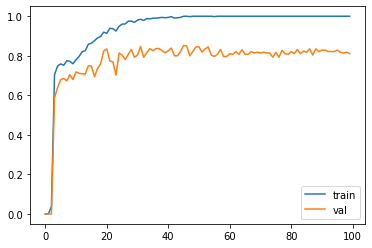

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.276923).  Saving model ...
Validation acc increased (0.276923 --> 0.707071).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.707071 --> 0.712871).  Saving model ...
Validation acc increased (0.712871 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.761905 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.773585 --> 0.800000).  Saving model ...
Validation acc increased (0.800000 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200


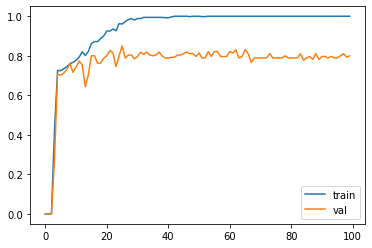

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.738739 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.747826 --> 0.767857).  Saving model ...
Validation acc increased (0.767857 --> 0.767857).  Saving model ...
Validation acc increased (0.767857 --> 0.785047).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9

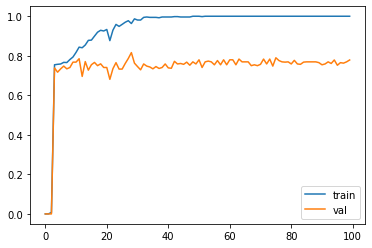

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.700000).  Saving model ...
Validation acc increased (0.700000 --> 0.702703).  Saving model ...
Validation acc increased (0.702703 --> 0.723810).  Saving model ...
Validation acc increased (0.723810 --> 0.725490).  Saving model ...
Validation acc increased (0.725490 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745455 --> 0.752294).  Saving model ...
Validation acc increased (0.752294 --> 0.757282).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.757282 --> 0.769231).  Saving model ...
Validation acc increased (0.769231 --> 0

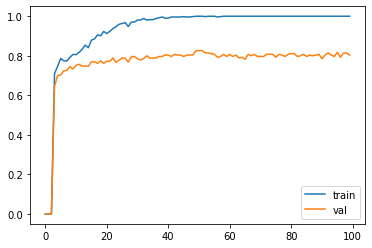

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.673267).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.673267 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.714286 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.723810 --> 0.730769).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730769 --> 0.730769).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730769 --> 0.737864).  Saving model ...
Validation acc increased (0.737864 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200


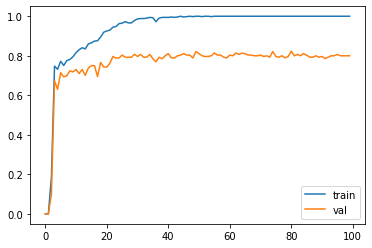

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.720721 --> 0.775862).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.775862 --> 0.783333).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.783333 --> 0.792793).  Saving model ...
Validation acc increased (0.792793 --> 0.807692).  Saving mo

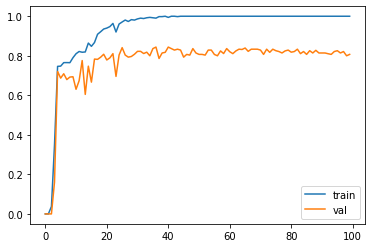

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.752137 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping co

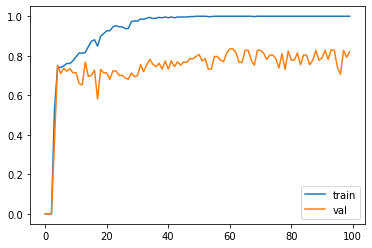

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping counter: 15 out of 200
EarlyStopping counter: 16 out of 200
EarlyStopping counter: 17 out of 200
EarlyStopping counter: 18 out of 200
EarlyStopping counter: 19 out of 200
EarlyStopping counter: 20 out of 2

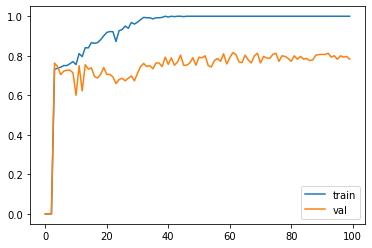

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.242424).  Saving model ...
Validation acc increased (0.242424 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc increased (0.720721 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.738739).  Saving model ...
EarlyStopping counter

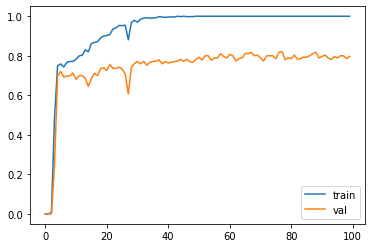

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.264706).  Saving model ...
Validation acc increased (0.264706 --> 0.506024).  Saving model ...
Validation acc increased (0.506024 --> 0.631579).  Saving model ...
Validation acc increased (0.631579 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.690909 --> 0.732673).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.732673 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased

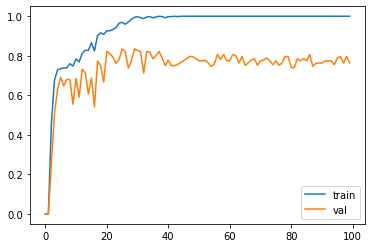

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.721649).  Saving model ...
Validation acc increased (0.721649 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747664 --> 0.785047).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.785047 --> 0.787879).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.787879 --> 0.803922).  Saving model ...
Validation acc increased (0.803922 --> 0.803922).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

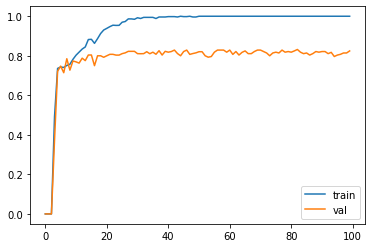

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.653061).  Saving model ...
Validation acc increased (0.653061 --> 0.747664).  Saving model ...
Validation acc increased (0.747664 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.757282).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.757282 --> 0.764706).  Saving model ...
Validation acc increased (0.764706 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.766355 --> 0.767677).  Saving model ...
Vali

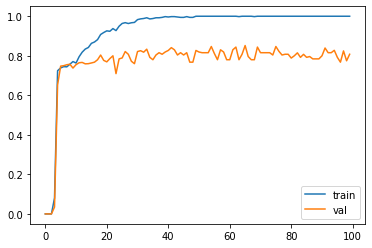

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.710280 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.723810 --> 0.745098).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc incr

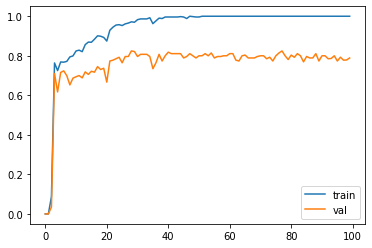

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.534884).  Saving model ...
Validation acc increased (0.534884 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.723810 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.754386).  Saving model ...
Validation acc increased (0.754386 --> 0.776699).  Saving model ...
Validation acc increased (0.776699 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 ou

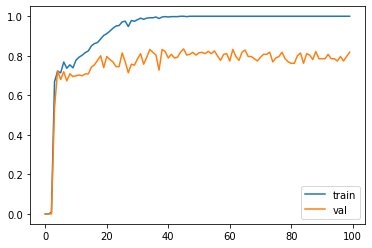

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.652632).  Saving model ...
Validation acc increased (0.652632 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.738739 --> 0.747475).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.747475 --> 0.755102).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counte

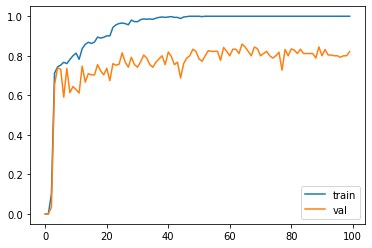

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.593407).  Saving model ...
Validation acc increased (0.593407 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.758621 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.762712 --> 0.803571).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5

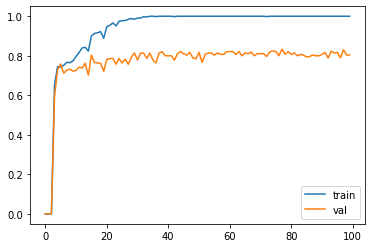

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.673469).  Saving model ...
Validation acc increased (0.673469 --> 0.754386).  Saving model ...
Validation acc increased (0.754386 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.771930 --> 0.782609).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.782609 --> 0.796460).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

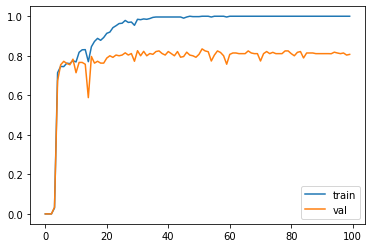

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.711538).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.711538 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.720721 --> 0.732673).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732673 --> 0.742268).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.742268 --> 0.766355).  Saving model ...
Validation acc increased (0.766355 --> 0.785047).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.785047 --> 0.792079).  Saving model ...
Validation acc increased (0.792079 -

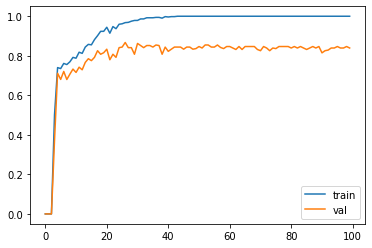

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.215385).  Saving model ...
Validation acc increased (0.215385 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.720721 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.743363 --> 0.752294).  Saving model ...
EarlyStopping counte

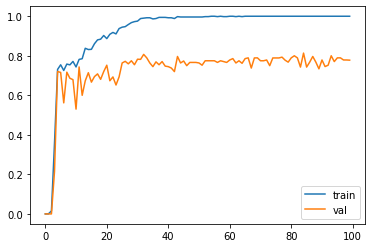

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.629213).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.629213 --> 0.766355).  Saving model ...
Validation acc increased (0.766355 --> 0.775862).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.775862 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.800000 --> 0.837607).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4

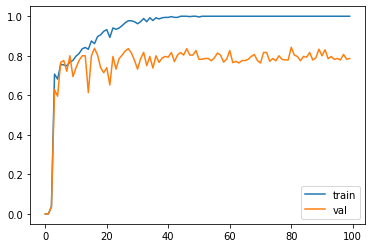

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.737864).  Saving model ...
Validation acc increased (0.737864 --> 0.777778).  Saving model ...
Validation acc increased (0.777778 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.800000 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.800000 --> 0.814815).  Saving model ...
Validation acc increased (0.

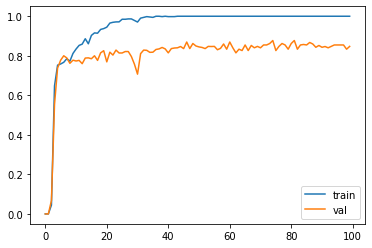

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.640000).  Saving model ...
Validation acc increased (0.640000 --> 0.702703).  Saving model ...
Validation acc increased (0.702703 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.702703 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.730435 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745455 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.761062 --> 0.771930).  Saving model 

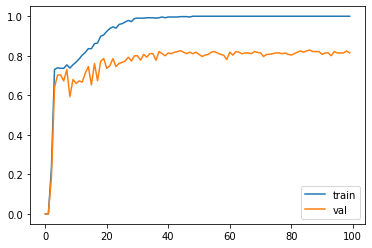

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.574713).  Saving model ...
Validation acc increased (0.574713 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.774775 --> 0.796296).  Saving model ...
Validation acc increased (0.796296 --> 0.814815).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.814815 --> 0.817391).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.817391 --> 0.842105).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

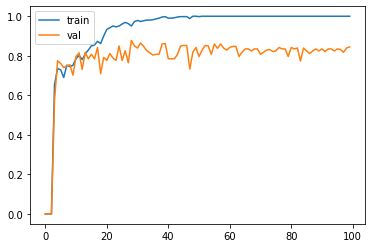

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.590909).  Saving model ...
Validation acc increased (0.590909 --> 0.637363).  Saving model ...
Validation acc increased (0.637363 --> 0.718447).  Saving model ...
Validation acc increased (0.718447 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.754386 --> 0.761905).  Saving model ...
Validation acc increased (0.761905 --> 0.778761).  Saving model ...
Validation acc increased (0.778761 --> 0.780952).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.780952 --> 0.800000).  Saving model ...
Validation acc increased (0.800000 --> 0.807692).  Saving model ...
Earl

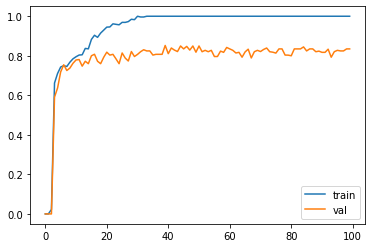

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.378378).  Saving model ...
Validation acc increased (0.378378 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.735043 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.736842 --> 0.747664).  Saving model ...
Validation acc increased (0.747664 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.761905 --> 0.766355).  Saving model 

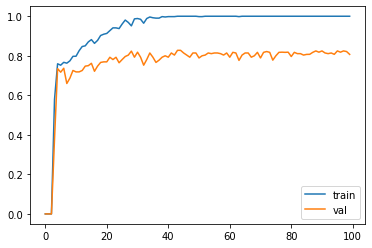

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.754386 --> 0.763636).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.763636 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.773585 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counte

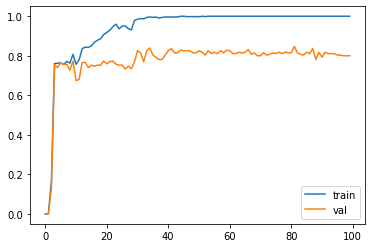

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.727273 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.745098).  Saving model ...
Validation acc increased (0.745098 --> 0.757282).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.757282 --> 0.760000).  Saving mo

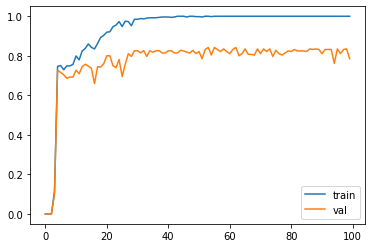

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.564706).  Saving model ...
Validation acc increased (0.564706 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.699029).  Saving model ...
Validation acc increased (0.699029 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.703704 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.713043 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733945 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.767857 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


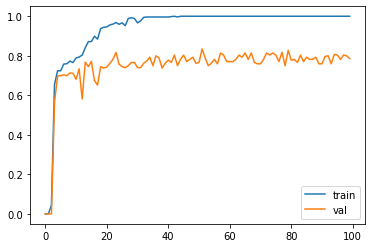

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.730769).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730769 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.742857 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.769231 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

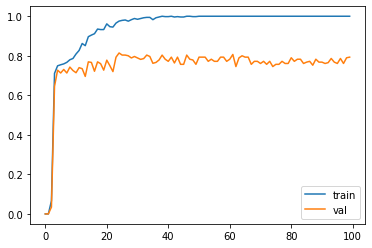

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.807018).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping counter: 15 out of 200
EarlyStopping counter: 16 out of 200
EarlyStopping counter: 17 out of 200
EarlyStopping counter: 18 out of 200
Validation acc increased (0.807018 --> 0.807018).  Saving model ...
Ear

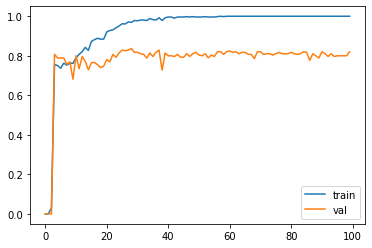

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.394366).  Saving model ...
Validation acc increased (0.394366 --> 0.776699).  Saving model ...
Validation acc increased (0.776699 --> 0.780952).  Saving model ...
Validation acc increased (0.780952 --> 0.827586).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.827586 --> 0.830508).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.830508 --> 0.841121).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out

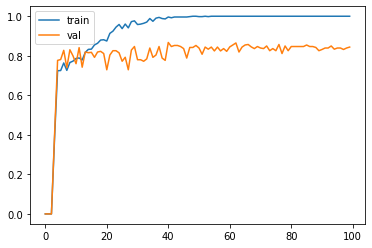

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.725490).  Saving model ...
Validation acc increased (0.725490 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.763636).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.763636 --> 0.764706).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.764706 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.789474 --> 0.796296).  Saving model ...
EarlyStopping counter: 1 out of 

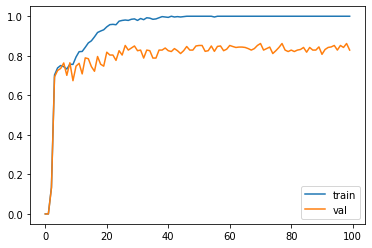

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.578313).  Saving model ...
Validation acc increased (0.578313 --> 0.788991).  Saving model ...
Validation acc increased (0.788991 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.800000 --> 0.803419).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.803419 --> 0.807692).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.807692 --> 0.842105).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.842105 --> 0.844828).  Saving model 

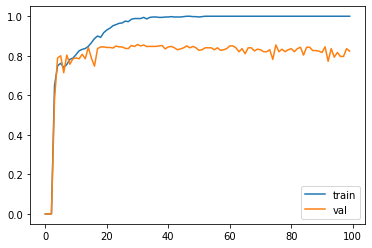

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.770642 --> 0.776699).  Saving model ...
Validation acc increased (0.776699 --> 0.778761).  Saving model ...
Validation acc increased (0.778761 --> 0.803738).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.803738 --> 0.811321).  Saving model ...
Validation acc increased (0.811321 --> 0.819048).  Saving model ...
Validation acc increased (0.819048 --> 0.819048).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.819048 --> 0.819048).  Saving model ...


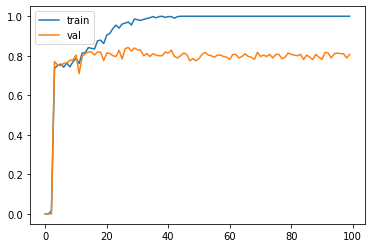

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.757282).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.757282 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.770642 --> 0.785714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.785714 --> 0.796296).  S

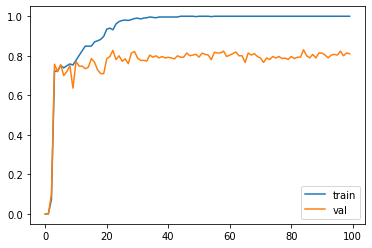

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.673684).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.673684 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.732143 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.756757 --> 0.762887).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.762887 --> 0.762887).  Saving mo

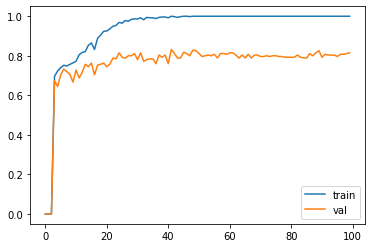

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.098361).  Saving model ...
Validation acc increased (0.098361 --> 0.447368).  Saving model ...
Validation acc increased (0.447368 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.747826 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counte

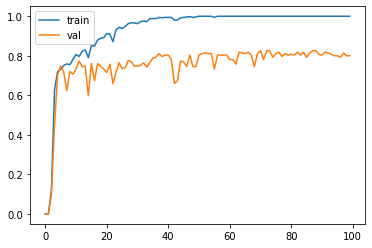

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.432432).  Saving model ...
Validation acc increased (0.432432 --> 0.761062).  Saving model ...
Validation acc increased (0.761062 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping counter: 15 out of 200
EarlyStopping counter: 16 out of 200
EarlyStop

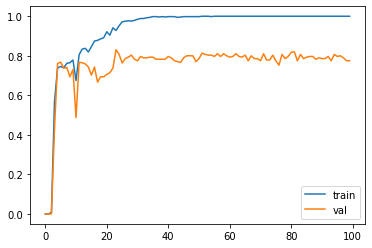

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.718447).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.718447 --> 0.765217).  Saving model ...
Validation acc increased (0.765217 --> 0.766355).  Saving model ...
Validation acc increased (0.766355 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.770642 --> 0.803419).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 

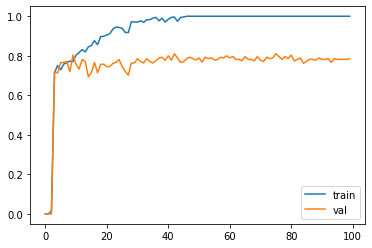

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.646465).  Saving model ...
Validation acc increased (0.646465 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.696429).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.696429 --> 0.706897).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.706897 --> 0.716981).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.716981 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.723810 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.7678

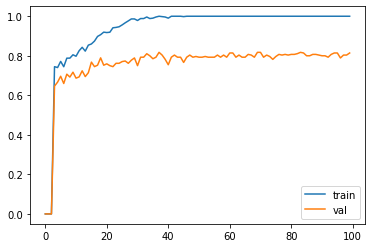

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.416667).  Saving model ...
Validation acc increased (0.416667 --> 0.693878).  Saving model ...
Validation acc increased (0.693878 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.750000 --> 0.763636).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.763636 --> 0.764706).  Saving model ...
Validation acc increased (0.764706 --> 0.778761).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


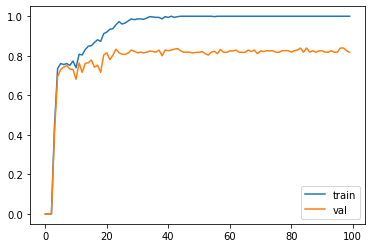

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.697248 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.709091 --> 0.737864).  Saving model ...
Validation acc increased (0.737864 --> 0.737864).  Saving model ...
Validation acc increased (0.737864 --> 0.740000).  Saving model ...
Validation acc increased (0.740000 --> 0.757282).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.757282 --> 0.792453).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


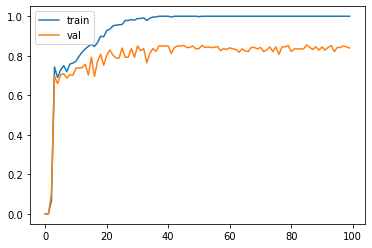

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.534884).  Saving model ...
Validation acc increased (0.534884 --> 0.600000).  Saving model ...
Validation acc increased (0.600000 --> 0.679612).  Saving model ...
Validation acc increased (0.679612 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.703704 --> 0.705882).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.705882 --> 0.720000).  Saving model ...
Validation acc increased (0.720000 --> 0.720000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

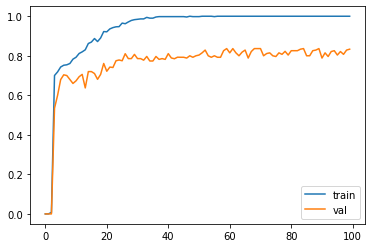

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.212121).  Saving model ...
Validation acc increased (0.212121 --> 0.602151).  Saving model ...
Validation acc increased (0.602151 --> 0.684685).  Saving model ...
Validation acc increased (0.684685 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.736000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.736000 --> 0.736000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.736000 --> 0.743802).  Saving model ...
Validation acc increased (0.743802 --> 0.754386).  Saving model ...
Vali

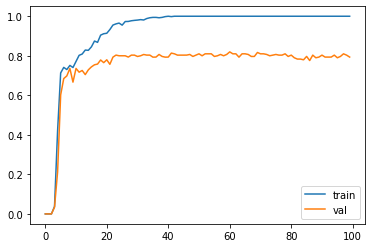

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.163934).  Saving model ...
Validation acc increased (0.163934 --> 0.659341).  Saving model ...
Validation acc increased (0.659341 --> 0.737864).  Saving model ...
Validation acc increased (0.737864 --> 0.761905).  Saving model ...
Validation acc increased (0.761905 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.777778 --> 0.781818).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.781818 --> 0.792453).  Saving model ...
Validation acc increased (0.792453 --> 0.796460).  Saving model ...
Validation acc increased (0.796460 --> 0.800000).  Saving model ...
Vali

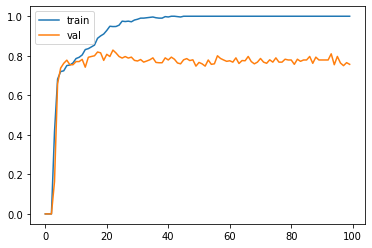

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.519481).  Saving model ...
Validation acc increased (0.519481 --> 0.673684).  Saving model ...
Validation acc increased (0.673684 --> 0.712871).  Saving model ...
Validation acc increased (0.712871 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.774775 --> 0.777778).  Saving model ...
Validation acc increased (0.777778 --> 0.788991).  Saving model ...
Validation acc increased (0.788991 --> 0.831858).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlySto

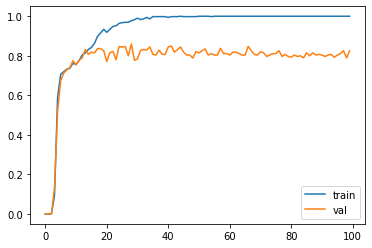

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.314286).  Saving model ...
Validation acc increased (0.314286 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.756757 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.765217 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.765217 --> 0.789916).  Saving model ...
Validation acc increased (0.789916 --> 0.800000).  Saving model ...
Validation acc increased (0.800000 --> 0.806723).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.806723 -

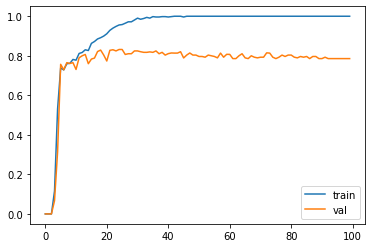

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.543210).  Saving model ...
Validation acc increased (0.543210 --> 0.586957).  Saving model ...
Validation acc increased (0.586957 --> 0.617021).  Saving model ...
Validation acc increased (0.617021 --> 0.685185).  Saving model ...
Validation acc increased (0.685185 --> 0.685185).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.685185 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.695652).  Saving model ...
Validation acc increased (0.695652 --> 0.707965).  Saving model ...
Validation acc increased (0.707965 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.724138).  Saving model ...
Validation acc increased (0.724138 --> 0.750000).  Saving model ...
EarlyStoppin

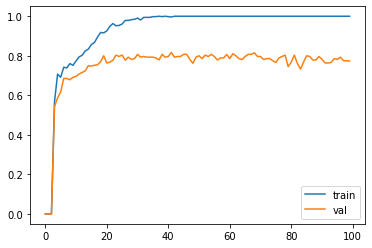

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.586957).  Saving model ...
Validation acc increased (0.586957 --> 0.621359).  Saving model ...
Validation acc increased (0.621359 --> 0.672897).  Saving model ...
Validation acc increased (0.672897 --> 0.685185).  Saving model ...
Validation acc increased (0.685185 --> 0.685185).  Saving model ...
Validation acc increased (0.685185 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.715596 --> 0.717949).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.717949 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.743363 --> 0

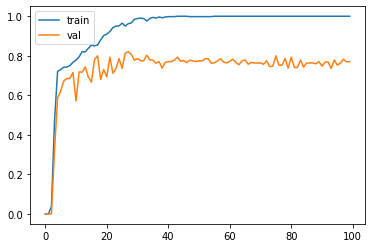

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.561798).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.561798 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.685714).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.685714 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752137 --> 0.757282).  Saving model ...
Validation acc increased (0.757282 --> 0.767857).  Saving model ...
Validation acc increased (0.767857 --> 0.783333).  Saving model ...
EarlySto

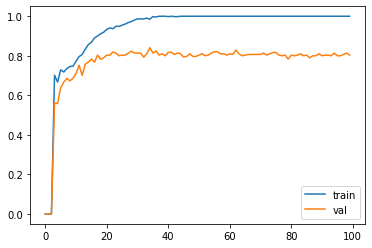

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.487179).  Saving model ...
Validation acc increased (0.487179 --> 0.685714).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.685714 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745455 --> 0.765217).  Saving model ...
Validation acc increased (0.765217 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.765217 --> 0.786325).  Saving model ...
Validation acc increased (0.786325 --> 0.818182).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Vali

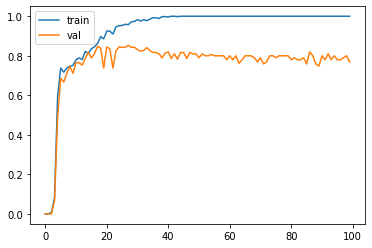

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.613636).  Saving model ...
Validation acc increased (0.613636 --> 0.638298).  Saving model ...
Validation acc increased (0.638298 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.761062 --> 0.776860).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.776860 --> 0.785714).  Saving model ...
Validation acc increased (0.785714 --> 0.793388).  Saving model ...
Validation acc increased (0.793388 --> 0.803279).  Saving model ...
Validation acc increased (0.8032

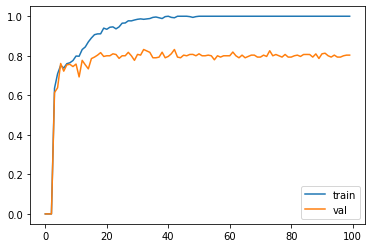

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.699029).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.699029 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.758621 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.781818).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.781818 --> 0.785714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


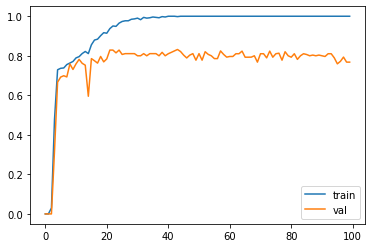

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.268657).  Saving model ...
Validation acc increased (0.268657 --> 0.531646).  Saving model ...
Validation acc increased (0.531646 --> 0.747826).  Saving model ...
Validation acc increased (0.747826 --> 0.761062).  Saving model ...
Validation acc increased (0.761062 --> 0.761062).  Saving model ...
Validation acc increased (0.761062 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.773109 --> 0.778761).  Saving model ...
Validation acc increased (0.778761 --> 0.793388).  Saving model ...
Validation acc increased (0.793388 --> 0.796610).  Saving model ...
Validation acc increased (0.796610 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.800000 --> 0.806

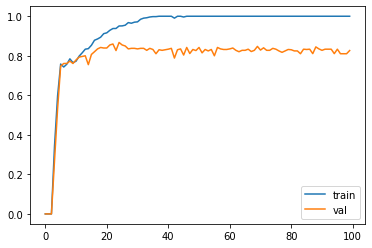

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.068966).  Saving model ...
Validation acc increased (0.068966 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.758621 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.769231 --> 0.780488).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.780488 --> 0.780952).  Saving model ...
Validation acc increased (0.780952 --> 0.813008).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.8130

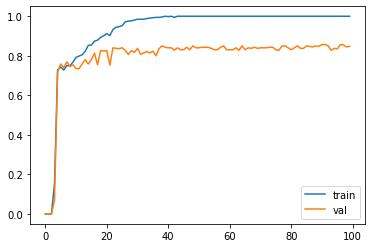

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.461538).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.461538 --> 0.691589).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.691589 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.730435 --> 0.745455).  Saving model ...
Validation acc increased (0.745455 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.770642 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200


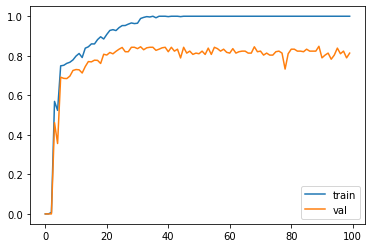

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.600000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.600000 --> 0.699029).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.699029 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.728972 --> 0.756757).  Saving model ...
Validation acc increased (0.756757 --> 0.767857).  Saving model ...
Validation acc increased (0.767857 --> 0.778761).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.778761 --> 0.782609).  Saving model 

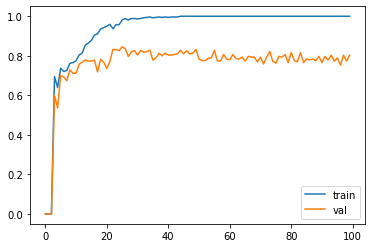

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.416667).  Saving model ...
Validation acc increased (0.416667 --> 0.687500).  Saving model ...
Validation acc increased (0.687500 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.767857).  Saving model ...
Validation acc increased (0.767857 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.767857 --> 0.785047).  Saving model ...
Validation acc increased (0.785047 --> 0.789474).  Saving model ...
Validation acc increased (0.789474 --> 0.792453).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.792453 --> 0.800000).  Saving model ...
Earl

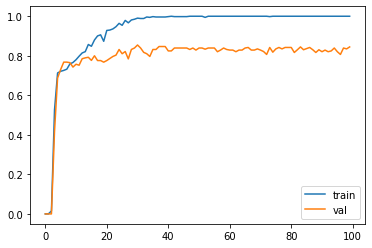

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.523810).  Saving model ...
Validation acc increased (0.523810 --> 0.690909).  Saving model ...
Validation acc increased (0.690909 --> 0.691589).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.691589 --> 0.704762).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.704762 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.720721 --> 0.739496).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.739496 --> 0.741379).  Saving model ...
Validation acc increased (0.741379 -

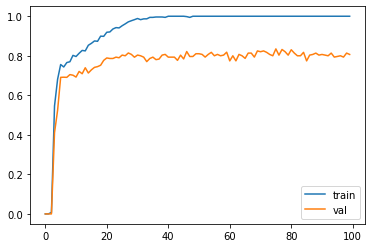

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.551724).  Saving model ...
Validation acc increased (0.551724 --> 0.561798).  Saving model ...
Validation acc increased (0.561798 --> 0.691589).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.691589 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.711538).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.711538 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.728972 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.761062).  Saving model ...
Earl

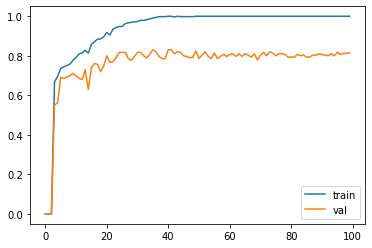

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.441558).  Saving model ...
Validation acc increased (0.441558 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.704762).  Saving model ...
Validation acc increased (0.704762 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.722222 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.756757 --> 0.788991).  Saving model ...
Validation acc increased (0.788991 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
Vali

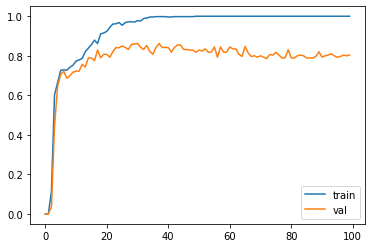

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.465753).  Saving model ...
Validation acc increased (0.465753 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.777778 --> 0.780000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.780000 --> 0.811321).  Saving model ...
Validation acc increased (0.811321 --> 0.820513).  Sav

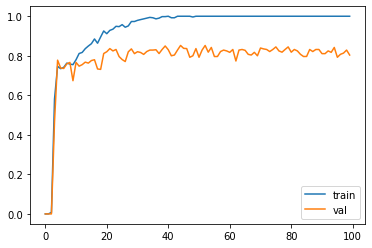

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.693069).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.693069 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.735849 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.752475).  Saving model ...
Validation acc increased (0.752475 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.771930 --> 0.803419).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.8034

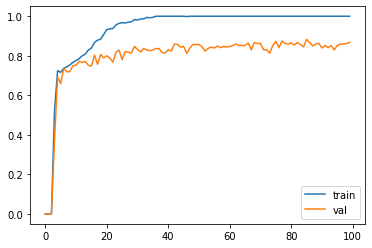

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.688172).  Saving model ...
Validation acc increased (0.688172 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.750000 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.750000 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.767857 --> 0.793103).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Vali

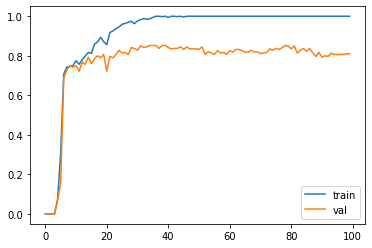

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.361111).  Saving model ...
Validation acc increased (0.361111 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.767857 --> 0.775862).  Saving model ...
Validation acc increased (0.775862 --> 0.800000).  Saving model ...
Validation acc increased (0.800000 --> 0.803738).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out

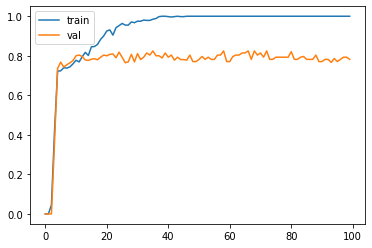

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.190476).  Saving model ...
Validation acc increased (0.190476 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.697248 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.703704 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.723810 --> 0.728814).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.728814 --> 0.756303).  Saving model ...
Validation acc increased (0.756303 -

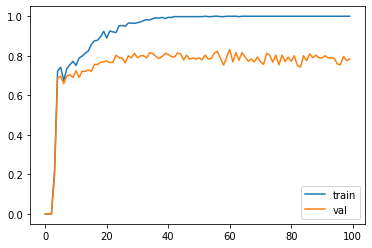

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.735849 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.750000 --> 0.764706).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.764706 --> 0.764706).  Saving model ...
Validation acc increased (0.764706 --> 0.787879).  Saving model ...
Validation acc increased (0.7878

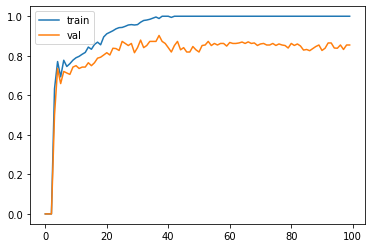

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.666667).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.666667 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.765217 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.765217 --> 0.778761).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.778761 --> 0.785714).  Saving model ...
Validation acc increased (0.785714 --> 0.807018).  Saving model 

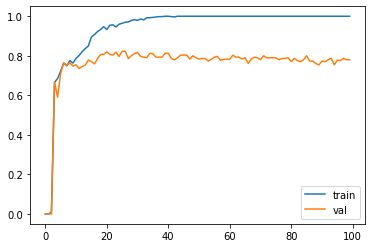

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.547619).  Saving model ...
Validation acc increased (0.547619 --> 0.608696).  Saving model ...
Validation acc increased (0.608696 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.750000 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increas

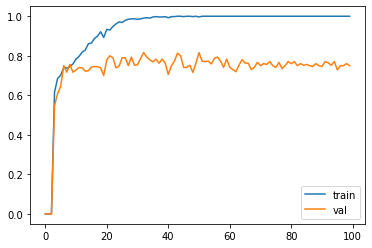

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.602151).  Saving model ...
Validation acc increased (0.602151 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.697248 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.709091 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.752294).  Saving model ...
Validation acc increased (0.752294 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.754386 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
Earl

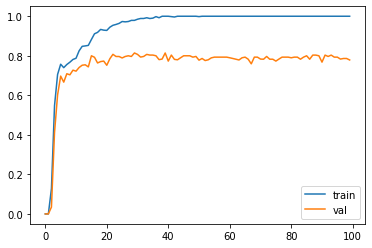

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.757282).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.757282 --> 0.817391).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.817391 --> 0.824561).  Saving model ...
Validation acc increased (0.824561 --> 0.828829).  Saving model ...
Validation acc increased (0.828829 --> 0.844828).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out

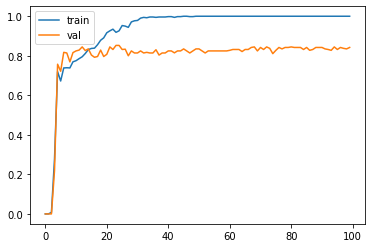

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.493506).  Saving model ...
Validation acc increased (0.493506 --> 0.789916).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.789916 --> 0.809917).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.809917 --> 0.810811).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.810811 --> 0.821429).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.821429 --> 0.831858).  Saving mo

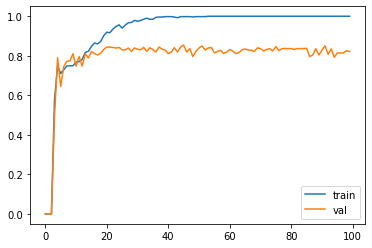

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.673267).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.673267 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.716981).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.716981 --> 0.718447).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.718447 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.742857 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.767857).  Saving model ...


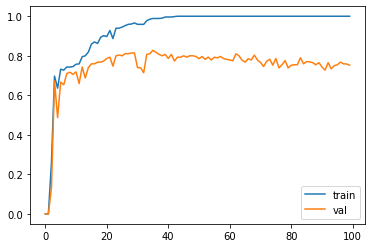

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.673077).  Saving model ...
Validation acc increased (0.673077 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.725664 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.740741 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.770642).  Saving model 

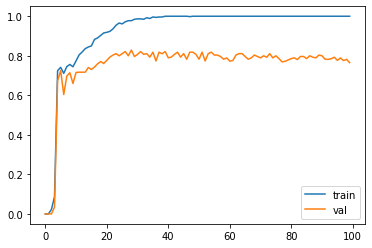

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.578313).  Saving model ...
Validation acc increased (0.578313 --> 0.694737).  Saving model ...
Validation acc increased (0.694737 --> 0.761905).  Saving model ...
Validation acc increased (0.761905 --> 0.766355).  Saving model ...
Validation acc increased (0.766355 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.769231 --> 0.781818).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.781818 --> 0.784314).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.784314 --> 0.792079).  Saving model ...
Validation acc increased (0.792079 -

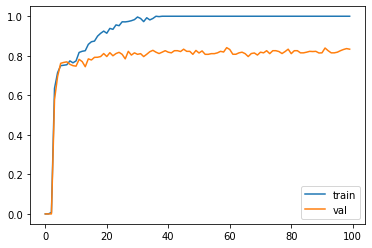

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.461538).  Saving model ...
Validation acc increased (0.461538 --> 0.564706).  Saving model ...
Validation acc increased (0.564706 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.761062 --> 0.782609).  Saving model ...
Validation acc increased (0.782609 --> 0.782609).  Saving model ...
Validation acc increased (0.782609 --> 0.785047).  Saving model ...
Validation acc increased (0.785047 --> 0.796610).  Saving model ...
Validati

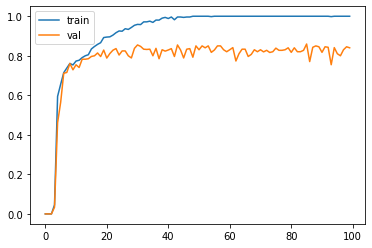

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.561798).  Saving model ...
Validation acc increased (0.561798 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.736842).  Saving model ...
Validation acc increased (0.736842 --> 0.745455).  Saving model ...
Validation acc increased (0.745455 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.774775 --> 0.809524).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200


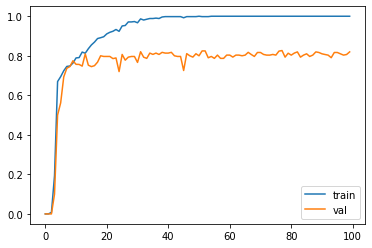

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.289855).  Saving model ...
Validation acc increased (0.289855 --> 0.590909).  Saving model ...
Validation acc increased (0.590909 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.732143).  Saving model ...
Validation acc increased (0.732143 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.750000 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.771930 --> 0.806723).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.806723 --> 0.816000).  Saving model ...
Earl

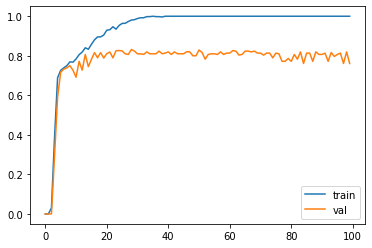

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.673469).  Saving model ...
Validation acc increased (0.673469 --> 0.829268).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc increased (0.829268 --> 0.833333).  Saving model ...
Validation acc increased (0.833333 --> 0.836364).  Saving model ...
Validation acc increased (0.836364 --> 0.849558).  Saving model ...
Validation acc increa

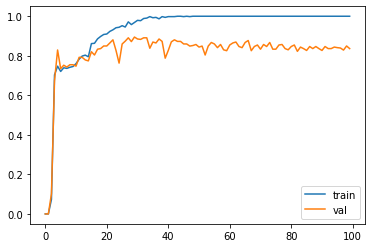

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.405405).  Saving model ...
Validation acc increased (0.405405 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.720721).  Saving model ...
Validation acc increased (0.720721 --> 0.758621).  Saving model ...
Validation acc increased (0.758621 --> 0.766667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.766667 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.777778 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.788991 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200


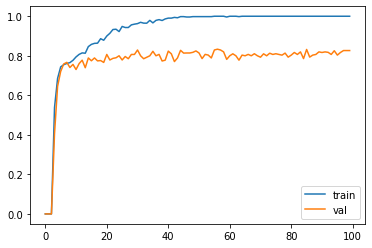

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.405405).  Saving model ...
Validation acc increased (0.405405 --> 0.590909).  Saving model ...
Validation acc increased (0.590909 --> 0.622222).  Saving model ...
Validation acc increased (0.622222 --> 0.786885).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.786885 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.800000 --> 0.827586).  Saving model ...
Validation acc increased (0.827586 --> 0.829268).  Saving model 

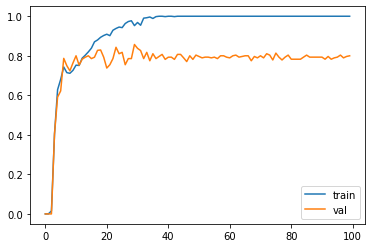

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.447368).  Saving model ...
Validation acc increased (0.447368 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.735043 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.752294 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.758621 --> 0.761062).  Saving model ...
Validation acc increased (0.761062 --> 0.761062).  Saving model 

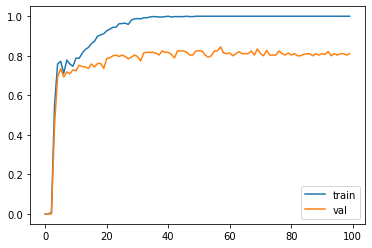

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.272727).  Saving model ...
Validation acc increased (0.272727 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.686275).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.686275 --> 0.701031).  Saving model ...
Validation acc increased (0.701031 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.732673).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.732673 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

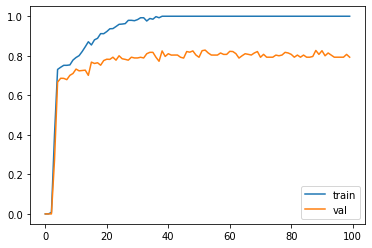

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.488372).  Saving model ...
Validation acc increased (0.488372 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.738739 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752137 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752294 --> 0.752294).  Saving model ...
Validation acc increased (0.752294 --> 0.786885).  Saving model ...
Validation acc increased (0.

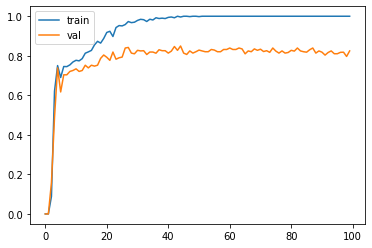

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.388889).  Saving model ...
Validation acc increased (0.388889 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.743363 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.747664 --> 0.767857).  Savin

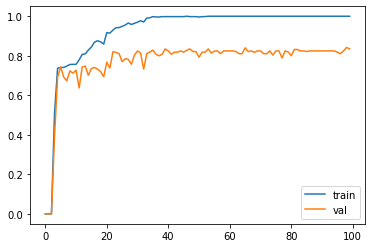

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.666667).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.666667 --> 0.696429).  Saving model ...
Validation acc increased (0.696429 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.704762).  Saving model ...
Validation acc increased (0.704762 --> 0.739496).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.739496 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.747826 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


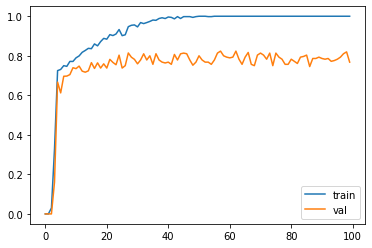

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.222222).  Saving model ...
Validation acc increased (0.222222 --> 0.699029).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.699029 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.766667).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.766667 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.771930 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.774775 --> 0.777778).  Saving model ...
Validation acc increased (0.777778 --> 0.785047).  Saving model ...
Validation acc increased (0.785047 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
Vali

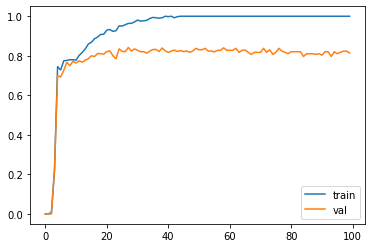

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.212121).  Saving model ...
Validation acc increased (0.212121 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.725664 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.725664 --> 0.747664).  Saving model ...
Validation acc increased (0.747664 --> 0.766355).  Saving model ...
Validation acc increase

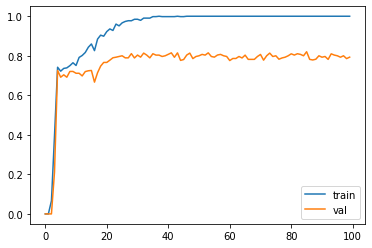

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.156250).  Saving model ...
Validation acc increased (0.156250 --> 0.560976).  Saving model ...
Validation acc increased (0.560976 --> 0.673684).  Saving model ...
Validation acc increased (0.673684 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.745455).  Saving model ...
Validation acc increased (0.745455 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.756757 --> 0.786885).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.786885 --> 0.803571).  Saving model ...


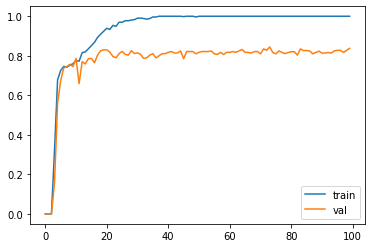

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.525000).  Saving model ...
Validation acc increased (0.525000 --> 0.629213).  Saving model ...
Validation acc increased (0.629213 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.771930 --> 0.773585).  Saving model ...
Validation acc increased (0.773585 --> 0.777778).  Saving model ...
Validation acc increased (0.777778 --> 0.792453).  Saving model ...
Validation acc increased (0.792453 --> 0

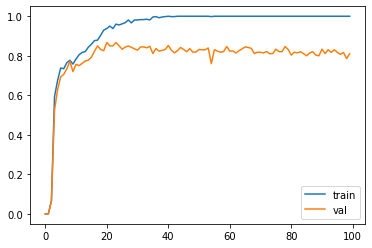

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.068966).  Saving model ...
Validation acc increased (0.068966 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.783333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.783333 --> 0.803738).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.8037

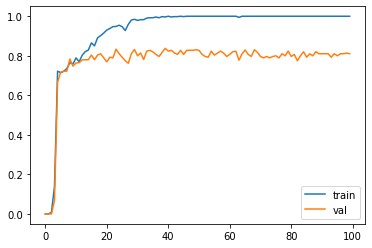

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.068966).  Saving model ...
Validation acc increased (0.068966 --> 0.473684).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.473684 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.777778 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.777778 --> 0.785047).  Saving model ...
Validation acc increased (0.785047 --> 0.803419).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.803419 --> 0.803571).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

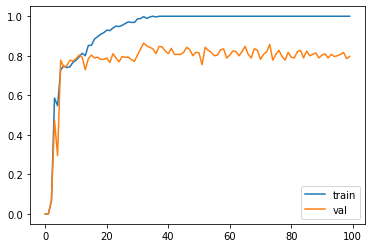

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.604651).  Saving model ...
Validation acc increased (0.604651 --> 0.629213).  Saving model ...
Validation acc increased (0.629213 --> 0.688172).  Saving model ...
Validation acc increased (0.688172 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.742857 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747664 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.761905 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.800000 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.800000 -

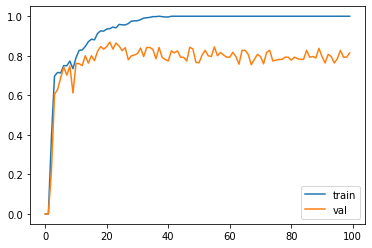

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.467532).  Saving model ...
Validation acc increased (0.467532 --> 0.625000).  Saving model ...
Validation acc increased (0.625000 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.698113).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.698113 --> 0.698113).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.698113 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.729167).  Saving model ...
Validation acc increased (0.729167 --> 0.737864).  Saving model ...
Earl

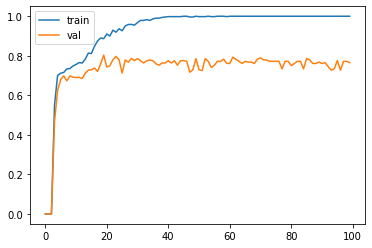

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.700000).  Saving model ...
Validation acc increased (0.700000 --> 0.700000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.700000 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.723810).  Saving model ...
Validation acc increased (0.723810 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.761905 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.766355 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200


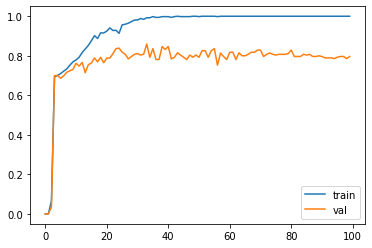

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.264706).  Saving model ...
Validation acc increased (0.264706 --> 0.588235).  Saving model ...
Validation acc increased (0.588235 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.761062 --> 0.767857).  Saving model ...
Validation acc increased (0.767857 --> 0.803419).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.803419 --> 0.807339).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

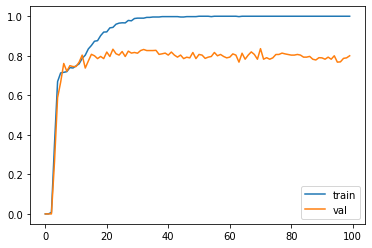

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.536585).  Saving model ...
Validation acc increased (0.536585 --> 0.600000).  Saving model ...
Validation acc increased (0.600000 --> 0.716981).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.716981 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.743363 --> 0.754717).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.754717 --> 0.764706).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.764706 --> 0.773109).  Saving model ...
Validation acc increased (0.773109 -

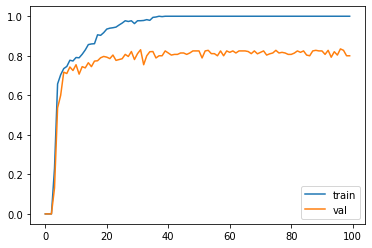

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.699029).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.699029 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.733945 --> 0.741379).  Saving model ...
Validation acc increased (0.741379 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.750000 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.769231 --> 0.773109).  Saving model ...
Validation acc increased (0.

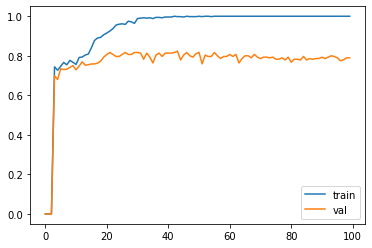

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.530120).  Saving model ...
Validation acc increased (0.530120 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.752294 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.769231 --> 0.793388).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7

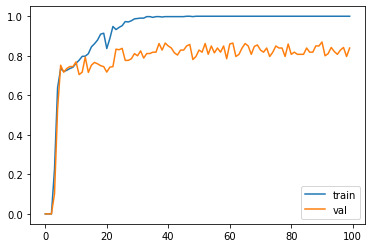

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.549451).  Saving model ...
Validation acc increased (0.549451 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.740741 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.761062 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.800000 --> 0.810811).  Savin

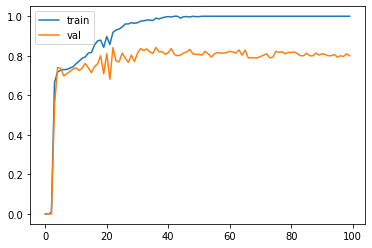

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.602151).  Saving model ...
Validation acc increased (0.602151 --> 0.604167).  Saving model ...
Validation acc increased (0.604167 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.691589).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.691589 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.715596 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.769231 --> 0.785714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Earl

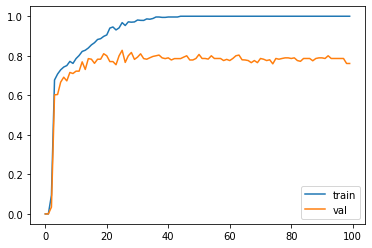

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.068966).  Saving model ...
Validation acc increased (0.068966 --> 0.687500).  Saving model ...
Validation acc increased (0.687500 --> 0.694737).  Saving model ...
Validation acc increased (0.694737 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.766355 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.777778 --> 0.785047).  Saving model ...
EarlyStopping counter: 1 out of 200


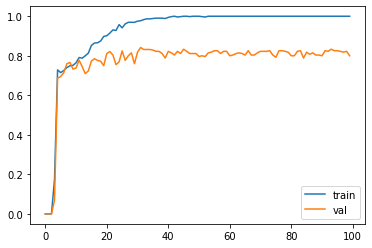

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.722222 --> 0.724138).  Saving model ...
Validation acc increased (0.724138 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.743363 --> 0.763636).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.763636 --> 0.765217).  Saving model ...
Validation acc increased (0.765217 --> 0.767857).  Saving model ...
Validation acc increased (0.767857 -

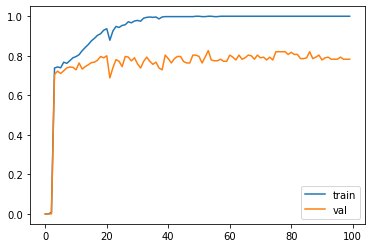

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.298507).  Saving model ...
Validation acc increased (0.298507 --> 0.659794).  Saving model ...
Validation acc increased (0.659794 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.720721 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.756757 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.761062 -

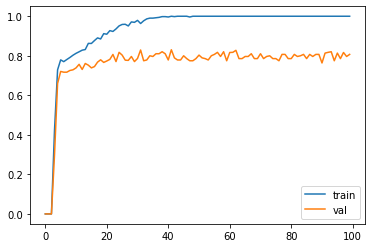

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.593407).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.593407 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.714286 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.765217 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200


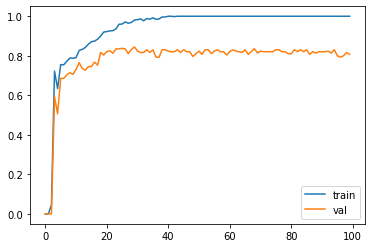

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.715596 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.760331).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.760331 --> 0.780952).  Saving model ...
Validation acc increased (0.780952 --> 0.816000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out

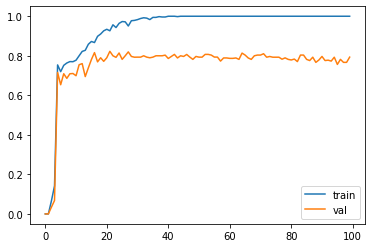

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.736842 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.741379 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counte

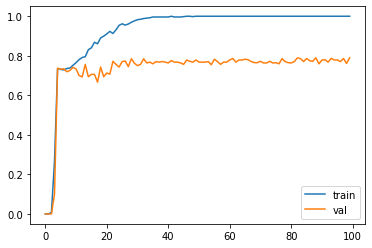

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.561798).  Saving model ...
Validation acc increased (0.561798 --> 0.625000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.625000 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.714286 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745455 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745455 --> 0.786325).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

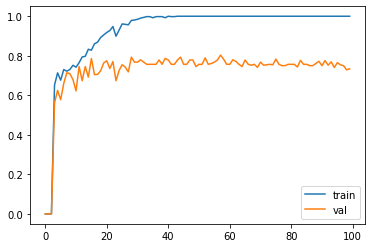

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.555556).  Saving model ...
Validation acc increased (0.555556 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.697248 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.697248 --> 0.702703).  Saving model ...
Validation acc increased (0.702703 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.714286 --> 0.745763).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745763 -

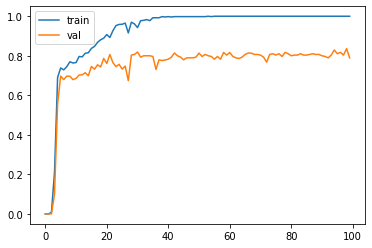

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.289855).  Saving model ...
Validation acc increased (0.289855 --> 0.547619).  Saving model ...
Validation acc increased (0.547619 --> 0.672566).  Saving model ...
Validation acc increased (0.672566 --> 0.673077).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.673077 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.697248 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752294 --> 0.803419).  Saving model ...
Validation acc increased (0.8034

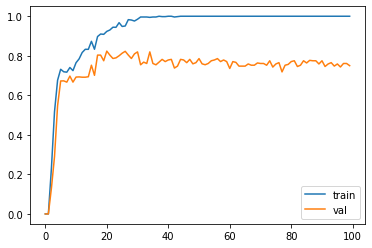

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.595238).  Saving model ...
Validation acc increased (0.595238 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.737864).  Saving model ...
Validation acc increased (0.737864 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.766355).  Saving model ...
Validation acc increased (0.766355 --> 0.774775).  Saving model ...
Validation acc increased (0.774775 --> 0.781818).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.781818 -

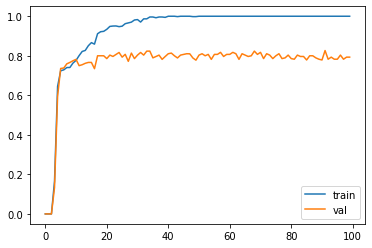

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.536585).  Saving model ...
Validation acc increased (0.536585 --> 0.763636).  Saving model ...
Validation acc increased (0.763636 --> 0.770642).  Saving model ...
Validation acc increased (0.770642 --> 0.785714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.785714 --> 0.788462).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.788462 --> 0.788462).  Saving model ...
Validation acc increased (0.788462 --> 0.788462).  Saving model ...


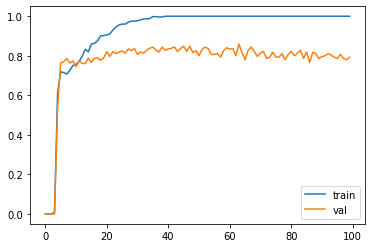

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.632653).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.632653 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.710280 --> 0.711538).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.711538 --> 0.716981).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.716981 --> 0.716981).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.716981 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733945 --> 0.793103).  Saving model 

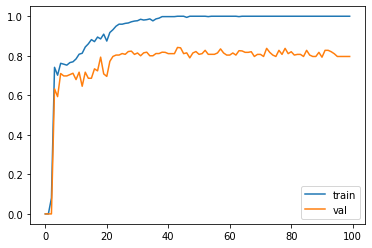

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.461538).  Saving model ...
Validation acc increased (0.461538 --> 0.595745).  Saving model ...
Validation acc increased (0.595745 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.702703 --> 0.702703).  Saving model ...
Validation acc increased (0.702703 --> 0.706897).  Saving model ...
Validation acc increased (0.706897 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.728814).  Saving model ...
Validation acc increased (0.728814 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Earl

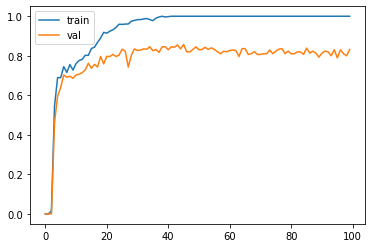

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.450000).  Saving model ...
Validation acc increased (0.450000 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.727273 --> 0.737864).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.737864 --> 0.755102).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.755102 --> 0.825688).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

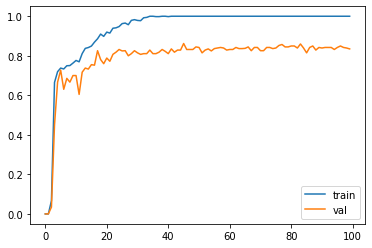

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.405405).  Saving model ...
Validation acc increased (0.405405 --> 0.652632).  Saving model ...
Validation acc increased (0.652632 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747826 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.756757 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5

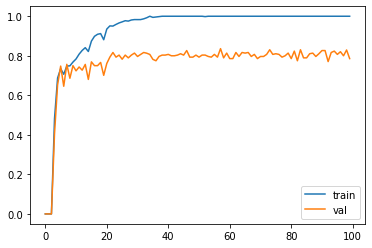

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.518519).  Saving model ...
Validation acc increased (0.518519 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.747826).  Saving model ...
Validation acc increased (0.747826 --> 0.756757).  Saving model ...
Validation acc increased (0.756757 --> 0.796610).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.796610 --> 0.826446).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


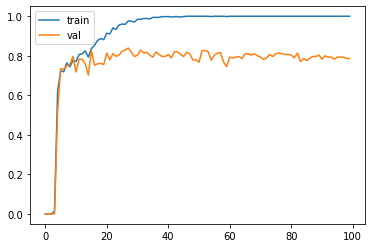

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.673469).  Saving model ...
Validation acc increased (0.673469 --> 0.673469).  Saving model ...
Validation acc increased (0.673469 --> 0.691589).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.691589 --> 0.704762).  Saving model ...
Validation acc increased (0.704762 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.728972 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.769231 --> 0.810345).  Saving model ...


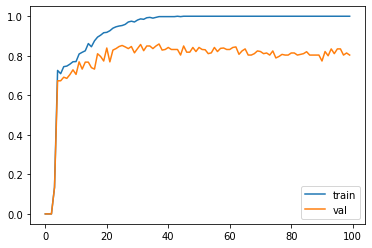

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.580645).  Saving model ...
Validation acc increased (0.580645 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.710280 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.720721 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased

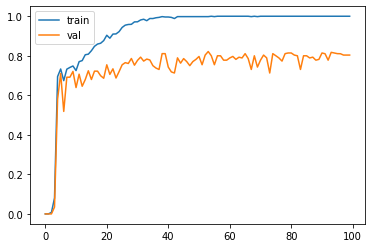

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.536585).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.536585 --> 0.673684).  Saving model ...
Validation acc increased (0.673684 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.773109 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.779661 --> 0.845528).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4

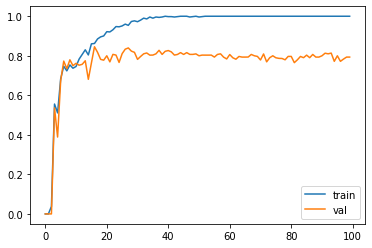

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.652632).  Saving model ...
Validation acc increased (0.652632 --> 0.693878).  Saving model ...
Validation acc increased (0.693878 --> 0.792793).  Saving model ...
Validation acc increased (0.792793 --> 0.803571).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.803571 --> 0.807018).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.807018 --> 0.820513).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.820513 --> 0.825688).  Saving model ...


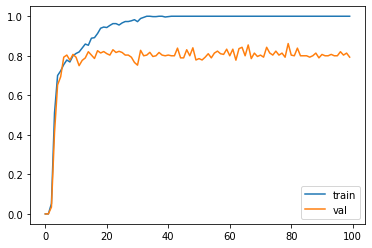

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.238806).  Saving model ...
Validation acc increased (0.238806 --> 0.653465).  Saving model ...
Validation acc increased (0.653465 --> 0.745763).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.745763 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.769231 --> 0.806723).  Saving model ...
Validation acc increased (0.806723 --> 0.813559).  Saving model ...
EarlyStopping counter:

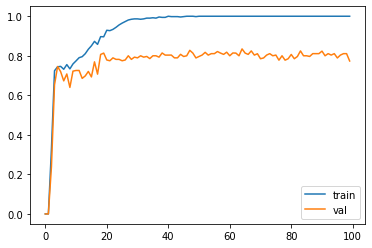

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.487179).  Saving model ...
Validation acc increased (0.487179 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.767857 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.771930 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.800000 --> 0.803279).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

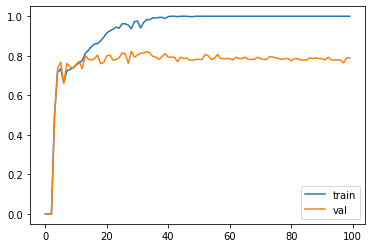

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.432432).  Saving model ...
Validation acc increased (0.432432 --> 0.447368).  Saving model ...
Validation acc increased (0.447368 --> 0.622222).  Saving model ...
Validation acc increased (0.622222 --> 0.736842).  Saving model ...
Validation acc increased (0.736842 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.756757).  Saving model ...
Validation acc increased (0.756757 --> 0.769231).  Saving model ...
Validation acc increased (0.769231 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.771930 --> 0.788991).  Saving model ...
Validation acc increased (0.788991 --> 0.800000).  Saving model ...
EarlyStoppin

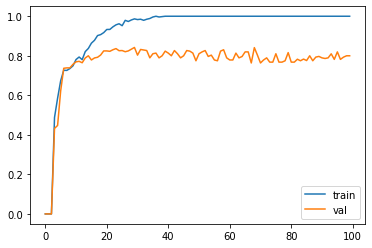

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.741379 --> 0.741379).  Saving model ...
Validation acc increased (0.741379 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.745455 --> 0.764706).  Saving model ...
Validation acc increased (0.764706 --> 0.803419).  Saving model ...
EarlyStopping counter: 1 out

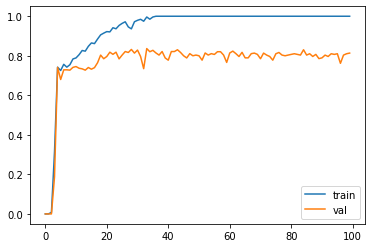

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.723810 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.740741 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.761062 --> 0.785714).  Saving model ...
Validation acc increased (0.785714 --> 0.792793).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.792793 --> 0.807018).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out

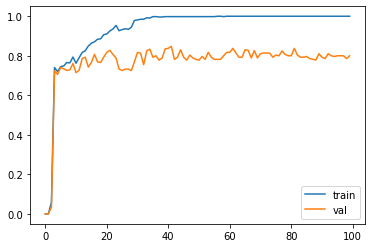

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.736842 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.745455 --> 0.757282).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.757282 --> 0.780952).  Saving mo

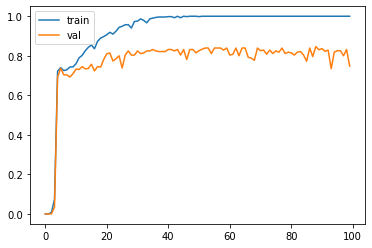

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.715596 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.762712 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

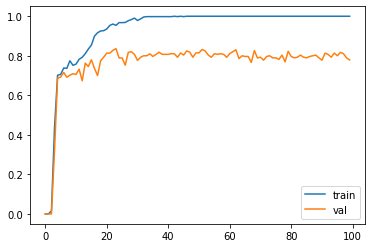

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.735849 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.745455 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.773585 --> 0.788991).  Saving model ...
Validation acc increased (0.788991 --> 0.792793).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

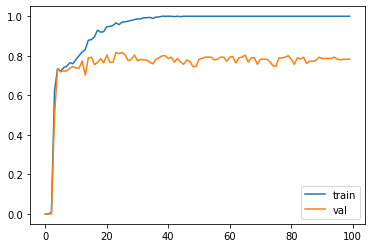

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.788991 --> 0.788991).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.788991 --> 0.800000).  Saving model ...
Validation acc increased (0.800000 --> 0.814815).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.814815 --> 0.821429).  Saving model ...
Validation acc increased (0.821429 --> 0.822430).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.822430 --> 0.827586).  Saving model ...
EarlyStopping counter: 1 out of 

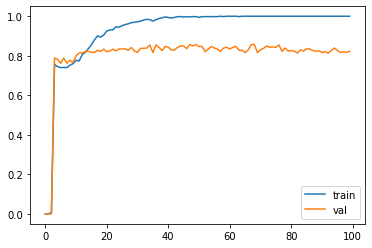

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.627907).  Saving model ...
Validation acc increased (0.627907 --> 0.720000).  Saving model ...
Validation acc increased (0.720000 --> 0.807018).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.807018 --> 0.823529).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.823529 --> 0.834783).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

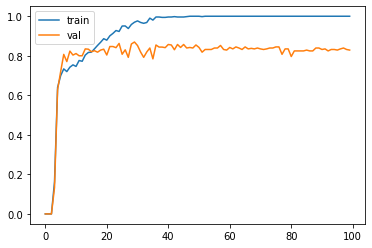

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.547619).  Saving model ...
Validation acc increased (0.547619 --> 0.625000).  Saving model ...
Validation acc increased (0.625000 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.752294).  Saving model ...
Validation acc increased (0.752294 --> 0.752294).  Saving model ...
Validation acc increased (0.752294 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.756757 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.767857 --> 0.819672).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200


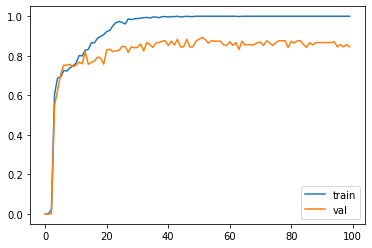

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.268657).  Saving model ...
Validation acc increased (0.268657 --> 0.653061).  Saving model ...
Validation acc increased (0.653061 --> 0.803279).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.803279 --> 0.810345).  Saving model ...
Validation acc increased (0.810345 --> 0.823529).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.823529 --> 0.827586).  Saving model ...
Validation acc increased (0.827586 --> 0.842975).  Saving model 

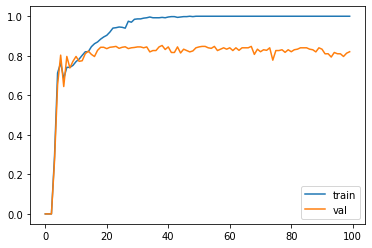

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.593407).  Saving model ...
Validation acc increased (0.593407 --> 0.700000).  Saving model ...
Validation acc increased (0.700000 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.750000 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.773109 --> 0.780000).  Saving model ...
Validation acc increased (0.780000 --> 0.782609).  Saving model ...
Validation acc increased (0.782609 --> 0.825688).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200


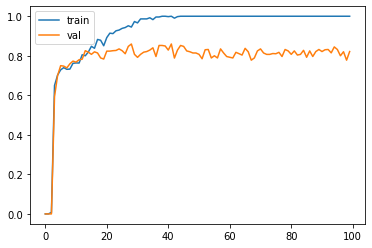

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.732673).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732673 --> 0.737864).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.737864 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.769231 --> 0.769231).  Saving model ...
Validation acc increased (0.769231 --> 0.784314).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.784314 --> 0.785047).  Saving model ...
Validation acc increased (0.785047 --> 0.807692).  Saving model ...
EarlyStopping counter: 1 out of 

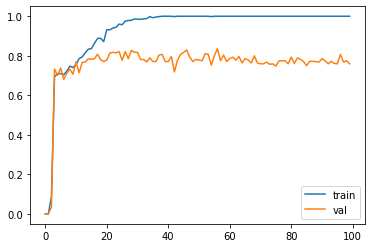

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.426667).  Saving model ...
Validation acc increased (0.426667 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.679612).  Saving model ...
Validation acc increased (0.679612 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.747826 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.765217 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.765217 --> 0.777778).  Saving model ...
Validation acc increased (0.7777

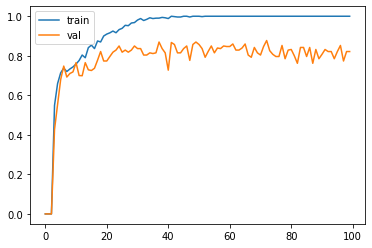

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.289855).  Saving model ...
Validation acc increased (0.289855 --> 0.589474).  Saving model ...
Validation acc increased (0.589474 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.736842 --> 0.745455).  Saving model ...
Validation acc increased (0.745455 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.758621 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

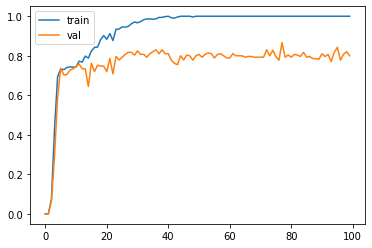

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.758621 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.769231 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.773585 --> 0.785047).  Saving model ...
Validation acc increased (0.785047 --> 0.785047).  Saving model ...
Validation acc increased (0.

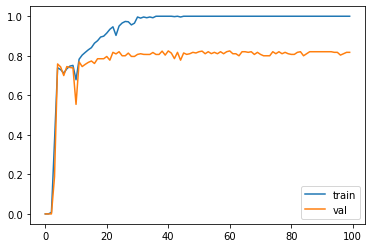

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.467532).  Saving model ...
Validation acc increased (0.467532 --> 0.615385).  Saving model ...
Validation acc increased (0.615385 --> 0.723810).  Saving model ...
Validation acc increased (0.723810 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752294 --> 0.783333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.783333 --> 0.786325).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.786325 --> 0.793103).  Saving model ...
EarlyStopping counter: 1 out of 200


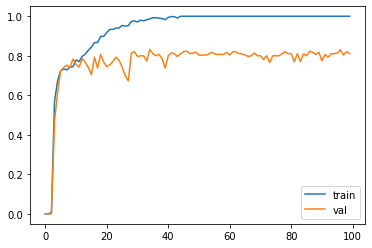

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.493827).  Saving model ...
Validation acc increased (0.493827 --> 0.551724).  Saving model ...
Validation acc increased (0.551724 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.672897).  Saving model ...
Validation acc increased (0.672897 --> 0.717949).  Saving model ...
Validation acc increased (0.717949 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.725664 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.728972 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.754386 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
Vali

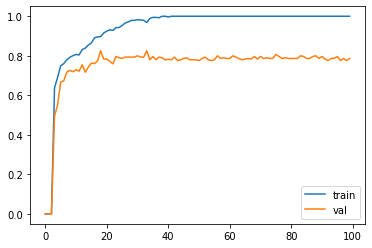

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.190476).  Saving model ...
Validation acc increased (0.190476 --> 0.620690).  Saving model ...
Validation acc increased (0.620690 --> 0.712871).  Saving model ...
Validation acc increased (0.712871 --> 0.718447).  Saving model ...
Validation acc increased (0.718447 --> 0.718447).  Saving model ...
Validation acc increased (0.718447 --> 0.718447).  Saving model ...
Validation acc increased (0.718447 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.765217 --> 0.773585).  Saving model ...
Validation acc increased (0.773585 --> 0.779661).  Saving model ...
EarlySto

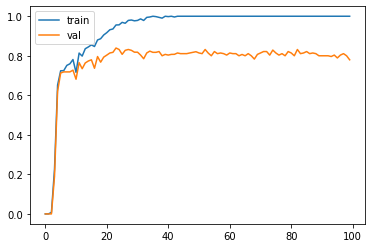

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.625000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.625000 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.707965 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.738739 --> 0.793103).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.7931

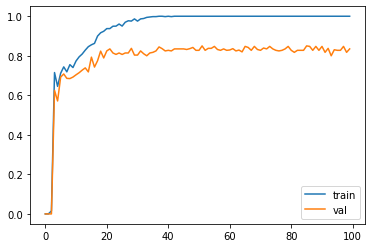

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.432432).  Saving model ...
Validation acc increased (0.432432 --> 0.574713).  Saving model ...
Validation acc increased (0.574713 --> 0.595745).  Saving model ...
Validation acc increased (0.595745 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.710280 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200


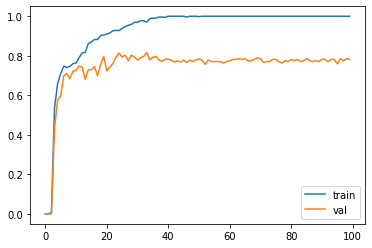

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.156250).  Saving model ...
Validation acc increased (0.156250 --> 0.577778).  Saving model ...
Validation acc increased (0.577778 --> 0.696429).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.696429 --> 0.715447).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.715447 --> 0.725806).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.725806 --> 0.730435).  Saving model ...
Validation acc increased (0.730435 --> 0.758065).  Saving model ...


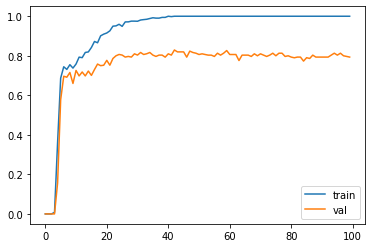

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.588235).  Saving model ...
Validation acc increased (0.588235 --> 0.725490).  Saving model ...
Validation acc increased (0.725490 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.763636).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.763636 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.773585 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.777778 --> 0.793103).  Saving model ...
EarlyStopping counter: 1 out of 200


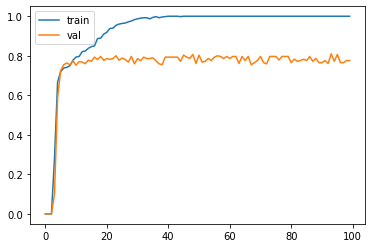

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.394366).  Saving model ...
Validation acc increased (0.394366 --> 0.644444).  Saving model ...
Validation acc increased (0.644444 --> 0.702128).  Saving model ...
Validation acc increased (0.702128 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.767857 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.800000 --> 0.810811).  Saving model ...
Validation acc increased (0.810811 --> 0

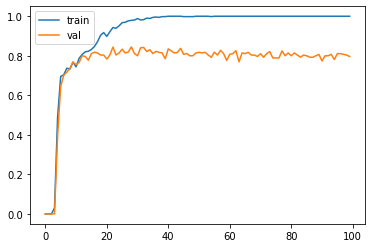

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733945 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.779661 --> 0.789916).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.789916 --> 0.803279).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.803279 --> 0.824561).  Saving model ...
Validation acc increased (0.8245

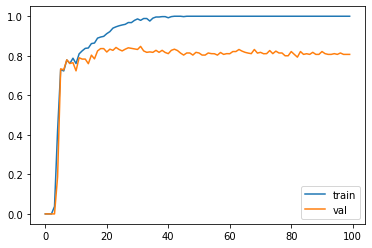

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.602151).  Saving model ...
Validation acc increased (0.602151 --> 0.602151).  Saving model ...
Validation acc increased (0.602151 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.690909 --> 0.698113).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.698113 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.713043).  Saving model ...
Validation acc increased (0.713043 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.741379).  Saving model ...
Validation acc increased (0.741379 --> 0

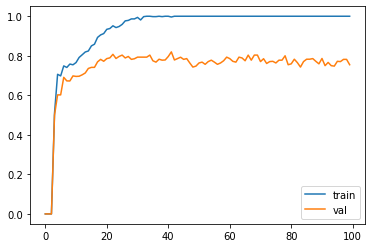

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.215385).  Saving model ...
Validation acc increased (0.215385 --> 0.545455).  Saving model ...
Validation acc increased (0.545455 --> 0.606061).  Saving model ...
Validation acc increased (0.606061 --> 0.660377).  Saving model ...
Validation acc increased (0.660377 --> 0.690909).  Saving model ...
Validation acc increased (0.690909 --> 0.690909).  Saving model ...
Validation acc increased (0.690909 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.690909 --> 0.717949).  Saving model ...
Validation acc increased (0.717949 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validati

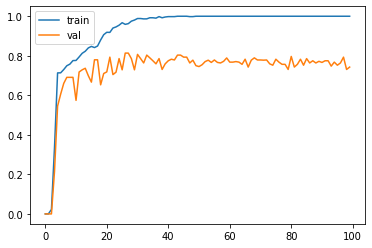

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.505747).  Saving model ...
Validation acc increased (0.505747 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.625000).  Saving model ...
Validation acc increased (0.625000 --> 0.680851).  Saving model ...
Validation acc increased (0.680851 --> 0.692308).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.692308 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.735043 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.783333).  Saving model ...
EarlySto

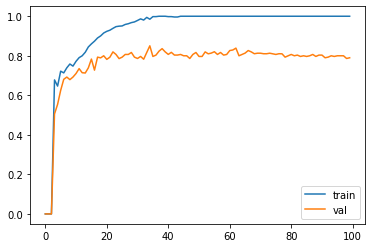

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.289855).  Saving model ...
Validation acc increased (0.289855 --> 0.699029).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.699029 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 --> 0.754386).  Saving model ...
Validation acc increased (0.754386 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.754386 --> 0.782609).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.782609 --> 0.788462).  Saving model ...
Validation acc increased (0.788462 --> 0

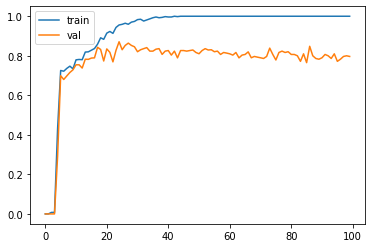

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.543210).  Saving model ...
Validation acc increased (0.543210 --> 0.615385).  Saving model ...
Validation acc increased (0.615385 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.761062 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.777778 --> 0.780488).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.780488 --> 0.783333).  Saving model ...
Validation acc increased (0.783333 --> 0.793388).  Saving model ...
Validation acc increased (0.7933

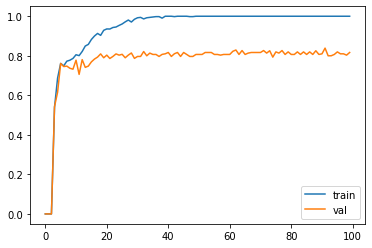

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.632653).  Saving model ...
Validation acc increased (0.632653 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.745763).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745763 --> 0.761062).  Saving model ...
Validation acc increased (0.761062 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.767857 --> 0.776699).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.776699 --> 0.782609).  Saving model ...
EarlySto

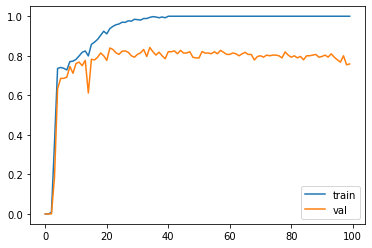

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.473684).  Saving model ...
Validation acc increased (0.473684 --> 0.758621).  Saving model ...
Validation acc increased (0.758621 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.761062 --> 0.786885).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.786885 --> 0.793388).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.793388 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.800000 --> 0.813559).  Saving model ...
Validation acc increased (0.813559 -

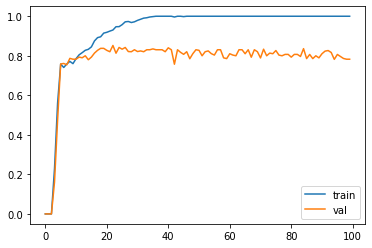

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.762712 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.770642 --> 0.803279).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.803279 --> 0.826446).  Saving model ...
EarlyStopping counter: 1 out

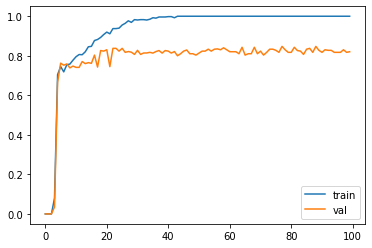

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.314286).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.314286 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.685714).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.685714 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.719298).  Saving model ...
Validation acc increased (0.719298 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.730435 --> 0.732143).  Saving model ...
Validation acc increased (0.732143 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752294 --> 0.785047).  Saving model ...
Earl

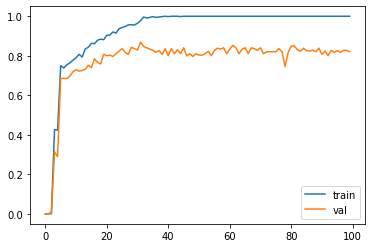

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.493827).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.493827 --> 0.686275).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.686275 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.728972 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.767857 --> 0.773109).  Saving model ...
Validation acc increased (0.773109 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


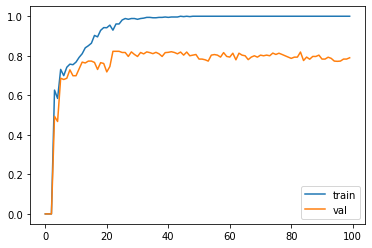

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.438356).  Saving model ...
Validation acc increased (0.438356 --> 0.707071).  Saving model ...
Validation acc increased (0.707071 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.756757).  Saving model ...
Validation acc increased (0.756757 --> 0.761062).  Saving model ...
Validation acc increased (0.761062 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.769231 --> 0.773585).  Saving model ...
Validation acc increased (0.773585 --> 0.789474).  Saving model ...
Validation acc increased (0.789474 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Earl

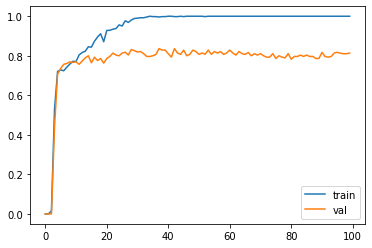

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.294118).  Saving model ...
Validation acc increased (0.294118 --> 0.530120).  Saving model ...
Validation acc increased (0.530120 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.703704 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.710280 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.720721 --> 0.728814).  Saving model ...
Validation acc increased (0.728814 --> 0.732673).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732673 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200


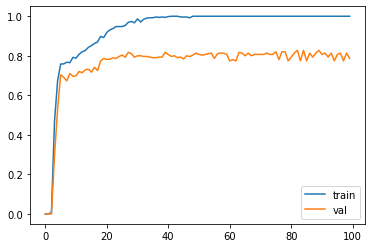

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.545455).  Saving model ...
Validation acc increased (0.545455 --> 0.685185).  Saving model ...
Validation acc increased (0.685185 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.703704 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.710280 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.738739 --> 0.752294).  Saving model ...
Validation acc increased (0.752294 --> 0

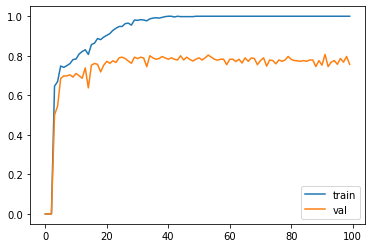

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.416667).  Saving model ...
Validation acc increased (0.416667 --> 0.606742).  Saving model ...
Validation acc increased (0.606742 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.716981).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.716981 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.747664).  Saving model ...
Validation acc increased (0.747664 --> 0.770642).  Saving model ...
Validation acc increased (0.770642 --> 0.785714).  Saving model ...
Vali

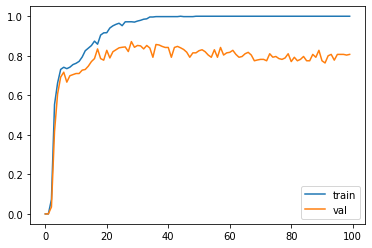

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.422535).  Saving model ...
Validation acc increased (0.422535 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.750000 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.761905 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counte

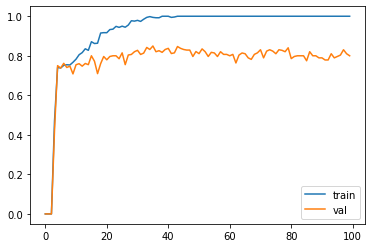

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.700000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.700000 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.747664 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.761062 --> 0.778761).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.778761 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.800000 --> 0.806723).  Saving model 

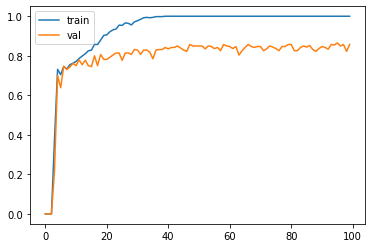

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.643678).  Saving model ...
Validation acc increased (0.643678 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.754386).  Saving model ...
Validation acc increased (0.754386 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.756757 --> 0.778761).  Saving model ...
Validation acc increased (0.778761 --> 0.778761).  Saving model ...
Validation acc increased (0.778761 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlySto

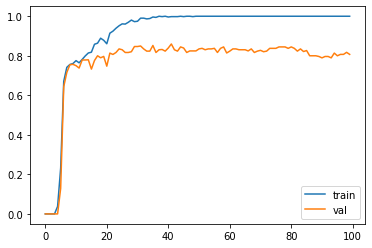

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.314286).  Saving model ...
Validation acc increased (0.314286 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.761062 --> 0.774775).  Saving model ...
Validation acc increased (0.774775 --> 0.782609).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.782609 --> 0.796296).  Saving model ...
Validation acc increased (0.796296 --> 0.796296).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.7962

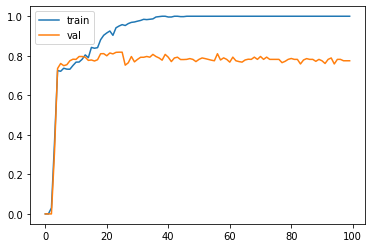

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.720721 --> 0.733333).  Saving model ...
Validation acc increased (0.733333 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.735043).  Saving model ...
Validation acc increased (0.735043 --> 0.745763).  Saving model ...
Validation acc increased (0.7457

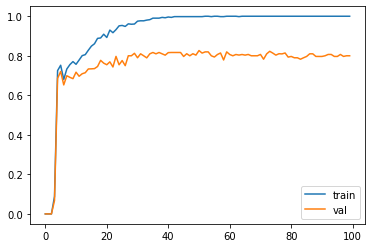

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.467532).  Saving model ...
Validation acc increased (0.467532 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.742857 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.754386 --> 0.754717).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.754717 --> 0.757282).  Saving model ...
Validation acc increased (0.757282 --> 0.760000).  Saving model ...
Validation acc increased (0.760000 --> 0.785714).  Saving model 

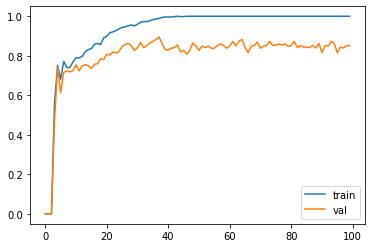

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.600000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.600000 --> 0.700000).  Saving model ...
Validation acc increased (0.700000 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.765217 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.770642 --> 0.774775).  Saving model ...
Validation acc increased (0.774775 --> 0.800000).  Saving model ...
Validation acc increased (0.

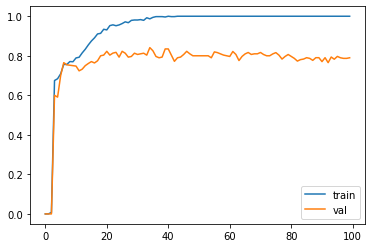

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.506329).  Saving model ...
Validation acc increased (0.506329 --> 0.631579).  Saving model ...
Validation acc increased (0.631579 --> 0.638298).  Saving model ...
Validation acc increased (0.638298 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.738739 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased

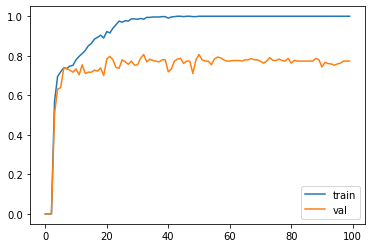

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.593407).  Saving model ...
Validation acc increased (0.593407 --> 0.696429).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.696429 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.702703 --> 0.709091).  Saving model ...
Validation acc increased (0.709091 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.723810).  Saving model ...
Validation acc increased (0.723810 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.761062 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
Earl

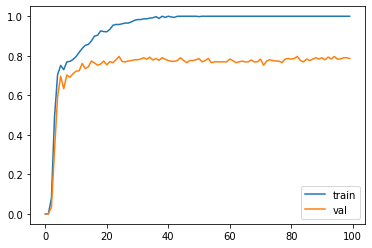

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.720000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.720000 --> 0.803419).  Saving model ...
Validation acc increased (0.803419 --> 0.803419).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.803419 --> 0.816000).  Saving model ...
Validation acc increased (0.816000 --> 0.823529).  Saving model ...
Validation acc increased (0.823529 --> 0.849558).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 

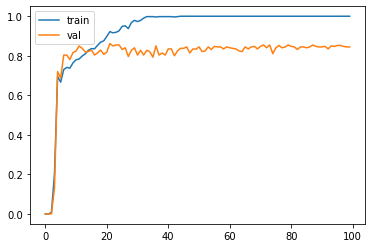

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.366197).  Saving model ...
Validation acc increased (0.366197 --> 0.793388).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.793388 --> 0.803279).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.803279 --> 0.810811).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.810811 --> 0.821429).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased

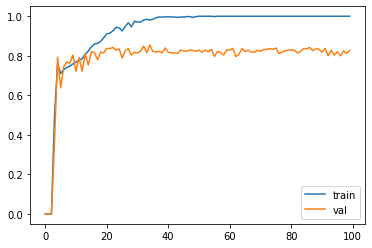

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.602151).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.602151 --> 0.673469).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.673469 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.715596 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.715596 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.

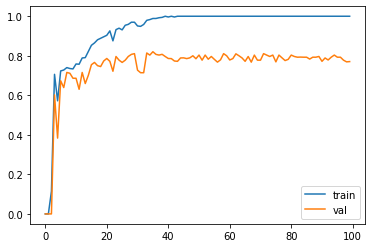

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.640000).  Saving model ...
Validation acc increased (0.640000 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.730435 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.747664).  Saving model ...
Validation acc increased (0.747664 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.

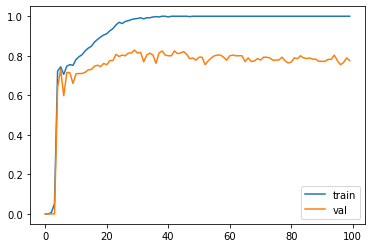

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.422535).  Saving model ...
Validation acc increased (0.422535 --> 0.597701).  Saving model ...
Validation acc increased (0.597701 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.769231 --> 0.781818).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.781818 --> 0.782609).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.782609 --> 0.807692).  Saving model ...
Validation acc increased (0.

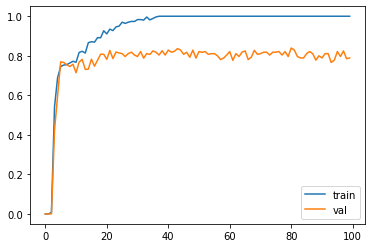

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.338028).  Saving model ...
Validation acc increased (0.338028 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.747826 --> 0.775862).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.775862 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


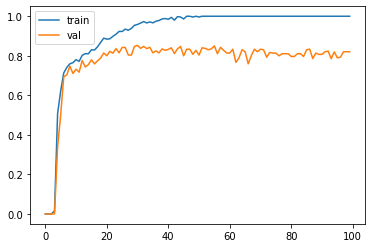

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.593407).  Saving model ...
Validation acc increased (0.593407 --> 0.659794).  Saving model ...
Validation acc increased (0.659794 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.725664 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.743363 --> 0.745763).  Saving model ...
Validation acc increased (0.745763 --> 0.756757).  Saving model ...
Validation acc increased (0.756757 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Earl

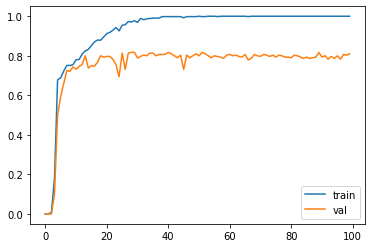

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.588235).  Saving model ...
Validation acc increased (0.588235 --> 0.704762).  Saving model ...
Validation acc increased (0.704762 --> 0.736842).  Saving model ...
Validation acc increased (0.736842 --> 0.743363).  Saving model ...
Validation acc increased (0.743363 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.754386 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.754386 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.779661 --> 0.809524).  Saving model ...
Earl

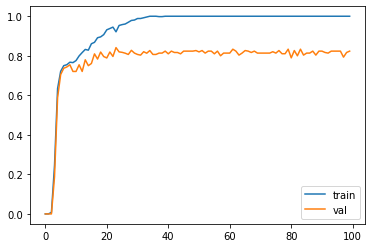

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.590909).  Saving model ...
Validation acc increased (0.590909 --> 0.819672).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc increased (0.819672 --> 0.825688).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.825688 --> 0.828829).  Saving model ...
Validation acc increased (0.828829 --> 0.836364).  Sa

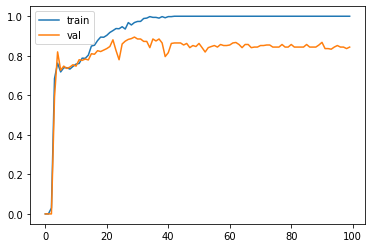

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.590909).  Saving model ...
Validation acc increased (0.590909 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.770492).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.770492 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.770642 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.774775 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.7747

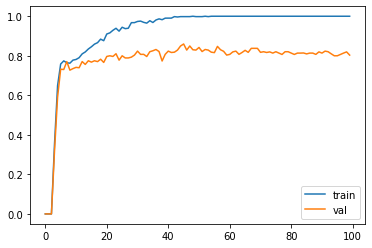

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.338028).  Saving model ...
Validation acc increased (0.338028 --> 0.590909).  Saving model ...
Validation acc increased (0.590909 --> 0.637363).  Saving model ...
Validation acc increased (0.637363 --> 0.786885).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.786885 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.789474 --> 0.792453).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.792453 --> 0.809917).  Saving model 

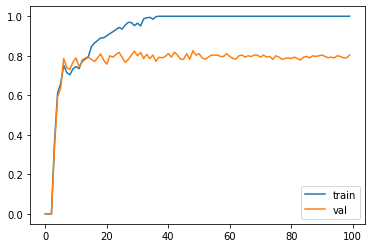

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.733333 --> 0.745763).  Saving model ...
Validation acc increased (0.745763 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.756757 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.758621 --> 0.771930).  Saving model 

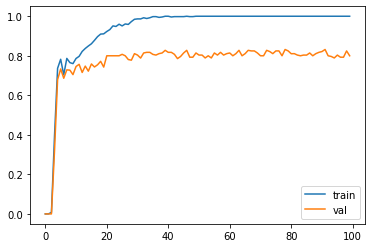

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.190476).  Saving model ...
Validation acc increased (0.190476 --> 0.659794).  Saving model ...
Validation acc increased (0.659794 --> 0.699029).  Saving model ...
Validation acc increased (0.699029 --> 0.704762).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.704762 --> 0.707071).  Saving model ...
Validation acc increased (0.707071 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.752475).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.752475 --> 0.756757).  Saving model ...
Validation acc increased (0.756757 --> 0.761062).  Saving model ...
Earl

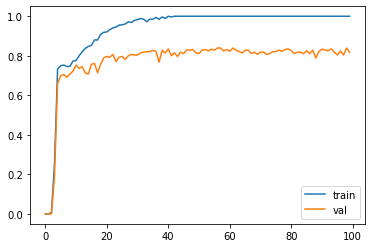

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.475000).  Saving model ...
Validation acc increased (0.475000 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.745455 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.767857 --> 0.786885).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc incre

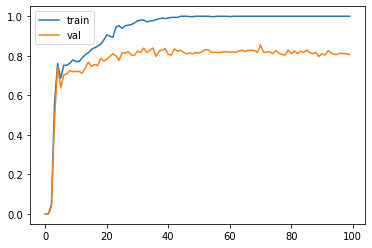

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.623656).  Saving model ...
Validation acc increased (0.623656 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.727273 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.728972 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 

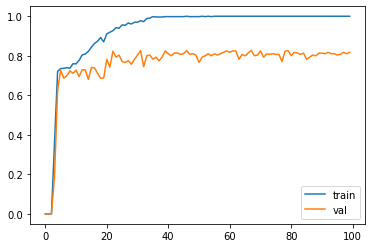

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.653846).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.653846 --> 0.696429).  Saving model ...
Validation acc increased (0.696429 --> 0.696429).  Saving model ...
Validation acc increased (0.696429 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.733333).  Saving model ...
Validation acc increased (0.733333 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.747826 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752137 -

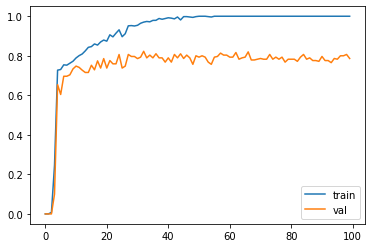

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.718447).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.718447 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.766667).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.766667 --> 0.782609).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.782609 --> 0.785047).  Saving model ...
Validation acc increased (0.785047 --> 0.785714).  Saving model ...
Validation acc increased (0.785714 --> 0.807339).  Saving model ...
EarlyStopping counter: 1 out of 200


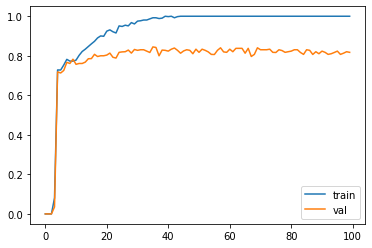

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.714286 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.715596 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.720721 --> 0.736842).  Saving model ...
Validation acc increased (0.736842 --> 0.745455).  Saving model ...
Validation acc increased (0.

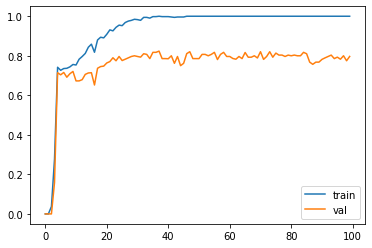

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.096774).  Saving model ...
Validation acc increased (0.096774 --> 0.543210).  Saving model ...
Validation acc increased (0.543210 --> 0.606742).  Saving model ...
Validation acc increased (0.606742 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.745455 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747826 --> 0.770492).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.770492 --> 0.788462).  Saving model ...
Validation acc increased (0.788462 --> 0.796460).  Saving model ...


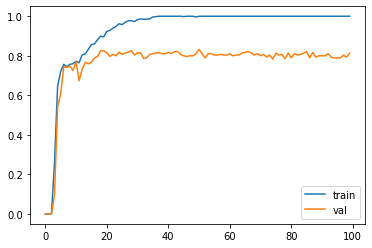

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.480000).  Saving model ...
Validation acc increased (0.480000 --> 0.578313).  Saving model ...
Validation acc increased (0.578313 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.733945).  Saving model ...
Validation acc increased (0.733945 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.771930 --> 0.777778).  Saving model ...
Validation acc increased (0.777778 --> 0.785047).  Saving model ...
Validation acc increased (0.785047 --> 0.810811).  Saving model ...
Vali

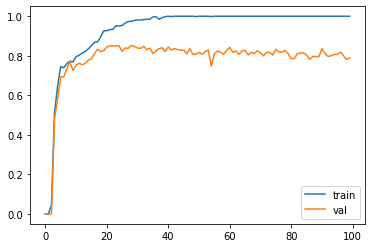

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.597701).  Saving model ...
Validation acc increased (0.597701 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.720721).  Saving model ...
Validation acc increased (0.720721 --> 0.770492).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.770492 --> 0.792079).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 

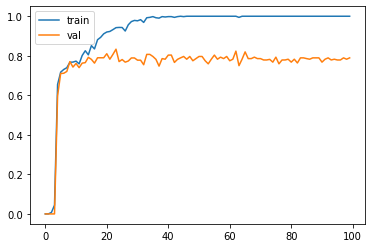

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.410959).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.410959 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.747664).  Saving model ...
Validation acc increased (0.747664 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.766355).  Saving model ...
Validation acc increased (0.766355 --> 0.786325).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200


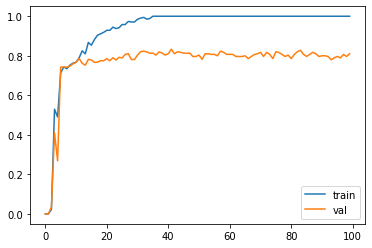

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.512821).  Saving model ...
Validation acc increased (0.512821 --> 0.620690).  Saving model ...
Validation acc increased (0.620690 --> 0.673913).  Saving model ...
Validation acc increased (0.673913 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.742857 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747664 --> 0.766355).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.766355 --> 0.780952).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.780952 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.800000 -

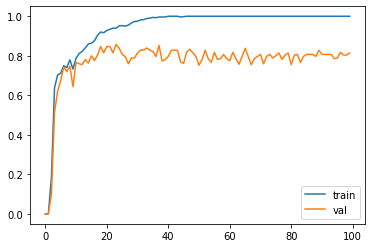

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.394366).  Saving model ...
Validation acc increased (0.394366 --> 0.586957).  Saving model ...
Validation acc increased (0.586957 --> 0.673077).  Saving model ...
Validation acc increased (0.673077 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.690909 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.690909 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.707965 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 -

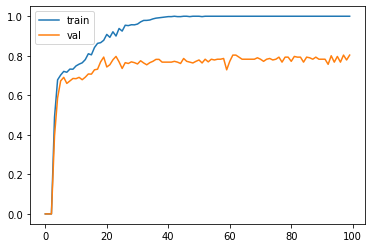

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.568182).  Saving model ...
Validation acc increased (0.568182 --> 0.686869).  Saving model ...
Validation acc increased (0.686869 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.704762).  Saving model ...
Validation acc increased (0.704762 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.728972 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.754386 --> 0.774775).  Saving model ...
Validation acc increased (0.774775 --> 0

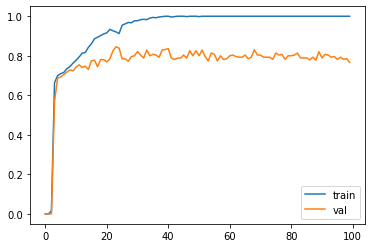

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.215385).  Saving model ...
Validation acc increased (0.215385 --> 0.560976).  Saving model ...
Validation acc increased (0.560976 --> 0.673684).  Saving model ...
Validation acc increased (0.673684 --> 0.761062).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.761062 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.767857 --> 0.773585).  Saving model ...
Validation acc increased (0.773585 --> 0.773585).  Saving model ...
Validation acc increased (0.773585 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200


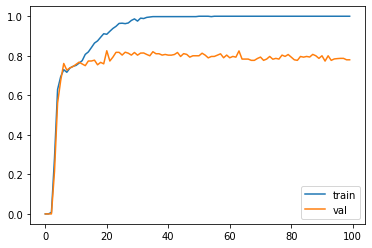

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.473684).  Saving model ...
Validation acc increased (0.473684 --> 0.581395).  Saving model ...
Validation acc increased (0.581395 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.720721 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.745455 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.750000 --> 0.769231).  Saving model ...
Vali

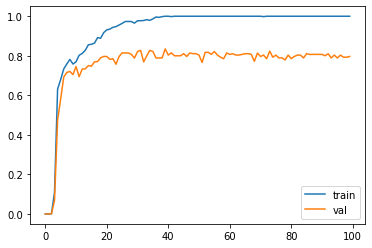

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.653061).  Saving model ...
Validation acc increased (0.653061 --> 0.673469).  Saving model ...
Validation acc increased (0.673469 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.747826 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.762712 --> 0.773109).  Saving model ...


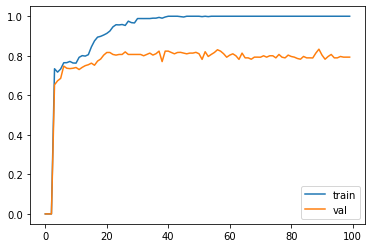

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.487179).  Saving model ...
Validation acc increased (0.487179 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.740741 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.741379 --> 0.776860).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7

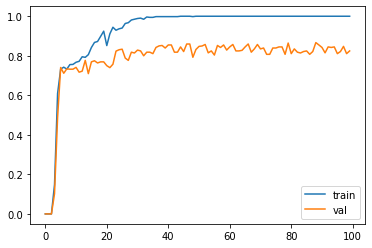

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.450000).  Saving model ...
Validation acc increased (0.450000 --> 0.728972).  Saving model ...
Validation acc increased (0.728972 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.747826 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.750000 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.750000 --> 0.763636).  Saving model ...
Validation acc increased (0.763636 --> 0.771930).  Saving model 

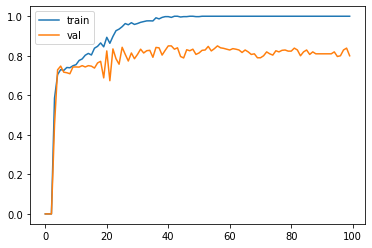

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.511628).  Saving model ...
Validation acc increased (0.511628 --> 0.631579).  Saving model ...
Validation acc increased (0.631579 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.703704 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.752137 --> 0.767857).  Saving model ...
Validation acc increased (0.767857 --> 0.789

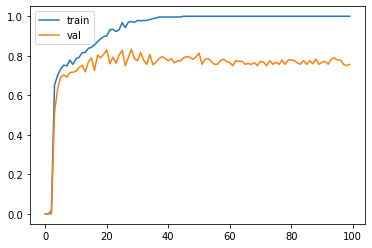

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.068966).  Saving model ...
Validation acc increased (0.068966 --> 0.694737).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.694737 --> 0.752294).  Saving model ...
Validation acc increased (0.752294 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.770642 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.777778 --> 0.784314).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

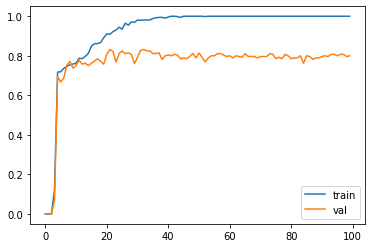

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.673469).  Saving model ...
Validation acc increased (0.673469 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.722222 --> 0.724138).  Saving model ...
Validation acc increased (0.724138 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.741379 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.754386 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.7796

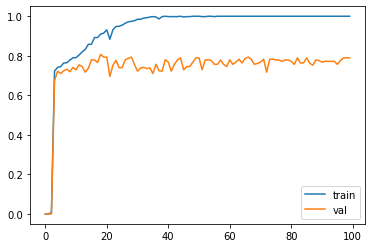

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.190476).  Saving model ...
Validation acc increased (0.190476 --> 0.571429).  Saving model ...
Validation acc increased (0.571429 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.720721 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.732143).  Saving model ...
Validation acc increased (0.732143 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.743363 --> 0.743363).  Saving model ...
Validation acc increased (0.743363 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.761905 -

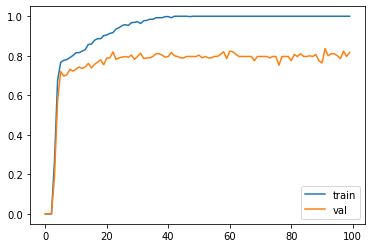

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.604651).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.604651 --> 0.680000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.680000 --> 0.709091).  Saving model ...
Validation acc increased (0.709091 --> 0.713043).  Saving model ...
Validation acc increased (0.713043 --> 0.718447).  Saving model ...
Validation acc increased (0.718447 --> 0.723810).  Saving model ...
Validation acc increased (0.723810 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.752137 --> 0.773585).  Saving model ...
Validation acc increased (0.773585 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
Vali

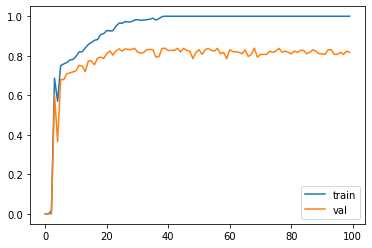

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.679245).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.679245 --> 0.696429).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.696429 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.702703 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.750000 --> 0.803279).  Saving model ...
EarlyStopping counter: 1 out of 200


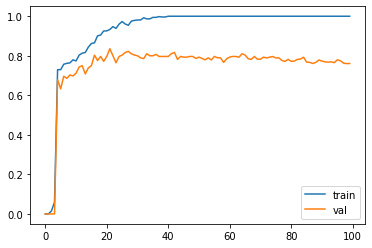

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.685714).  Saving model ...
Validation acc increased (0.685714 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.709091 --> 0.713043).  Saving model ...
Validation acc increased (0.713043 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.725664 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

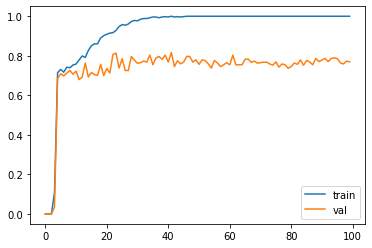

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.523810).  Saving model ...
Validation acc increased (0.523810 --> 0.593407).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.593407 --> 0.646465).  Saving model ...
Validation acc increased (0.646465 --> 0.707965).  Saving model ...
Validation acc increased (0.707965 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.714286 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.767857 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


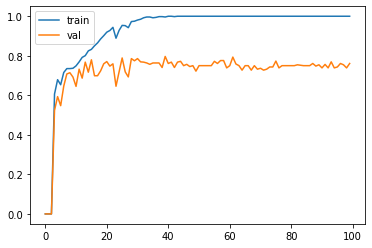

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.511628).  Saving model ...
Validation acc increased (0.511628 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.690909 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.707965 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.735043 --> 0.743363).  Saving model ...
Validation acc increased (0.743363 --> 0.765217).  Saving model 

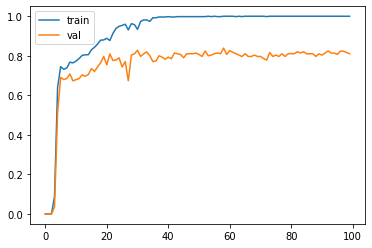

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.242424).  Saving model ...
Validation acc increased (0.242424 --> 0.547619).  Saving model ...
Validation acc increased (0.547619 --> 0.684211).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.684211 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.697248 --> 0.697248).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.697248 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.710280 --> 0.789916).  Saving model ...
EarlyStopping counter: 1 out of 

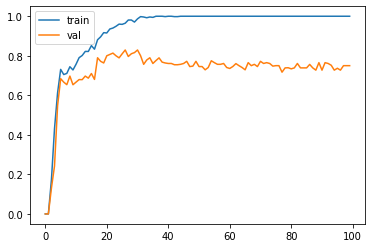

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.068966).  Saving model ...
Validation acc increased (0.068966 --> 0.588235).  Saving model ...
Validation acc increased (0.588235 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.752294 --> 0.759259).  Saving model ...
Validation acc increased (0.759259 --> 0.771930).  Saving model ...
Validation acc increased (0.771930 --> 0.774775).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.774775 --> 0.781818).  Saving model ...
Validation acc increased (0.7818

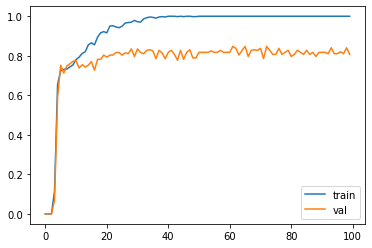

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.432432).  Saving model ...
Validation acc increased (0.432432 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.777778).  Saving model ...
Validation acc increased (0.777778 --> 0.785714).  Saving model ...
Validation acc increased (0.785714 --> 0.785714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.785714 --> 0.792453).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 

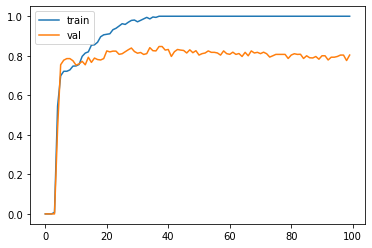

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.625000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.625000 --> 0.703704).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.703704 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.715596 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.722222 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out

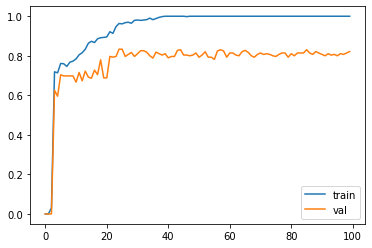

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.318841).  Saving model ...
Validation acc increased (0.318841 --> 0.608696).  Saving model ...
Validation acc increased (0.608696 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.690265).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.690265 --> 0.695652).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.695652 --> 0.706897).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.706897 --> 0.717949).  Saving model ...
Validation acc increased (0.717949 --> 0.737864).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.737864 --> 0.750000).  Saving model ...
Earl

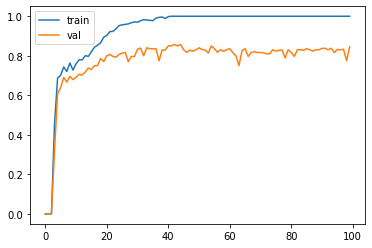

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.373333).  Saving model ...
Validation acc increased (0.373333 --> 0.625000).  Saving model ...
Validation acc increased (0.625000 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.747826 --> 0.757282).  Saving model ...
Validation acc increased (0.757282 --> 0.796296).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 

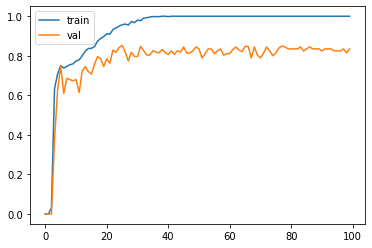

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.246154).  Saving model ...
Validation acc increased (0.246154 --> 0.506024).  Saving model ...
Validation acc increased (0.506024 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.754386 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.756303 --> 0.766667).  Saving model ...
Validation acc increased (0.766667 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out

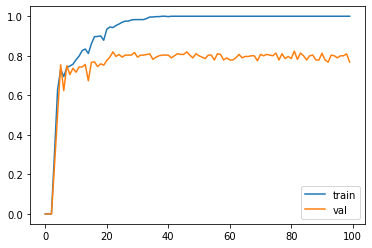

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.421053).  Saving model ...
Validation acc increased (0.421053 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733945 --> 0.741379).  Saving model ...
Validation acc increased (0.741379 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.769231 --> 0.771930).  Saving model ...
Validation acc increased (0.771930 --> 0.775862).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.775862 --> 0.813008).  Saving model ...
EarlyStopping counter: 1 out of 200
Earl

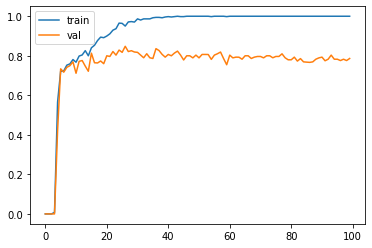

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.638298).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.638298 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.698113).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.698113 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.728972 --> 0.761062).  Saving model ...
Validation acc increased (0.761062 --> 0.761062).  Saving model ...
Validation acc increased (0.761062 --> 0.761905).  Saving model ...
Validation acc increased (0.761905 --> 0

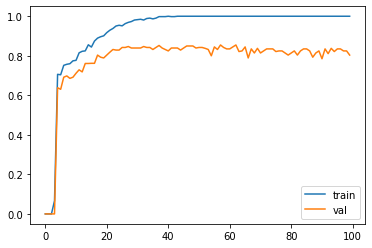

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.545455).  Saving model ...
Validation acc increased (0.545455 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.709091 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.730435 --> 0.756757).  Savin

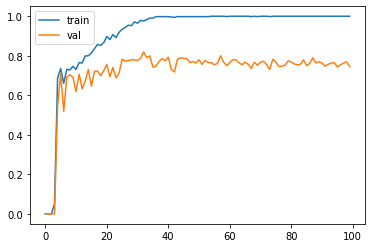

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.447368).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.447368 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.773109 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.773109 --> 0.786325).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.786325 --> 0.803571).  Saving model ...
Validation acc increased (0.803571 --> 0.848000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 

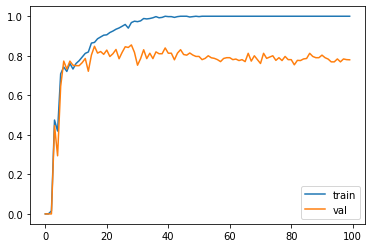

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.366197).  Saving model ...
Validation acc increased (0.366197 --> 0.629213).  Saving model ...
Validation acc increased (0.629213 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.792793).  Saving model ...
Validation acc increased (0.792793 --> 0.803571).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.803571 --> 0.803571).  Saving model ...
Validation acc increased (0.803571 --> 0.813559).  Saving model ...
Validation acc increased (0.813559 --> 0.814815).  Saving model ...


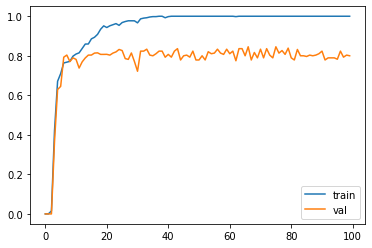

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.625000).  Saving model ...
Validation acc increased (0.625000 --> 0.766667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.766667 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.769231 --> 0.806723).  Saving model ...
Validation acc increased (0.806723 --> 0.806723).  Saving model ...
EarlyStopping counter:

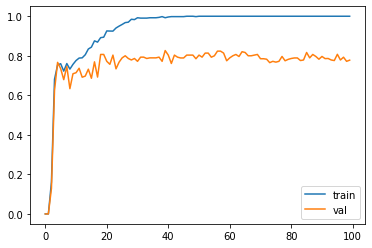

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.388889).  Saving model ...
Validation acc increased (0.388889 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.756757 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.765217 --> 0.796610).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.796610 --> 0.809917).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

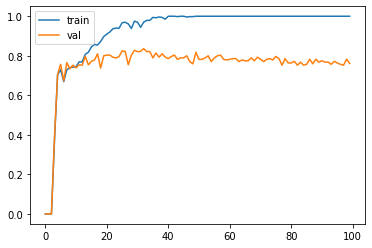

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.268657).  Saving model ...
Validation acc increased (0.268657 --> 0.366197).  Saving model ...
Validation acc increased (0.366197 --> 0.506329).  Saving model ...
Validation acc increased (0.506329 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.730435 --> 0.736842).  Saving model ...
Validation acc increased (0.736842 --> 0.762712).  Saving model ...
Validation acc increased (0.762712 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.771930 --> 0.792453).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200


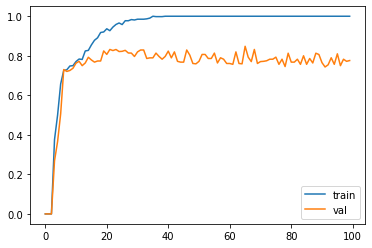

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.732143 --> 0.732143).  Saving model ...
Validation acc increased (0.732143 --> 0.735043).  Saving model ...
Validation acc increased (0.735043 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.738739 --> 0.769231).  Saving model ...
Validation acc increased (0.769231 --> 0.776860).  Saving model 

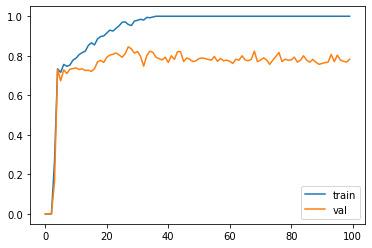

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.618557).  Saving model ...
Validation acc increased (0.618557 --> 0.679612).  Saving model ...
Validation acc increased (0.679612 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.758621 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.765217 --> 0.778761).  Saving model ...
Validation acc increased (0.778761 --> 0.785714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.785714 --> 0.817391).  Saving model ...
Earl

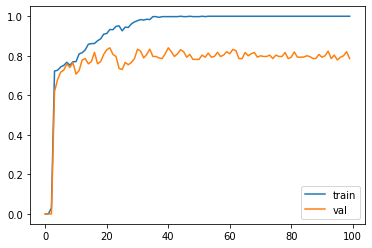

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.720721 --> 0.732673).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732673 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased

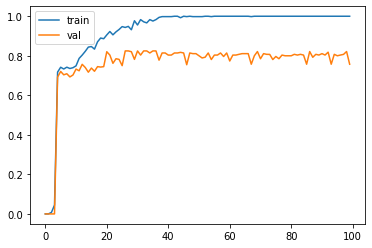

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.294118).  Saving model ...
Validation acc increased (0.294118 --> 0.604167).  Saving model ...
Validation acc increased (0.604167 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.702703).  Saving model ...
Validation acc increased (0.702703 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.717949).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.717949 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.725664 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200


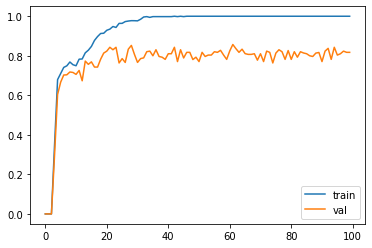

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.742857 --> 0.754717).  Saving model ...
Validation acc increased (0.754717 --> 0.754717).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.754717 --> 0.763636).  Saving model ...
Validation acc increased (0.763636 --> 0.796460).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

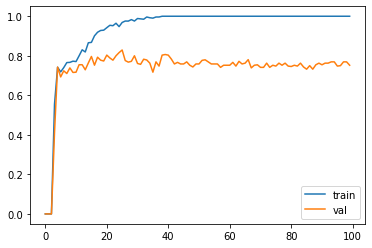

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.770642).  Saving model ...
Validation acc increased (0.770642 --> 0.773585).  Saving model ...
Validation acc increased (0.773585 --> 0.781818).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.781818 --> 0.796117).  Saving model ...
Validation acc increased (0.796117 --> 0.800000).  Saving model ...
Validation acc increased (0.800000 --> 0.807339).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.807339 --> 0.821429).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200


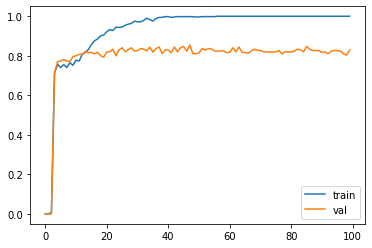

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.493506).  Saving model ...
Validation acc increased (0.493506 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.817391).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.817391 --> 0.824561).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.824561 --> 0.825688).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out

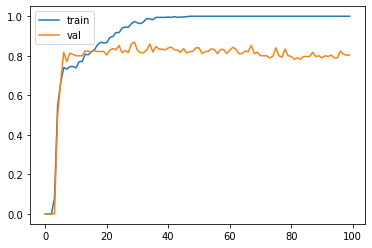

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.441558).  Saving model ...
Validation acc increased (0.441558 --> 0.615385).  Saving model ...
Validation acc increased (0.615385 --> 0.645833).  Saving model ...
Validation acc increased (0.645833 --> 0.763636).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.763636 --> 0.809917).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased

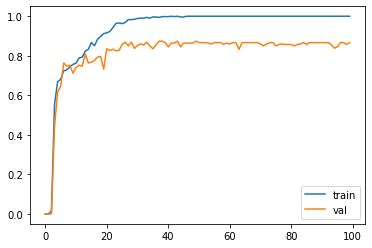

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.568182).  Saving model ...
Validation acc increased (0.568182 --> 0.803279).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.803279 --> 0.803419).  Saving model ...
Validation acc increased (0.803419 --> 0.816667).  Saving model ...
Validation acc increased (0.816667 --> 0.820513).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.820513 --> 0.827586).  Saving model ...
Validation acc increased (0.8275

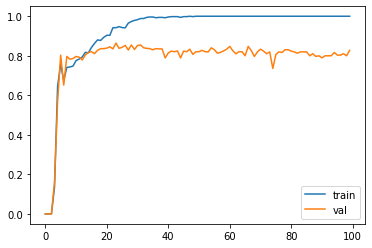

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.551724).  Saving model ...
Validation acc increased (0.551724 --> 0.680412).  Saving model ...
Validation acc increased (0.680412 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.771930 --> 0.796117).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.796117 --> 0.796296).  Saving model ...
Validation acc increased (0.796296 --> 0.807339).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.807339 --> 0.811881).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 

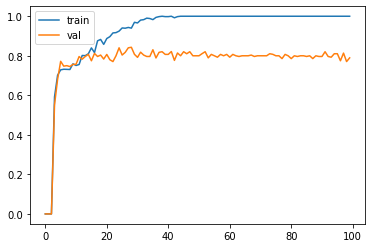

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.629213).  Saving model ...
Validation acc increased (0.629213 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.745098).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.745098 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.779661 --> 0.796610).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5

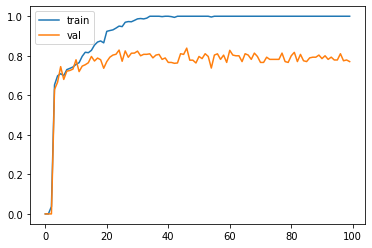

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.294118).  Saving model ...
Validation acc increased (0.294118 --> 0.506329).  Saving model ...
Validation acc increased (0.506329 --> 0.686869).  Saving model ...
Validation acc increased (0.686869 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.762712 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.765217 --> 0.831858).  Saving model ...
EarlyStopping counter: 1 out

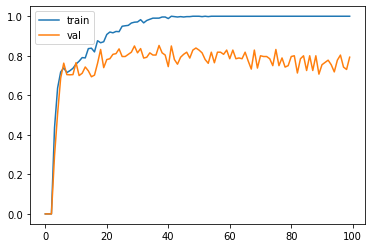

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.555556).  Saving model ...
Validation acc increased (0.555556 --> 0.745763).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.745763 --> 0.766667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc incre

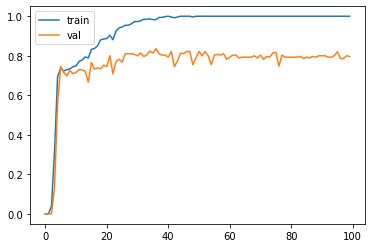

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.767857 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.767857 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.769231 --> 0.780952).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased

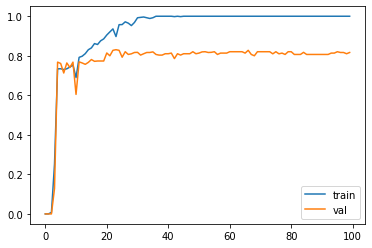

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.383562).  Saving model ...
Validation acc increased (0.383562 --> 0.512195).  Saving model ...
Validation acc increased (0.512195 --> 0.653061).  Saving model ...
Validation acc increased (0.653061 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.752294).  Saving model ...
Validation acc increased (0.752294 --> 0.780488).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.780488 --> 0.786325).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.786325 --> 0.803419).  Saving model ...
Earl

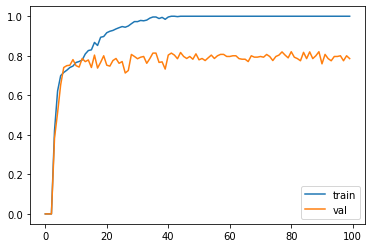

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.426667).  Saving model ...
Validation acc increased (0.426667 --> 0.523810).  Saving model ...
Validation acc increased (0.523810 --> 0.685185).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.685185 --> 0.717949).  Saving model ...
Validation acc increased (0.717949 --> 0.719298).  Saving model ...
Validation acc increased (0.719298 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.719298 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.754386 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.762712 -

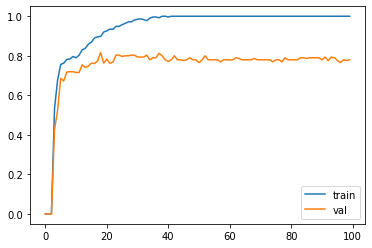

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.550000).  Saving model ...
Validation acc increased (0.550000 --> 0.707071).  Saving model ...
Validation acc increased (0.707071 --> 0.712871).  Saving model ...
Validation acc increased (0.712871 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.742857 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.765217 --> 0.774775).  Saving model ...
Validation acc increased (0.774775 --> 0.788462).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200


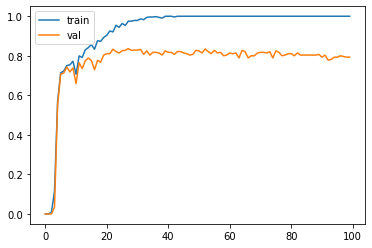

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.617021).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.617021 --> 0.679612).  Saving model ...
Validation acc increased (0.679612 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.724138 --> 0.725664).  Saving model ...
Validation acc increased (0.725664 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.738739 --> 0.775862).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.775862 --> 0.796460).  Saving model ...


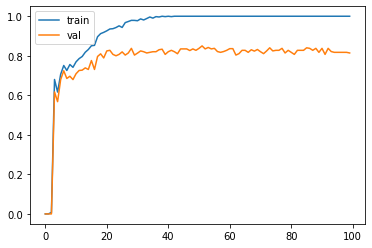

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.342857).  Saving model ...
Validation acc increased (0.342857 --> 0.530120).  Saving model ...
Validation acc increased (0.530120 --> 0.608696).  Saving model ...
Validation acc increased (0.608696 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.722222 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.735849 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.745455).  Saving model ...
Earl

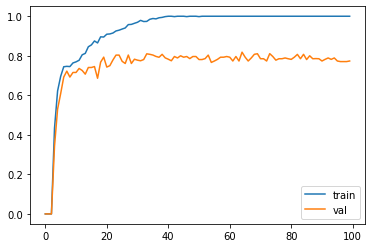

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.361111).  Saving model ...
Validation acc increased (0.361111 --> 0.618557).  Saving model ...
Validation acc increased (0.618557 --> 0.660194).  Saving model ...
Validation acc increased (0.660194 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.737705).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.737705 --> 0.768000).  Saving model ...
EarlyStopping counter: 1 out of 

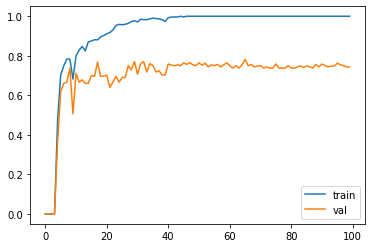

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.163934).  Saving model ...
Validation acc increased (0.163934 --> 0.652632).  Saving model ...
Validation acc increased (0.652632 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.736842 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.741379 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.752137 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

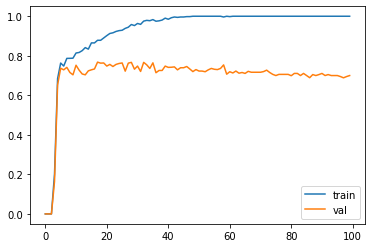

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.068966).  Saving model ...
Validation acc increased (0.068966 --> 0.609756).  Saving model ...
Validation acc increased (0.609756 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.761905 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.761905 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

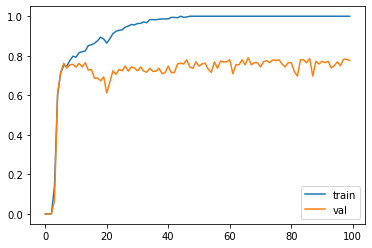

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.595238).  Saving model ...
Validation acc increased (0.595238 --> 0.679612).  Saving model ...
Validation acc increased (0.679612 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.710280 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.724138 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.741379 --> 0.770492).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200


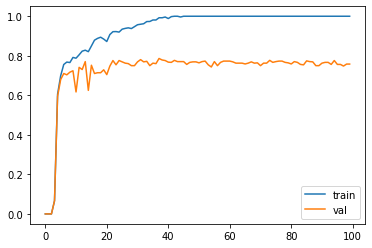

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.531646).  Saving model ...
Validation acc increased (0.531646 --> 0.705882).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.705882 --> 0.717949).  Saving model ...
Validation acc increased (0.717949 --> 0.728814).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 

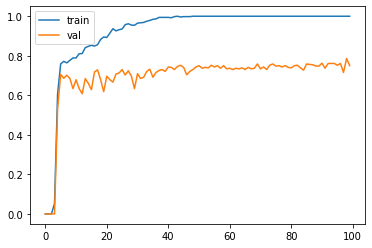

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.361111).  Saving model ...
Validation acc increased (0.361111 --> 0.625000).  Saving model ...
Validation acc increased (0.625000 --> 0.646465).  Saving model ...
Validation acc increased (0.646465 --> 0.648148).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.648148 --> 0.660714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.660714 --> 0.700855).  Saving model ...
EarlyStopping counter: 1 out of 

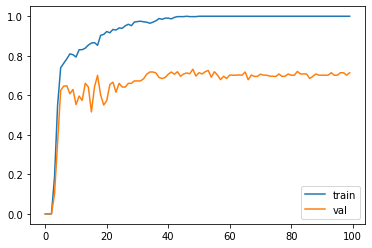

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.323529).  Saving model ...
Validation acc increased (0.323529 --> 0.543210).  Saving model ...
Validation acc increased (0.543210 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.679612).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.679612 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.701754 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


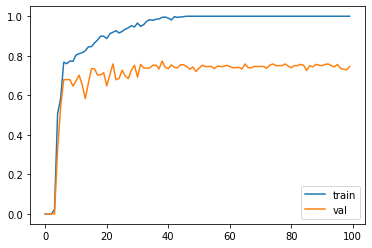

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.652174).  Saving model ...
Validation acc increased (0.652174 --> 0.679612).  Saving model ...
Validation acc increased (0.679612 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733333 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.733333 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out

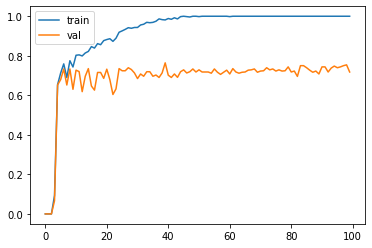

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.100000).  Saving model ...
Validation acc increased (0.100000 --> 0.652632).  Saving model ...
Validation acc increased (0.652632 --> 0.740741).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.740741 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.743363 --> 0.746032).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.746032 --> 0.764228).  Saving model ...
Validation acc increased (0.764228 --> 0.768000).  Saving model 

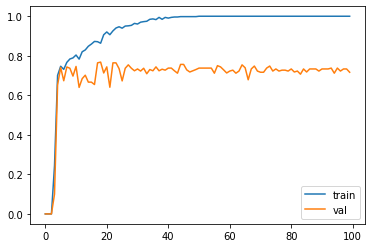

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.631579).  Saving model ...
Validation acc increased (0.631579 --> 0.640000).  Saving model ...
Validation acc increased (0.640000 --> 0.679245).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.679245 --> 0.722689).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter:

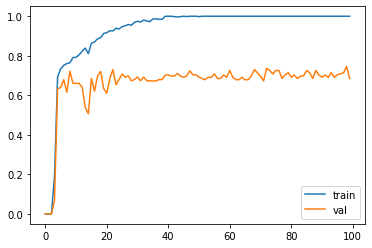

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.688889).  Saving model ...
Validation acc increased (0.688889 --> 0.693069).  Saving model ...
Validation acc increased (0.693069 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.752294 --> 0.754098).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.754098 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 

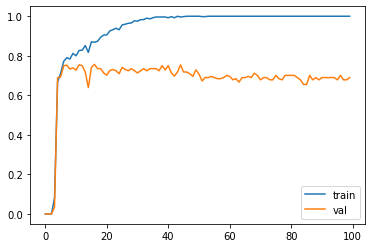

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.735849).  Saving model ...
Validation acc increased (0.735849 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.738739).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.738739 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.762712 --> 0.776860).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200


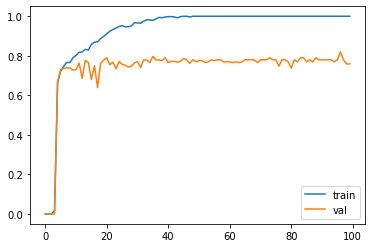

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.268657).  Saving model ...
Validation acc increased (0.268657 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.709091).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.709091 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.713043 --> 0.739496).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out

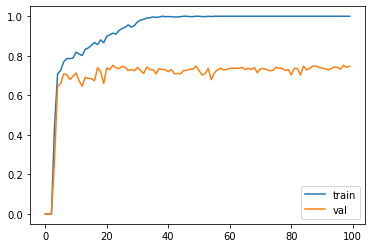

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.558140).  Saving model ...
Validation acc increased (0.558140 --> 0.617021).  Saving model ...
Validation acc increased (0.617021 --> 0.686275).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.686275 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.701754 --> 0.711864).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out

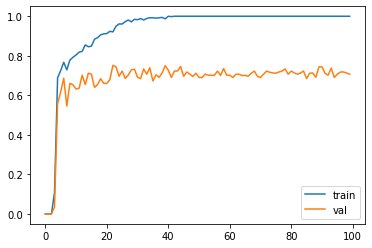

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.585366).  Saving model ...
Validation acc increased (0.585366 --> 0.730769).  Saving model ...
Validation acc increased (0.730769 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.754386 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increas

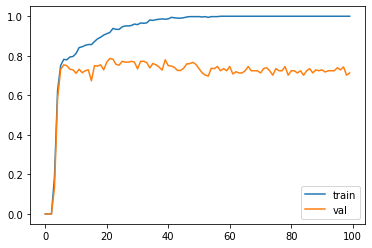

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.568182).  Saving model ...
Validation acc increased (0.568182 --> 0.634615).  Saving model ...
Validation acc increased (0.634615 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.684685).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.684685 --> 0.695652).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.695652 --> 0.696429).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.696429 --> 0.700000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200


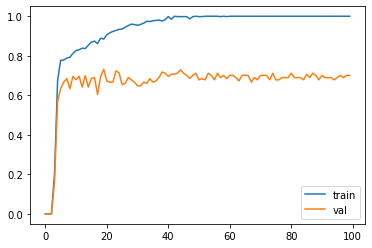

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.604651).  Saving model ...
Validation acc increased (0.604651 --> 0.613861).  Saving model ...
Validation acc increased (0.613861 --> 0.653846).  Saving model ...
Validation acc increased (0.653846 --> 0.690265).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.690265 --> 0.702703).  Saving model ...
Validation acc increased (0.702703 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 

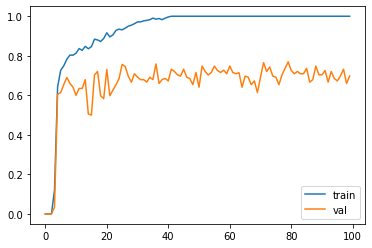

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.652174).  Saving model ...
Validation acc increased (0.652174 --> 0.673469).  Saving model ...
Validation acc increased (0.673469 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.701754 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 

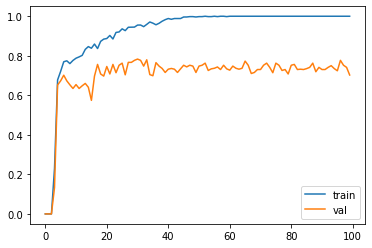

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.672727).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.672727 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.736842 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.754386 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

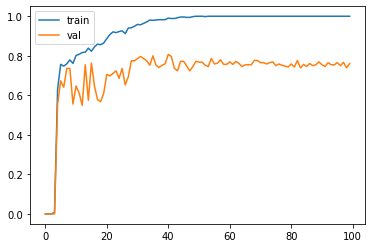

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.525000).  Saving model ...
Validation acc increased (0.525000 --> 0.577320).  Saving model ...
Validation acc increased (0.577320 --> 0.620000).  Saving model ...
Validation acc increased (0.620000 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.714286 --> 0.766667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 

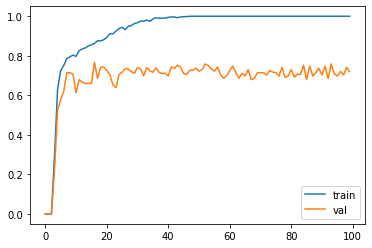

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.680000).  Saving model ...
Validation acc increased (0.680000 --> 0.703704).  Saving model ...
Validation acc increased (0.703704 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.720721 --> 0.730435).  Saving model ...
Validation acc increased (0.7304

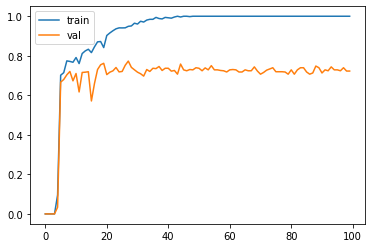

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.410959).  Saving model ...
Validation acc increased (0.410959 --> 0.630435).  Saving model ...
Validation acc increased (0.630435 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.680412).  Saving model ...
Validation acc increased (0.680412 --> 0.693069).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.693069 --> 0.707965).  Saving model ...
Validation acc increased (0.707965 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.710280 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.713043 --> 0.739496).  Saving model ...
EarlySto

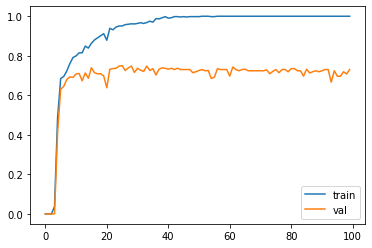

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.644444).  Saving model ...
Validation acc increased (0.644444 --> 0.693069).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.693069 --> 0.704762).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.704762 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.707965 --> 0.717949).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.717949 --> 0.724138).  Saving model ...
Validation acc increased (0.7241

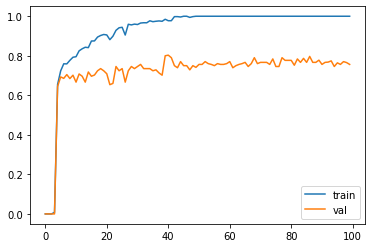

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.547619).  Saving model ...
Validation acc increased (0.547619 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.724138 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping count

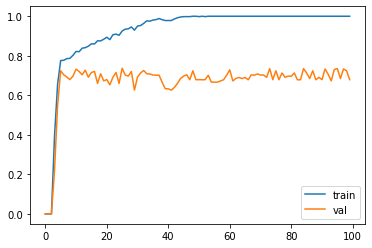

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.163934).  Saving model ...
Validation acc increased (0.163934 --> 0.659574).  Saving model ...
Validation acc increased (0.659574 --> 0.752294).  Saving model ...
Validation acc increased (0.752294 --> 0.756757).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.756757 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increas

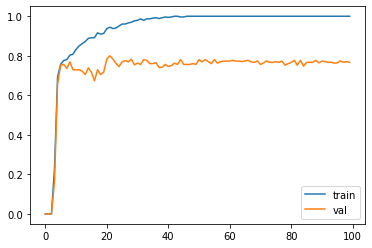

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.578313).  Saving model ...
Validation acc increased (0.578313 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
Validation acc increased (0.727273 --> 0.752000).  S

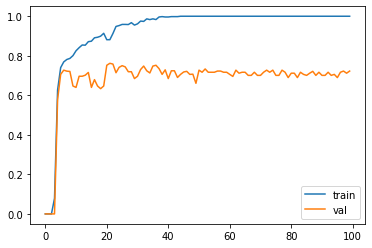

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.536585).  Saving model ...
Validation acc increased (0.536585 --> 0.602151).  Saving model ...
Validation acc increased (0.602151 --> 0.716667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
Validation acc increased (0.716667 --> 0.721311).  S

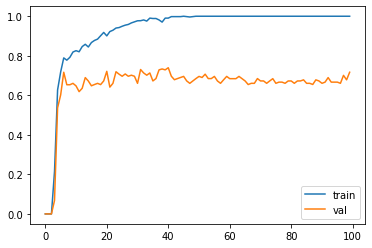

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.651163).  Saving model ...
Validation acc increased (0.651163 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.767857 --> 0.796460).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping co

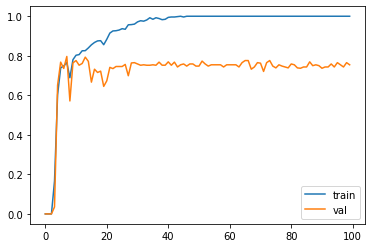

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.378378).  Saving model ...
Validation acc increased (0.378378 --> 0.693878).  Saving model ...
Validation acc increased (0.693878 --> 0.712871).  Saving model ...
Validation acc increased (0.712871 --> 0.730769).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.730769 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.752137 --> 0.776860).  Saving model 

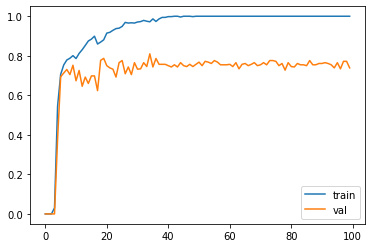

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.347826).  Saving model ...
Validation acc increased (0.347826 --> 0.578313).  Saving model ...
Validation acc increased (0.578313 --> 0.613861).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.613861 --> 0.660194).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.660194 --> 0.685714).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.685714 --> 0.745763).  Saving model ...
Validation acc increased (0.745763 --> 0.764228).  Saving model 

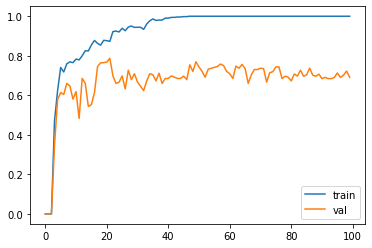

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.366197).  Saving model ...
Validation acc increased (0.366197 --> 0.560976).  Saving model ...
Validation acc increased (0.560976 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.697248).  Saving model ...
Validation acc increased (0.697248 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 o

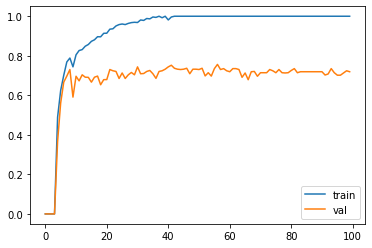

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.068966).  Saving model ...
Validation acc increased (0.068966 --> 0.620690).  Saving model ...
Validation acc increased (0.620690 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.745455 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased

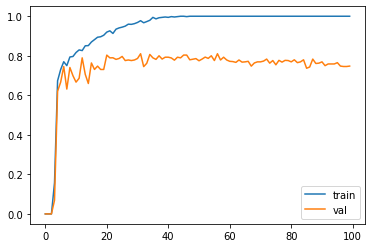

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.698113).  Saving model ...
Validation acc increased (0.698113 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.715596 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.720721 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.727273 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200


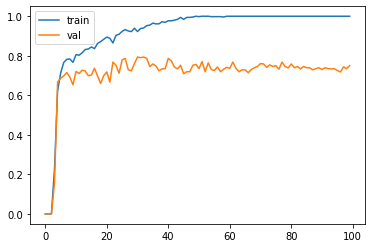

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.405405).  Saving model ...
Validation acc increased (0.405405 --> 0.622222).  Saving model ...
Validation acc increased (0.622222 --> 0.660377).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.660377 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.702703 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.733333 --> 0.741935).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 

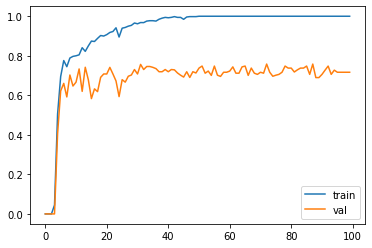

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.673267).  Saving model ...
Validation acc increased (0.673267 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.750000 --> 0.775862).  Saving model ...
Validation acc increased (0.775862 --> 0.781818).  Saving model ...
EarlyStopping counter: 1 out of 

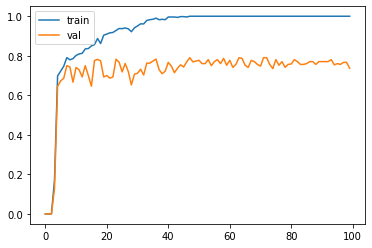

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.703297).  Saving model ...
Validation acc increased (0.703297 --> 0.740741).  Saving model ...
Validation acc increased (0.740741 --> 0.742857).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.742857 --> 0.783333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

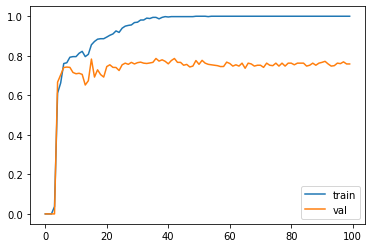

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.701031).  Saving model ...
Validation acc increased (0.701031 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.747826).  Saving model ...
Validation acc increased (0.747826 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.750000 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.756303 --> 0.764228).  Saving model ...
Validation acc increased (0.7642

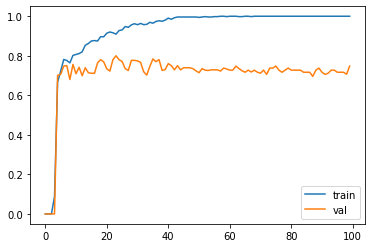

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.215385).  Saving model ...
Validation acc increased (0.215385 --> 0.700000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.700000 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.707965 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.717949).  Saving model ...
Validation acc increased (0.717949 --> 0.776860).  Saving model 

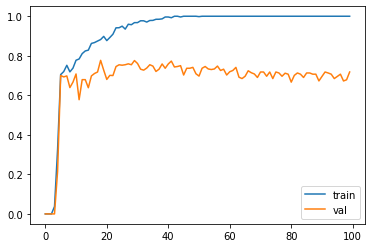

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.679612).  Saving model ...
Validation acc increased (0.679612 --> 0.716667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter

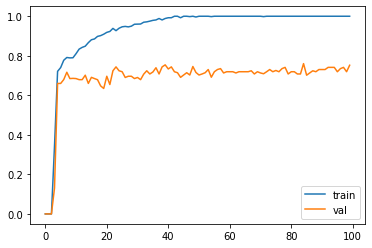

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.347826).  Saving model ...
Validation acc increased (0.347826 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.692308).  Saving model ...
Validation acc increased (0.692308 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.719298 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.750000 --> 0.750000).  Saving model 

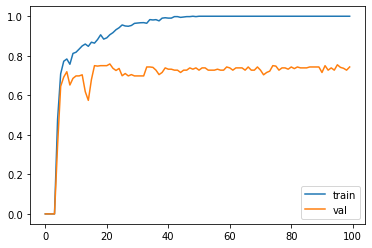

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.129032).  Saving model ...
Validation acc increased (0.129032 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.711538).  Saving model ...
Validation acc increased (0.711538 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.732143 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.735043 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.745455).  Saving model ...


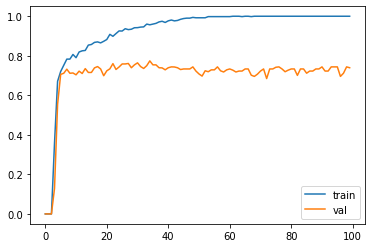

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.554217).  Saving model ...
Validation acc increased (0.554217 --> 0.632653).  Saving model ...
Validation acc increased (0.632653 --> 0.698113).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.698113 --> 0.706897).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.706897 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

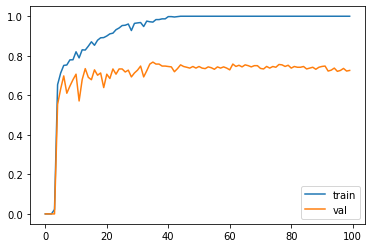

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.342857).  Saving model ...
Validation acc increased (0.342857 --> 0.590909).  Saving model ...
Validation acc increased (0.590909 --> 0.660194).  Saving model ...
Validation acc increased (0.660194 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.707965 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.722689).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.722689 --> 0.743802).  Saving model ...


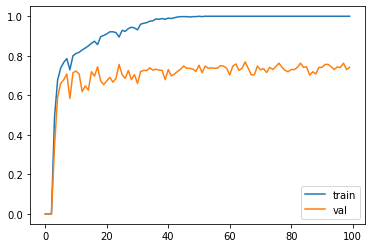

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.632653).  Saving model ...
Validation acc increased (0.632653 --> 0.704762).  Saving model ...
Validation acc increased (0.704762 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.746032).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.746032 --> 0.758621).  Saving model ...
Validation acc increased (0.758621 --> 0.771930).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 

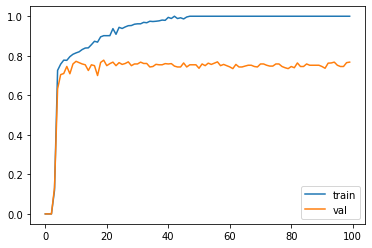

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.560976).  Saving model ...
Validation acc increased (0.560976 --> 0.653061).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.653061 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc in

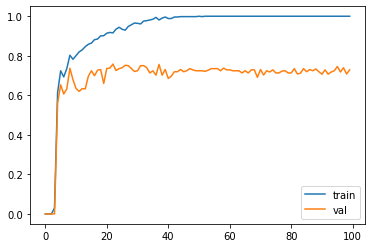

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.512821).  Saving model ...
Validation acc increased (0.512821 --> 0.673469).  Saving model ...
Validation acc increased (0.673469 --> 0.722222).  Saving model ...
Validation acc increased (0.722222 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.762712 --> 0.790323).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

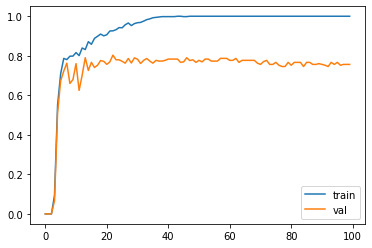

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.506329).  Saving model ...
Validation acc increased (0.506329 --> 0.639175).  Saving model ...
Validation acc increased (0.639175 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.715596 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.730435 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.736842 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.743363 --> 0.806723).  Saving model ...
EarlyStopping counter: 1 out of 

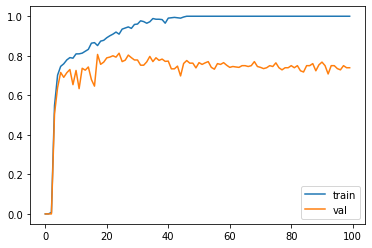

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.635294).  Saving model ...
Validation acc increased (0.635294 --> 0.686275).  Saving model ...
Validation acc increased (0.686275 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.769231 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 

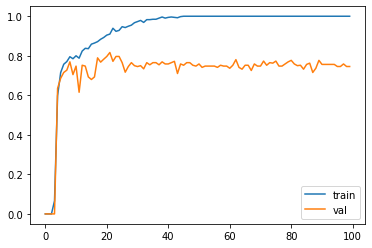

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.035088).  Saving model ...
Validation acc increased (0.035088 --> 0.637363).  Saving model ...
Validation acc increased (0.637363 --> 0.718447).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.718447 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.730435 --> 0.756303).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased

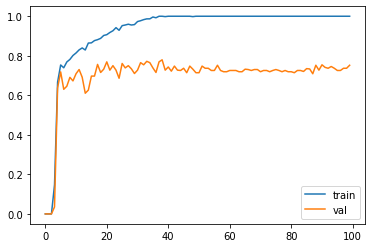

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.242424).  Saving model ...
Validation acc increased (0.242424 --> 0.518519).  Saving model ...
Validation acc increased (0.518519 --> 0.646465).  Saving model ...
Validation acc increased (0.646465 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.715596 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.758621 --> 0.790323).  Saving model ...
EarlyStopping counter: 1 out

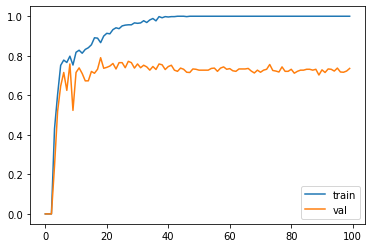

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.611765).  Saving model ...
Validation acc increased (0.611765 --> 0.623656).  Saving model ...
Validation acc increased (0.623656 --> 0.645161).  Saving model ...
Validation acc increased (0.645161 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.713043 --> 0.745763).  Saving model ...
Validation acc increased (0

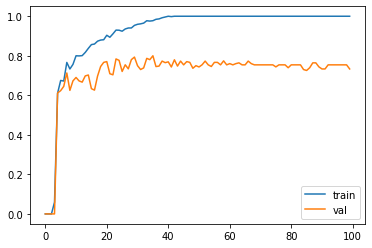

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.536585).  Saving model ...
Validation acc increased (0.536585 --> 0.653061).  Saving model ...
Validation acc increased (0.653061 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.691589).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.691589 --> 0.722689).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.722689 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.728972 --> 0.728972).  Saving model ...


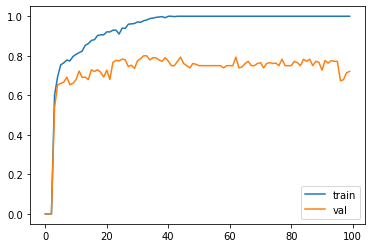

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.613636).  Saving model ...
Validation acc increased (0.613636 --> 0.685714).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.685714 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.736842 --> 0.739496).  Saving model ...
Validation acc increas

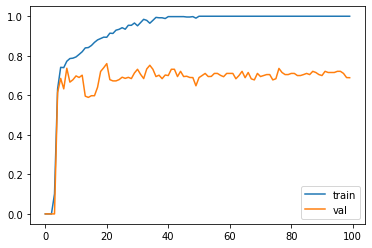

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.366197).  Saving model ...
Validation acc increased (0.366197 --> 0.714286).  Saving model ...
Validation acc increased (0.714286 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.728972 --> 0.758065).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.758065 --> 0.764228).  Saving model ...
EarlyStopping counter: 1 out

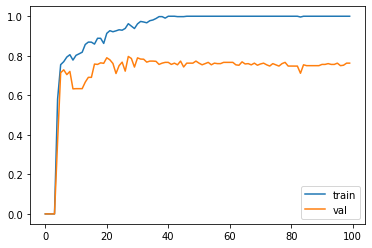

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.703297).  Saving model ...
Validation acc increased (0.703297 --> 0.716981).  Saving model ...
Validation acc increased (0.716981 --> 0.743363).  Saving model ...
Validation acc increased (0.743363 --> 0.745455).  Saving model ...
Validation acc increased (0.745455 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 o

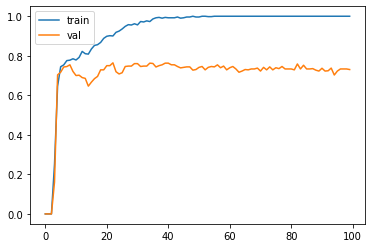

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.480000).  Saving model ...
Validation acc increased (0.480000 --> 0.686869).  Saving model ...
Validation acc increased (0.686869 --> 0.733945).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.733945 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 1

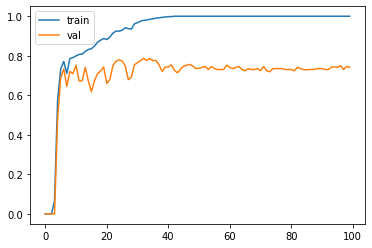

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.338028).  Saving model ...
Validation acc increased (0.338028 --> 0.686869).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.686869 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping cou

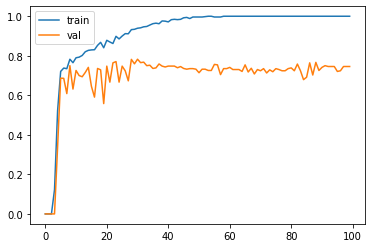

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.523810).  Saving model ...
Validation acc increased (0.523810 --> 0.660000).  Saving model ...
Validation acc increased (0.660000 --> 0.680000).  Saving model ...
Validation acc increased (0.680000 --> 0.728972).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.728972 --> 0.743363).  Saving 

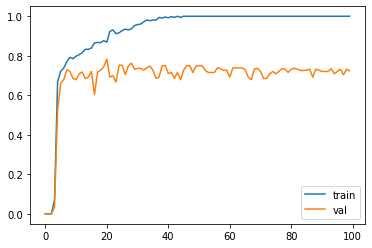

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.680000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.680000 --> 0.789474).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc in

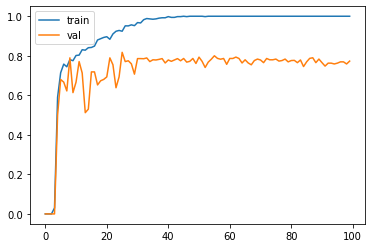

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.133333).  Saving model ...
Validation acc increased (0.133333 --> 0.473684).  Saving model ...
Validation acc increased (0.473684 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping counter: 15 out of 200
EarlyStopping counter: 16 out of 200
EarlyStop

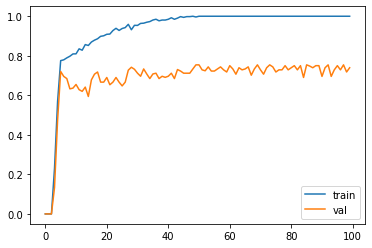

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.602151).  Saving model ...
Validation acc increased (0.602151 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.719298 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.773109 --> 0.786325).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2

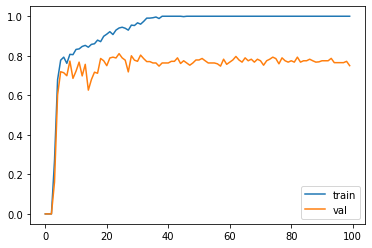

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.366197).  Saving model ...
Validation acc increased (0.366197 --> 0.646465).  Saving model ...
Validation acc increased (0.646465 --> 0.646465).  Saving model ...
Validation acc increased (0.646465 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.732143).  Saving model ...
Validation acc increased (0.732143 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.732143 --> 0.743802).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 

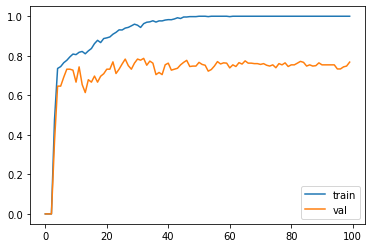

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.551724).  Saving model ...
Validation acc increased (0.551724 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.723810).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.723810 --> 0.737705).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out

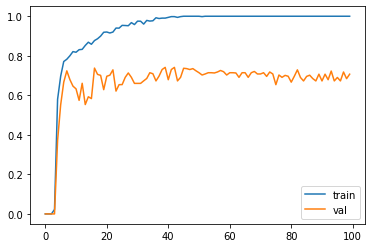

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.298507).  Saving model ...
Validation acc increased (0.298507 --> 0.623656).  Saving model ...
Validation acc increased (0.623656 --> 0.706897).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.706897 --> 0.713043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.713043 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

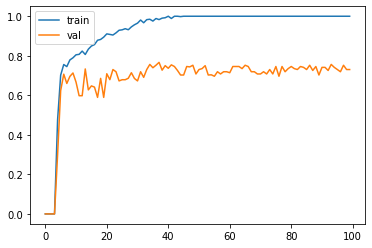

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.518519).  Saving model ...
Validation acc increased (0.518519 --> 0.629213).  Saving model ...
Validation acc increased (0.629213 --> 0.707965).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.707965 --> 0.716667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.716667 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out

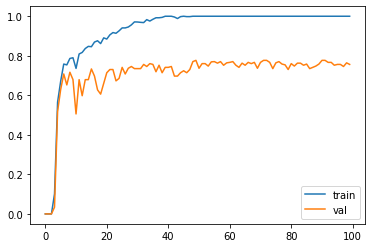

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.613636).  Saving model ...
Validation acc increased (0.613636 --> 0.644444).  Saving model ...
Validation acc increased (0.644444 --> 0.672897).  Saving model ...
Validation acc increased (0.672897 --> 0.679245).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
Validation acc increased (0.679245 --> 0.722689).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out

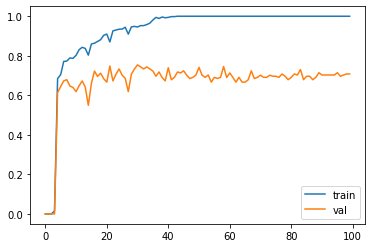

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.558140).  Saving model ...
Validation acc increased (0.558140 --> 0.571429).  Saving model ...
Validation acc increased (0.571429 --> 0.583333).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.583333 --> 0.660194).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.660194 --> 0.694915).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.694915 --> 0.701754).  Saving model ...
Validation acc increased (0.7017

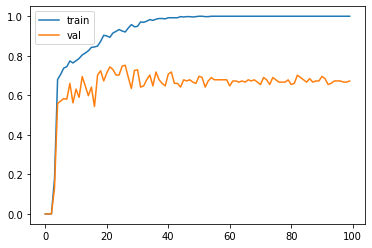

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.400000).  Saving model ...
Validation acc increased (0.400000 --> 0.707071).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.707071 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.732143 --> 0.743363).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 

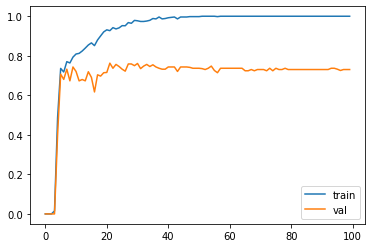

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.660377).  Saving model ...
Validation acc increased (0.660377 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.724138 --> 0.724138).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.724138 --> 0.728814).  Saving model ...
Validation acc increased (0.728814 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.735043 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200


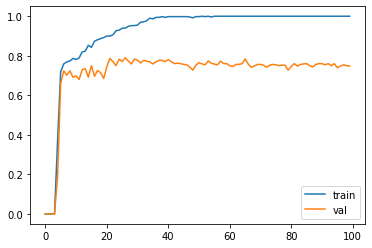

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.067797).  Saving model ...
Validation acc increased (0.067797 --> 0.493506).  Saving model ...
Validation acc increased (0.493506 --> 0.660000).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.660000 --> 0.673077).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.673077 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.679245).  Saving model ...
Validation acc increased (0.679245 --> 0.720721).  Saving model ...
Validation acc increased (0.720721 --> 0.743363).  Saving model ...


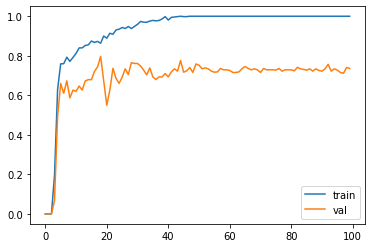

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.581395).  Saving model ...
Validation acc increased (0.581395 --> 0.637363).  Saving model ...
Validation acc increased (0.637363 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
Validation acc increased (0.701754 --> 0.701754).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increas

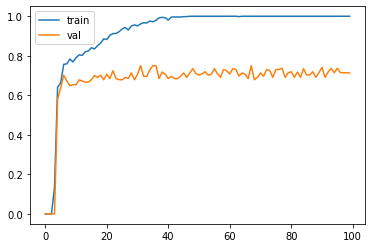

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.645833).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.645833 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.710280 --> 0.736842).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counte

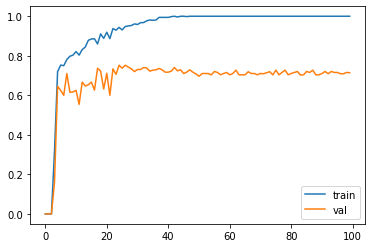

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.272727).  Saving model ...
Validation acc increased (0.272727 --> 0.585366).  Saving model ...
Validation acc increased (0.585366 --> 0.680000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.680000 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.720721 --> 0.752137).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.752137 --> 0.754098).  Saving model ...
EarlyStopping counter: 1 out of 

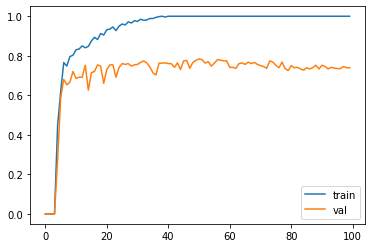

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.578313).  Saving model ...
Validation acc increased (0.578313 --> 0.653061).  Saving model ...
Validation acc increased (0.653061 --> 0.743363).  Saving model ...
Validation acc increased (0.743363 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.747826 --> 0.773109).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 ou

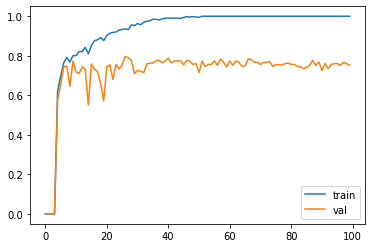

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.575000).  Saving model ...
Validation acc increased (0.575000 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.715596 --> 0.715596).  Saving model ...
Validation acc increased (0.715596 --> 0.732143).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.732143 --> 0.767857).  Saving model ...
EarlyStopping counter: 1 out of 

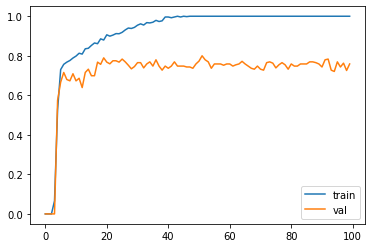

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.338028).  Saving model ...
Validation acc increased (0.338028 --> 0.518519).  Saving model ...
Validation acc increased (0.518519 --> 0.690265).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.690265 --> 0.691589).  Saving model ...
Validation acc increased (0.691589 --> 0.717949).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.717949 --> 0.717949).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.717949 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200


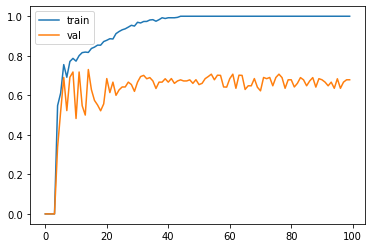

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.693878).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.693878 --> 0.770642).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.770642 --> 0.781818).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.781818 --> 0.786325).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4

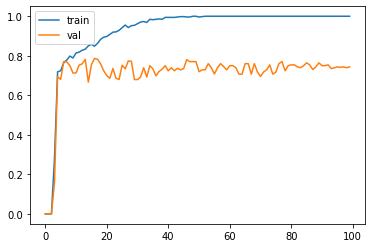

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.131148).  Saving model ...
Validation acc increased (0.131148 --> 0.687500).  Saving model ...
Validation acc increased (0.687500 --> 0.737864).  Saving model ...
Validation acc increased (0.737864 --> 0.761905).  Saving model ...
Validation acc increased (0.761905 --> 0.792793).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.792793 --> 0.792793).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.792793 --> 0.800000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 

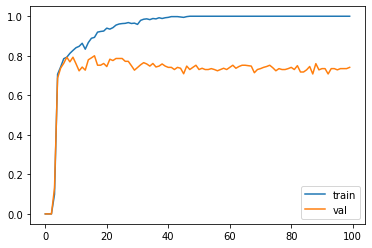

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.033898).  Saving model ...
Validation acc increased (0.033898 --> 0.506024).  Saving model ...
Validation acc increased (0.506024 --> 0.690909).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.690909 --> 0.733333).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping co

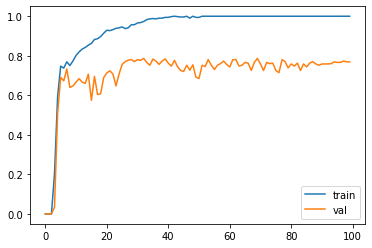

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.620690).  Saving model ...
Validation acc increased (0.620690 --> 0.737864).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.737864 --> 0.738739).  Saving model ...
Validation acc increased (0.738739 --> 0.769231).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.769231 --> 0.774194).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out

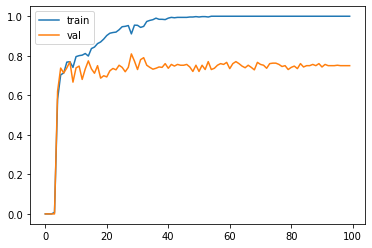

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.187500).  Saving model ...
Validation acc increased (0.187500 --> 0.673267).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.673267 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.702703 --> 0.724138).  Saving model ...
Validation acc increased (0.724138 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
Validation acc increased (0.735043 --> 0.747664).  Saving model ...
EarlyStopping counter: 1 out

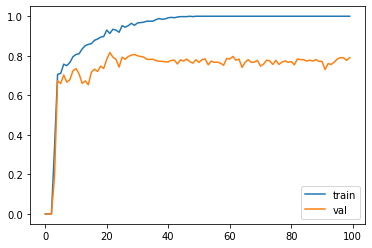

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.564706).  Saving model ...
Validation acc increased (0.564706 --> 0.709091).  Saving model ...
Validation acc increased (0.709091 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.720721 --> 0.745763).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.745763 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

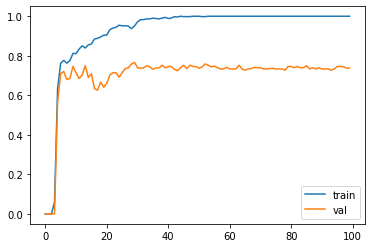

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.158730).  Saving model ...
Validation acc increased (0.158730 --> 0.652174).  Saving model ...
Validation acc increased (0.652174 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.707965).  Saving model ...
Validation acc increased (0.707965 --> 0.719298).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.719298 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
Validation acc increased (0.

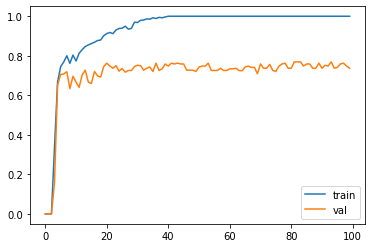

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.444444).  Saving model ...
Validation acc increased (0.444444 --> 0.636364).  Saving model ...
Validation acc increased (0.636364 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.720721 --> 0.730435).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9

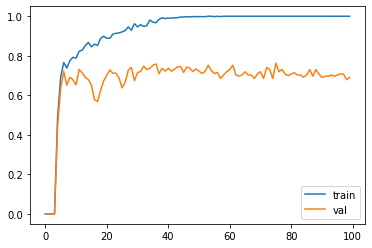

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.347826).  Saving model ...
Validation acc increased (0.347826 --> 0.630435).  Saving model ...
Validation acc increased (0.630435 --> 0.710280).  Saving model ...
Validation acc increased (0.710280 --> 0.714286).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.714286 --> 0.716667).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter:

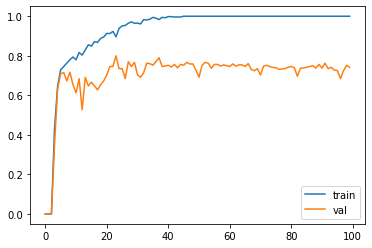

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.242424).  Saving model ...
Validation acc increased (0.242424 --> 0.693878).  Saving model ...
Validation acc increased (0.693878 --> 0.693878).  Saving model ...
Validation acc increased (0.693878 --> 0.707071).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.707071 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter:

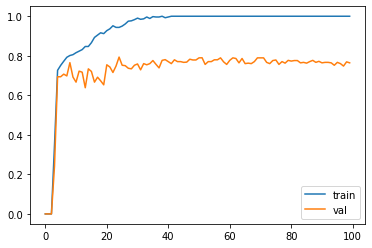

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.272727).  Saving model ...
Validation acc increased (0.272727 --> 0.590909).  Saving model ...
Validation acc increased (0.590909 --> 0.742857).  Saving model ...
Validation acc increased (0.742857 --> 0.759259).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping c

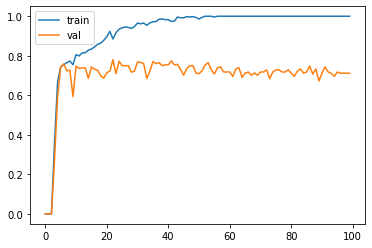

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.101695).  Saving model ...
Validation acc increased (0.101695 --> 0.712871).  Saving model ...
Validation acc increased (0.712871 --> 0.727273).  Saving model ...
Validation acc increased (0.727273 --> 0.775862).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.775862 --> 0.777778).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.777778 --> 0.793388).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.793388 --> 0.803419).  Saving model 

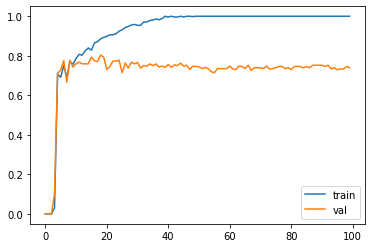

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.161290).  Saving model ...
Validation acc increased (0.161290 --> 0.564706).  Saving model ...
Validation acc increased (0.564706 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.735849).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
Validation acc increased (0.735849 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.741379 --> 0.780488).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out

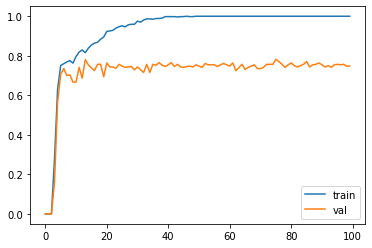

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.644444).  Saving model ...
Validation acc increased (0.644444 --> 0.773585).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
Validation acc increased (0.773585 --> 0.806723).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc in

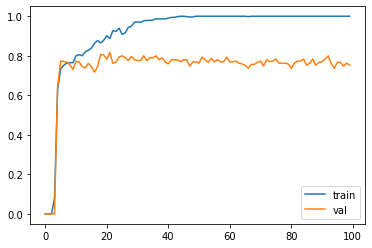

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.218750).  Saving model ...
Validation acc increased (0.218750 --> 0.731183).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.731183 --> 0.752294).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.752294 --> 0.762712).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc incr

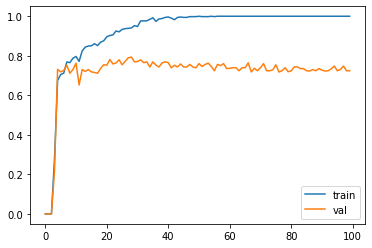

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.371429).  Saving model ...
Validation acc increased (0.371429 --> 0.646465).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.646465 --> 0.710280).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.710280 --> 0.743802).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.743802 --> 0.770492).  Saving model ...
Validation acc increased (0.770492 --> 0.779661).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out

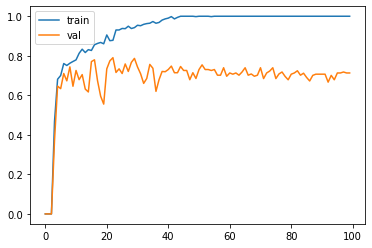

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.500000).  Saving model ...
Validation acc increased (0.500000 --> 0.653846).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.653846 --> 0.673077).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.673077 --> 0.747826).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.747826 --> 0.754386).  Saving model ...
Validation acc increased (0.754386 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.7652

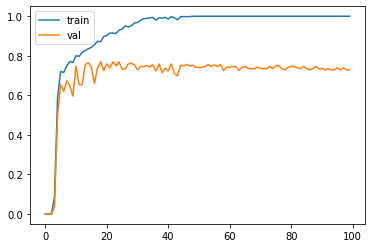

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.066667).  Saving model ...
Validation acc increased (0.066667 --> 0.638298).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.638298 --> 0.685714).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.685714 --> 0.717949).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping cou

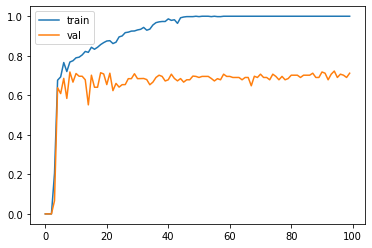

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.518519).  Saving model ...
Validation acc increased (0.518519 --> 0.705882).  Saving model ...
Validation acc increased (0.705882 --> 0.712871).  Saving model ...
Validation acc increased (0.712871 --> 0.754386).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.754386 --> 0.764228).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out

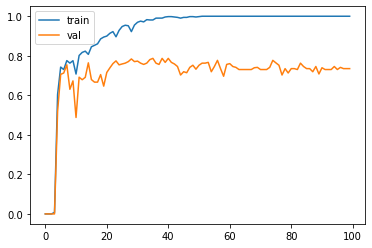

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.098361).  Saving model ...
Validation acc increased (0.098361 --> 0.611765).  Saving model ...
Validation acc increased (0.611765 --> 0.715596).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.715596 --> 0.727273).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.727273 --> 0.735043).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.735043 --> 0.750000).  Saving model ...
Validation acc increased (0.750000 --> 0.758621).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.7586

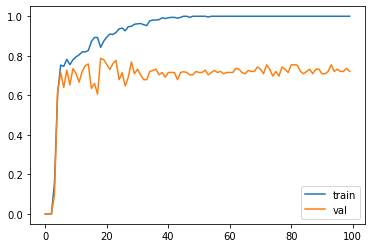

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.487179).  Saving model ...
Validation acc increased (0.487179 --> 0.545455).  Saving model ...
Validation acc increased (0.545455 --> 0.702703).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.702703 --> 0.761905).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
Validation acc increased (0.761905 --> 0.765217).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.765217 --> 0.769231).  Saving mo

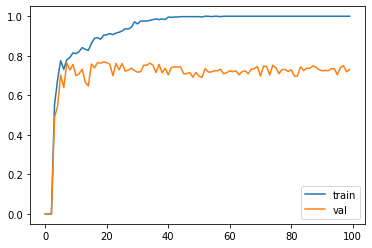

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.034483).  Saving model ...
Validation acc increased (0.034483 --> 0.666667).  Saving model ...
Validation acc increased (0.666667 --> 0.722222).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
Validation acc increased (0.722222 --> 0.725664).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
Validation acc increased (0.725664 --> 0.736842).  Savi

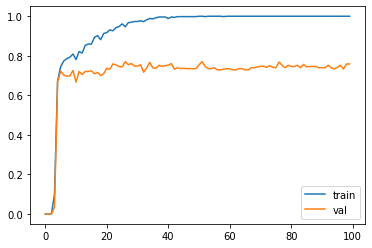

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.190476).  Saving model ...
Validation acc increased (0.190476 --> 0.613636).  Saving model ...
Validation acc increased (0.613636 --> 0.704762).  Saving model ...
Validation acc increased (0.704762 --> 0.720721).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
Validation acc increased (0.720721 --> 0.741379).  Saving model ...
EarlyStopping counter: 1 out of 200
Validation acc increased (0.741379 --> 0.745455).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
Validation acc increased (0.745455 --> 0.745455).  Saving model 

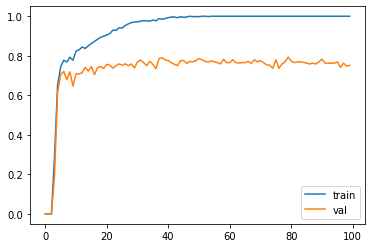

Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.000000).  Saving model ...
Validation acc increased (0.000000 --> 0.272727).  Saving model ...
Validation acc increased (0.272727 --> 0.571429).  Saving model ...
Validation acc increased (0.571429 --> 0.673267).  Saving model ...
Validation acc increased (0.673267 --> 0.750000).  Saving model ...
EarlyStopping counter: 1 out of 200
EarlyStopping counter: 2 out of 200
EarlyStopping counter: 3 out of 200
EarlyStopping counter: 4 out of 200
EarlyStopping counter: 5 out of 200
EarlyStopping counter: 6 out of 200
EarlyStopping counter: 7 out of 200
EarlyStopping counter: 8 out of 200
EarlyStopping counter: 9 out of 200
EarlyStopping counter: 10 out of 200
EarlyStopping counter: 11 out of 200
EarlyStopping counter: 12 out of 200
EarlyStopping counter: 13 out of 200
EarlyStopping counter: 14 out of 200
EarlyStopping c

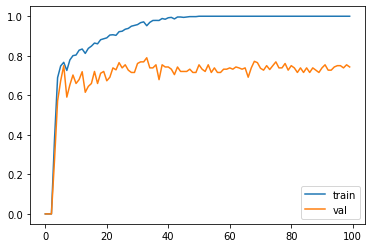

In [ ]:
num_hidden_channels = 3
hidden_channels_dims = [32,24,16]
activation = 'ReLU'
Patience = 200
Dropout = 0.5 # Dropout
Learning_rate = 0.001


for th_cp in [0.7,0.9]:
    for th_pp in [0.1,0.3,0.5,0.7,0.9]:
        start = time.time()

        AD_graph={}
        CN_graph={}
        for sub_id in (AD_dict):
            AD_graph[sub_id] = create_graph(timeseries=AD_dict[sub_id], th_cp=th_cp, th_pp=th_pp, y=0, partition=partition)
        for sub_id in (CN_dict):
            CN_graph[sub_id] = create_graph(timeseries=CN_dict[sub_id], th_cp=th_cp, th_pp=th_pp, y=1, partition=partition)


        final_train_accs = []
        final_test_accs = []
        final_val_accs = []
        all_train_accs = []
        all_val_accs = []
        all_test_accs = []
        final_train_f1s = []
        final_val_f1s = []
        final_test_f1s = []
    

        seeds=100
        for i in range(1,seeds+1):
            # print(i)
            random.seed(i)
            np.random.seed(i)
            
            
            AD_train_data = [AD_graph[sub_id] for sub_id in AD_train[i-1]]
            CN_train_data = [CN_graph[sub_id] for sub_id in CN_train[i-1]]
            residual = len(CN_train_data) - 2*len(AD_train_data)
            extra = random.sample(AD_train_data, residual)
            AD_train_data = AD_train_data*2 + extra

            train_data = AD_train_data + CN_train_data
            train_label = [0]*len(AD_train_data) + [1]*len(CN_train_data)
            train_data,train_label = shuffle(train_data, train_label, random_state=i)

            val_data = [AD_graph[sub_id] for sub_id in AD_val[i-1]] + [CN_graph[sub_id] for sub_id in CN_val[i-1]]
            val_label = [0]*len(AD_val[i-1]) + [1]*len(CN_val[i-1])
            val_data, val_label = shuffle(val_data, val_label, random_state=i)

            test_data = [AD_graph[sub_id] for sub_id in AD_test[i-1]] + [CN_graph[sub_id] for sub_id in CN_test[i-1]]
            test_label = [0]*len(AD_test[i-1]) + [1]*len(CN_test[i-1])
            test_data,test_label = shuffle(test_data, test_label, random_state=i)

            train_losses = []
            val_losses = []
            test_losses = []
            
            train_f1s = []
            val_f1s = []
            test_f1s = []
            
            train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
            val_loader = DataLoader(val_data, batch_size=32, shuffle=True)
            test_loader = DataLoader(test_data, batch_size=32, shuffle=True)

            model = GNN(dim1=116, num_hidden_channels=num_hidden_channels, hidden_channels_dims=hidden_channels_dims)
            if torch.cuda.is_available():
                device = torch.device('cuda:1')
                model.to(device)
            optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
            criterion = torch.nn.CrossEntropyLoss()
            epochs=100

            os.makedirs(f"AAL_manual_core-periphery_f1-score_OVERSAMPLE/{activation}/hidden:{hidden_channels_dims}/th_cp:{th_cp},th_pp:{th_pp}", exist_ok=True)
            checkpt_path = f"AAL_manual_core-periphery_f1-score_OVERSAMPLE/{activation}/hidden:{hidden_channels_dims}/th_cp:{th_cp},th_pp:{th_pp}/checkpoint_seed_{i}.pt"
            early_stopping = EarlyStopping(patience=Patience, verbose=True, path=checkpt_path)

            for epoch in range(1,epochs+1):
                train(model)
                train_f1 = f1(train_loader)
                val_f1 = f1(val_loader)
                train_f1s.append(train_f1)
                val_f1s.append(val_f1)
                early_stopping(val_f1, model)
                if early_stopping.early_stop:
                    print(f"Early stopping at epoch:{epoch}")
    #                 final_val_accs.append(early_stopping.val_acc_max)
                    print(f'GCN graph classification Epoch: {epoch:03d}, Train f1: {train_f1:.4f}, Val f1: {early_stopping.val_acc_max:.4f}')
                    break
                if epoch==epochs:
                    print(f'GCN graph classification Epoch: {epoch:03d}, Train f1: {train_f1:.4f}, Val f1: {early_stopping.val_acc_max:.4f}')
    #                 final_val_accs.append(early_stopping.val_acc_max)

            plt.plot(train_f1s,label='train')
            plt.plot(val_f1s,label='val')
            plt.legend()
            plt.show()



    #         all_train_accs.append(train_accs)
    #         all_val_accs.append(val_accs)


#             print('seed no.:',i)
#             print("GCN Final accuracy average = ", sum(final_val_accs)/len(final_val_accs))
#             print('\n\n')
            
            model = GNN(dim1=116, num_hidden_channels=num_hidden_channels, hidden_channels_dims=hidden_channels_dims)
            if torch.cuda.is_available():
                device = torch.device('cuda:1')
                model.to(device)
            checkpt_path = f"AAL_manual_core-periphery_f1-score_OVERSAMPLE/{activation}/hidden:{hidden_channels_dims}/th_cp:{th_cp},th_pp:{th_pp}"
            model.load_state_dict(torch.load(checkpt_path+f"/checkpoint_seed_{i}.pt"))
            
            final_train_accs.append(test(train_loader))
            final_test_accs.append(test(test_loader))
            final_val_accs.append(test(val_loader))

            final_train_f1s.append(f1(train_loader))
            final_test_f1s.append(f1(test_loader))
            final_val_f1s.append(f1(val_loader))


        with open(f"AAL_manual_core-periphery_f1-score_OVERSAMPLE/{activation}/hidden:{hidden_channels_dims}/th_cp:{th_cp},th_pp:{th_pp}/report", "w") as file:
            file.write(f"num_hidden_channels={num_hidden_channels}\n"
                       f"hidden_channels_dims={hidden_channels_dims}\n"
                       f"Activation={activation}\n"
                       f"Patience={Patience}\n"
                       f"Dropout={Dropout}\n"
                       f"Learning_rate={Learning_rate}\n"
                       f"seeds={seeds}\n"
                       f"epochs={epochs}\n"
                       f"Threshold core-peri={th_cp}\n"
                       f"threshold peri-peri={th_pp}\n"
                       f"train_avg_accuracy={stat.mean(final_train_accs)*100:0.2f}%\n"
                       f"train_accuracy_stdev={stat.stdev(final_train_accs)*100:0.2f}%\n"
                       f"train_avg_f1={stat.mean(final_train_f1s):0.2f}\n"
                       f"train_f1_stdev={stat.stdev(final_train_f1s):0.2f}\n"
                       f"val_avg_accuracy={stat.mean(final_val_accs)*100:0.2f}%\n"
                       f"val_accuracy_stdev={stat.stdev(final_val_accs)*100:0.2f}%\n"
                       f"val_avg_f1={stat.mean(final_val_f1s):0.2f}\n"
                       f"val_f1_stdev={stat.stdev(final_val_f1s):0.2f}\n"
                       f"test_avg_accuracy={stat.mean(final_test_accs)*100:0.2f}%\n"
                       f"test_accuracy_stdev={stat.stdev(final_test_accs)*100:0.2f}%\n"
                       f"test_avg_f1={stat.mean(final_test_f1s):0.2f}\n"
                       f"test_f1_stdev={stat.stdev(final_test_f1s):0.2f}\n")
        end = time.time()
#         with open("time_report","a") as f:
#             f.write(f"time_th_inter:{th_inter},th_intra:{th_intra} = {end-start:0.2f}\n")